<a href="https://colab.research.google.com/github/snehamartin30/COVID/blob/main/Project_12.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**IMPORTING LIBRARIES AND ESSENTINAL MODULES**



In [35]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import BaggingClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.ensemble import VotingRegressor, RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import KNNImputer

**CONNECTING TO GOOGLE DRIVE**

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


**DEFINING FILE PATHS FOR DATASETS**

In [3]:
covid_file_path = '/content/drive/MyDrive/FINAL PROJECT/covid_data.csv'
influenza_file_path = '/content/drive/My Drive/FINAL PROJECT/influenza_data.csv'
socioeconomic_file_path = '/content/drive/My Drive/FINAL PROJECT/socioeconomic_data.csv'
climate_change_file_path = '/content/drive/MyDrive/FINAL PROJECT/climate_change_data.csv'
healthcare_file_path = '/content/drive/MyDrive/FINAL PROJECT/healthcare_data.csv'

**DATA PREPROSESSING**

PREPROCESS EACH DATASET WITH IMPUTATION

In [4]:
def impute_with_sampling(df, column):
    non_zero_non_na_values = df.loc[(df[column] != 0) & (~df[column].isna()), column]
    df.loc[df[column].isna() | (df[column] == 0), column] = np.random.choice(non_zero_non_na_values, size=df.loc[df[column].isna() | (df[column] == 0), column].shape[0], replace=True)
    return df

PREPROCESSING COVID DATASET

In [5]:
# Load the daily COVID data from the CSV file
file_path = '/content/drive/MyDrive/FINAL PROJECT/covid_data.csv'
covid_data = pd.read_csv(file_path)

# Convert the 'date' column to datetime format
covid_data['date'] = pd.to_datetime(covid_data['date'], errors='coerce')

# Sort the data by location and date
covid_data.sort_values(by=['location', 'date'], inplace=True)

# Resample the data on a quarterly basis for each location, using the end of the quarter
quarterly_data = covid_data.groupby('location').resample('Q', on='date').mean(numeric_only=True).reset_index()

# Compute the quarterly rolling average for relevant columns within each location
for column in ['new_cases', 'new_deaths']:
    quarterly_data[f'{column}_quarterly_avg'] = quarterly_data.groupby('location')[column].rolling(window=1).mean().reset_index(0, drop=True)

# Include the 'location' column in the quarterly data
quarterly_data = quarterly_data[['location', 'date'] + [col for col in quarterly_data.columns if col not in ['location', 'date']]]

# Save the quarterly data to a new CSV file
quarterly_data.to_csv('/content/drive/MyDrive/FINAL PROJECT/quarterly_covid_data.csv', index=False)

# Preprocess Quarterly COVID Data
# Load the CSV file
quarterly_covid_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/quarterly_covid_data.csv')

#Column to keep
quarterly_covid_columns_to_keep = ['location','date','total_cases', 'total_deaths','reproduction_rate','people_fully_vaccinated','gdp_per_capita','population','hosp_patients', 'population_density', 'life_expectancy', 'human_development_index']

# Drop unnecessary columns
quarterly_covid_data = quarterly_covid_data[quarterly_covid_columns_to_keep]

# Impute missing or zero values
for column in quarterly_covid_columns_to_keep[1:]:
    quarterly_covid_data = impute_with_sampling(quarterly_covid_data, column)

# Selecting relevant columns
quarterly_covid_data_selected = quarterly_covid_data[['location','date','total_cases','total_deaths','reproduction_rate','people_fully_vaccinated','gdp_per_capita','population', 'population_density', 'life_expectancy', 'human_development_index']]
print(quarterly_covid_data_selected.head())

      location        date   total_cases  total_deaths  reproduction_rate  \
0  Afghanistan  2020-03-31     31.648649      2.333333           1.513333   
1  Afghanistan  2020-06-30  10984.142857    227.670330           1.312088   
2  Afghanistan  2020-09-30  37075.130435   1289.206522           0.871848   
3  Afghanistan  2020-12-31  44457.728261   1707.619565           1.123478   
4  Afghanistan  2021-03-31  55126.988889   2399.800000           0.917000   

   people_fully_vaccinated  gdp_per_capita  population  population_density  \
0             9.552169e+06        1803.987  39835428.0              54.422   
1             3.156000e+03        1803.987  39835428.0              54.422   
2             1.959969e+05        1803.987  39835428.0              54.422   
3             5.030380e+05        1803.987  39835428.0              54.422   
4             2.774467e+06        1803.987  39835428.0              54.422   

   life_expectancy  human_development_index  
0            64.83    

PREPROCESSING INFLUENZA DATASET

In [6]:
#Load Dataset
file_path = '/content/drive/MyDrive/FINAL PROJECT/influenza_data.csv'
influenza_data = pd.read_csv(file_path)

# Columns to impute
influenza_columns = ['All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections', 'Cases of influenza-like illnesses', 'Share of positive tests - All types of surveillance']

# Impute each column
for column in influenza_columns:
    influenza_data = impute_with_sampling(influenza_data, column)

# Selecting relevant columns
influenza_data_selected = influenza_data[['Day', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections', 'Cases of influenza-like illnesses', 'Share of positive tests - All types of surveillance']]
print(influenza_data_selected.head())

# Convert the 'Day' column to datetime format
influenza_data['Day'] = pd.to_datetime(influenza_data['Day'], errors='coerce')

# Check the data types to confirm the conversion
print(influenza_data.dtypes)

# Define the start and end dates for the filter
start_date = '2020-01-01'
end_date = '2022-12-31'

# Filter the data based on the 'Day' column
influenza_data_filtered = influenza_data[(influenza_data['Day'] >= start_date) & (influenza_data['Day'] <= end_date)]

# Select relevant columns if needed
influenza_data_filtered = influenza_data_filtered[['Country','Day', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections', 'Cases of influenza-like illnesses', 'Share of positive tests - All types of surveillance']]

# Resample the data on a quarterly basis for each country, using the end of the quarter
quarterly_influenza_data = influenza_data_filtered.groupby('Country').resample('Q', on='Day').mean().reset_index()

# Include the 'Country' column in the quarterly data
quarterly_influenza_data = quarterly_influenza_data[['Country', 'Day'] + [col for col in quarterly_influenza_data.columns if col not in ['Country', 'Day']]]

# Save the quarterly data to a new CSV file
filtered_file_path = '/content/drive/MyDrive/FINAL PROJECT/quarterly_influenza_data.csv'
quarterly_influenza_data.to_csv(filtered_file_path, index=False)

# Print the first few rows and the shape of the quarterly data
print(quarterly_influenza_data.head())

          Day  All strains - All types of surveillance  \
0  2009-09-28                                     17.0   
1  2009-10-05                                      8.0   
2  2009-10-12                                      1.0   
3  2009-10-19                                     98.0   
4  2009-10-26                                     64.0   

   Reported deaths caused by severe acute respiratory infections  \
0                                               54.0               
1                                               56.0               
2                                               72.0               
3                                                2.0               
4                                                1.0               

   Cases of influenza-like illnesses  \
0                               91.0   
1                             1848.0   
2                             1090.0   
3                               40.0   
4                               38.0   

 

PREPROCESSING SOCIOECONOMIC DATASET

In [7]:
#Load Dataset
file_path = '/content/drive/MyDrive/FINAL PROJECT/socioeconomic_data.csv'
socioeconomic_data = pd.read_csv(file_path)

# Columns to impute
socioeconomic_columns = ['Latitude','Country']

# Impute each column
for column in socioeconomic_columns:
    socioeconomic_data = impute_with_sampling(socioeconomic_data, column)

# Selecting relevant columns
socioeconomic_data_selected = socioeconomic_data[['Latitude','Country']]
print(socioeconomic_data_selected.head())


    Latitude      Country
0  33.939110  Afghanistan
1  41.153332      Albania
2  28.033886      Algeria
3  42.506285      Andorra
4 -11.202692       Angola


PREPROCESSING CLIMATE DATASET

In [8]:
# Load the Dataset
climate_file_path = '/content/drive/MyDrive/FINAL PROJECT/climate_change_data.csv'
climate_data = pd.read_csv(climate_file_path)

# Convert the 'Date' column to datetime format
climate_data['Date'] = pd.to_datetime(climate_data['Date'], errors='coerce')

# Filter the data to include only records from 2020 to 2022
start_date = '2020-01-01'
end_date = '2022-12-31'
climate_data = climate_data[(climate_data['Date'] >= start_date) & (climate_data['Date'] <= end_date)]

# Sort the data by Country and Date
climate_data.sort_values(by=['Country', 'Date'], inplace=True)

# Identify the numeric columns and exclude 'Sea Level Rise'
numeric_columns = ['Temperature', 'CO2 Emissions', 'Precipitation', 'Humidity', 'Wind Speed']

# Group by 'Country' and resample the numeric data on a quarterly basis
quarterly_numeric_data = climate_data.groupby('Country').resample('Q', on='Date')[numeric_columns].mean().reset_index()

# Impute NaN values using sampling imputation
def impute_by_sampling(data, column):
    """Impute missing values in a column by sampling from non-missing values."""
    non_missing_values = data[column].dropna().values
    missing_indices = data[column].isna()
    sampled_values = np.random.choice(non_missing_values, size=missing_indices.sum(), replace=True)
    data.loc[missing_indices, column] = sampled_values

# Apply the sampling imputation to each numeric column
for col in numeric_columns:
    impute_by_sampling(quarterly_numeric_data, col)

# Ensure the 'Country' column is included in the quarterly data
quarterly_climate_data = quarterly_numeric_data[['Country', 'Date'] + numeric_columns]

# Save the quarterly data to a new CSV file
quarterly_file_path = '/content/drive/MyDrive/FINAL PROJECT/quarterly_climate_data.csv'  # Adjust this path as needed
quarterly_climate_data.to_csv(quarterly_file_path, index=False)

# Print the first few rows and the shape of the quarterly data
print(quarterly_climate_data.head())

       Country       Date  Temperature  CO2 Emissions  Precipitation  \
0  Afghanistan 2020-03-31     6.675645     377.580973      97.282837   
1  Afghanistan 2020-06-30    17.343835     408.310546      43.167817   
2  Afghanistan 2020-09-30    12.633614     413.909722      77.489223   
3  Afghanistan 2020-12-31    12.172574     420.290276      72.090543   
4  Afghanistan 2021-03-31    19.358622     421.414117      12.414691   

    Humidity  Wind Speed  
0  35.274872   39.198311  
1  55.405668   20.583676  
2  62.478262   25.358500  
3  42.962654   42.619106  
4  31.247389   23.747201  


PREPROCESSING HEALTHCARE DATASET

In [9]:
# Load the healthcare dataset
healthcare_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/healthcare_data.csv')

# Drop unnecessary columns
columns_to_keep = ['Country Name', 'Year', 'Value']
healthcare_data = healthcare_data[columns_to_keep]

# Drop rows with NaN in 'Year' column, since we cannot process them
healthcare_data = healthcare_data.dropna(subset=['Year'])

# Ensure 'Year' column is an integer
healthcare_data['Year'] = healthcare_data['Year'].astype(int)

# Create a 'date' column for the end of each year
healthcare_data['date'] = pd.to_datetime(healthcare_data['Year'].astype(str) + '-12-31')

# Repeat yearly values for each quarter
quarters = ['03-31', '06-30', '09-30', '12-31']
quarterly_rows = []

for idx, row in healthcare_data.iterrows():
    for quarter in quarters:
        new_row = row.copy()
        new_row['date'] = pd.to_datetime(f"{row['Year']}-{quarter}")
        quarterly_rows.append(new_row)

healthcare_quarterly_data = pd.DataFrame(quarterly_rows)

# Rename columns to match other datasets
healthcare_quarterly_data.rename(columns={'Country Name': 'location'}, inplace=True)

# Impute NaN values using sampling imputation
def impute_by_sampling(data, column):
    """Impute missing values in a column by sampling from non-missing values."""
    non_missing_values = data[column].dropna().values
    missing_indices = data[column].isna()
    sampled_values = np.random.choice(non_missing_values, size=missing_indices.sum(), replace=True)
    data.loc[missing_indices, column] = sampled_values

# Apply sampling imputation to the 'Value' column
impute_by_sampling(healthcare_quarterly_data, 'Value')

# Rename 'Value' column to 'health_expenditure'
healthcare_quarterly_data.rename(columns={'Value': 'health_expenditure'}, inplace=True)

# Generate quarterly dates for each year
def expand_to_quarterly(df):
    quarters = ['03-31', '06-30', '09-30', '12-31']
    expanded_data = []
    for _, row in df.iterrows():
        for quarter in quarters:
            date = f"{int(row['Year'])}-{quarter}"
            expanded_data.append({
                'location': row['location'],
                'health_expenditure': row['health_expenditure'],
                'date': date
            })
    return pd.DataFrame(expanded_data)

# Filter data to include only the years 2020 to 2022
healthcare_quarterly_data = healthcare_quarterly_data[
    (healthcare_quarterly_data['date'].dt.year >= 2020) & (healthcare_quarterly_data['date'].dt.year <= 2022)
]

# Convert 'date' to datetime format
healthcare_quarterly_data['date'] = pd.to_datetime(healthcare_quarterly_data['date'], format='%Y-%m-%d')

# Save the quarterly data to a new CSV file
healthcare_quarterly_data.to_csv('/content/drive/MyDrive/FINAL PROJECT/healthcare_quarterly_data.csv', index=False)

# Print the first few rows and the shape of the quarterly data
print(healthcare_quarterly_data.head())

                         location  Year  health_expenditure       date
2660                        Aruba  2020         1185.121536 2020-03-31
2660                        Aruba  2020         4281.725594 2020-06-30
2660                        Aruba  2020          512.131835 2020-09-30
2660                        Aruba  2020          219.000000 2020-12-31
2661  Africa Eastern and Southern  2020          208.724017 2020-03-31


APPLYING MAPPING

In [10]:
#Define the location mapping
location_mapping = {
    'Original Country Name 1': 'Standardized Country Name',
    'Original Country Name 2': 'Standardized Country Name',

}

# Rename columns to 'location' for consistency
quarterly_covid_data.rename(columns={'location': 'location'}, inplace=True)
quarterly_influenza_data.rename(columns={'Country': 'location'}, inplace=True)
quarterly_climate_data.rename(columns={'Country': 'location'}, inplace=True)
healthcare_quarterly_data.rename(columns={'Country Name': 'location'}, inplace=True)

# Apply the location mapping to each dataset
quarterly_covid_data['location'] = quarterly_covid_data['location'].replace(location_mapping)
quarterly_influenza_data['location'] = quarterly_influenza_data['location'].replace(location_mapping)
quarterly_climate_data['location'] = quarterly_climate_data['location'].replace(location_mapping)
healthcare_quarterly_data['location'] = healthcare_quarterly_data['location'].replace(location_mapping)

# Print updated datasets to verify changes
print("Updated quarterly_covid_data:")
print(quarterly_covid_data.head())

print("\nUpdated quarterly_influenza_data:")
print(quarterly_influenza_data.head())

print("\nUpdated quarterly_climate_data:")
print(quarterly_climate_data.head())

print("\nUpdated healthcare_quarterly_data:")
print(healthcare_quarterly_data.head())

Updated quarterly_covid_data:
      location        date   total_cases  total_deaths  reproduction_rate  \
0  Afghanistan  2020-03-31     31.648649      2.333333           1.513333   
1  Afghanistan  2020-06-30  10984.142857    227.670330           1.312088   
2  Afghanistan  2020-09-30  37075.130435   1289.206522           0.871848   
3  Afghanistan  2020-12-31  44457.728261   1707.619565           1.123478   
4  Afghanistan  2021-03-31  55126.988889   2399.800000           0.917000   

   people_fully_vaccinated  gdp_per_capita  population  hosp_patients  \
0             9.552169e+06        1803.987  39835428.0     458.413043   
1             3.156000e+03        1803.987  39835428.0   11430.760870   
2             1.959969e+05        1803.987  39835428.0    2001.166667   
3             5.030380e+05        1803.987  39835428.0    1957.955556   
4             2.774467e+06        1803.987  39835428.0    6434.230769   

   population_density  life_expectancy  human_development_index  
0 

In [11]:
# Print column names to verify
print("quarterly_covid_data columns:", quarterly_covid_data.columns)
print("quarterly_influenza_data columns:", quarterly_influenza_data.columns)
print("quarterly_climate_data columns:", quarterly_climate_data.columns)
print("healthcare_quarterly_data columns:", healthcare_quarterly_data.columns)

quarterly_covid_data columns: Index(['location', 'date', 'total_cases', 'total_deaths', 'reproduction_rate',
       'people_fully_vaccinated', 'gdp_per_capita', 'population',
       'hosp_patients', 'population_density', 'life_expectancy',
       'human_development_index'],
      dtype='object')
quarterly_influenza_data columns: Index(['location', 'Day', 'All strains - All types of surveillance',
       'Reported deaths caused by severe acute respiratory infections',
       'Cases of influenza-like illnesses',
       'Share of positive tests - All types of surveillance'],
      dtype='object')
quarterly_climate_data columns: Index(['location', 'Date', 'Temperature', 'CO2 Emissions', 'Precipitation',
       'Humidity', 'Wind Speed'],
      dtype='object')
healthcare_quarterly_data columns: Index(['location', 'Year', 'health_expenditure', 'date'], dtype='object')


In [12]:
# Rename 'Day' column to 'date' in the quarterly_influenza_data dataset
quarterly_influenza_data.rename(columns={'Day': 'date'}, inplace=True)

# Rename 'Date' column to 'date' in the quarterly_climate_data dataset
quarterly_climate_data.rename(columns={'Date': 'date'}, inplace=True)

In [13]:
# Check for duplicate dates within each dataset
print("Quarterly COVID Data:")
print(quarterly_covid_data.groupby(['location', 'date']).size().reset_index(name='counts'))

print("Quarterly Influenza Data:")
print(quarterly_influenza_data.groupby(['location', 'date']).size().reset_index(name='counts'))

print("Quarterly Climate Data:")
print(quarterly_climate_data.groupby(['location', 'date']).size().reset_index(name='counts'))

print("Healthcare Quarterly Data:")
print(healthcare_quarterly_data.groupby(['location', 'date']).size().reset_index(name='counts'))

Quarterly COVID Data:
         location        date  counts
0     Afghanistan  2020-03-31       1
1     Afghanistan  2020-06-30       1
2     Afghanistan  2020-09-30       1
3     Afghanistan  2020-12-31       1
4     Afghanistan  2021-03-31       1
...           ...         ...     ...
2032     Zimbabwe  2021-03-31       1
2033     Zimbabwe  2021-06-30       1
2034     Zimbabwe  2021-09-30       1
2035     Zimbabwe  2021-12-31       1
2036     Zimbabwe  2022-03-31       1

[2037 rows x 3 columns]
Quarterly Influenza Data:
         location       date  counts
0     Afghanistan 2020-03-31       1
1     Afghanistan 2020-06-30       1
2     Afghanistan 2020-09-30       1
3     Afghanistan 2020-12-31       1
4     Afghanistan 2021-03-31       1
...           ...        ...     ...
2349     Zimbabwe 2021-12-31       1
2350     Zimbabwe 2022-03-31       1
2351     Zimbabwe 2022-06-30       1
2352     Zimbabwe 2022-09-30       1
2353     Zimbabwe 2022-12-31       1

[2354 rows x 3 columns]
Qu

MERGING DATASETS

In [14]:
#MERGING COVID,INFLUENZA,CLIMATE AND HEALTHCARE DATASETS

# Remove duplicates before merging
quarterly_covid_data = quarterly_covid_data.drop_duplicates()
quarterly_influenza_data = quarterly_influenza_data.drop_duplicates()
quarterly_climate_data = quarterly_climate_data.drop_duplicates()
healthcare_quarterly_data = healthcare_quarterly_data.drop_duplicates()

# Convert 'date' columns to datetime format in all datasets
quarterly_covid_data['date'] = pd.to_datetime(quarterly_covid_data['date'])
quarterly_influenza_data['date'] = pd.to_datetime(quarterly_influenza_data['date'])
quarterly_climate_data['date'] = pd.to_datetime(quarterly_climate_data['date'])
healthcare_quarterly_data['date'] = pd.to_datetime(healthcare_quarterly_data['date'])

# Merge datasets on 'location' and 'date'
merged_data = quarterly_covid_data.merge(
    quarterly_influenza_data,
    on=['location', 'date'],
    how='inner'
).merge(
    quarterly_climate_data,
    on=['location', 'date'],
    how='inner'
).merge(
    healthcare_quarterly_data,
    on=['location', 'date'],
    how='inner'
)
# Print the merged data to verify
print(merged_data.head())

      location       date   total_cases  total_deaths  reproduction_rate  \
0  Afghanistan 2020-03-31     31.648649      2.333333           1.513333   
1  Afghanistan 2020-06-30  10984.142857    227.670330           1.312088   
2  Afghanistan 2020-09-30  37075.130435   1289.206522           0.871848   
3  Afghanistan 2020-12-31  44457.728261   1707.619565           1.123478   
4  Afghanistan 2021-03-31  55126.988889   2399.800000           0.917000   

   people_fully_vaccinated  gdp_per_capita  population  hosp_patients  \
0             9.552169e+06        1803.987  39835428.0     458.413043   
1             3.156000e+03        1803.987  39835428.0   11430.760870   
2             1.959969e+05        1803.987  39835428.0    2001.166667   
3             5.030380e+05        1803.987  39835428.0    1957.955556   
4             2.774467e+06        1803.987  39835428.0    6434.230769   

   population_density  ...  \
0              54.422  ...   
1              54.422  ...   
2             

In [15]:
#MERING merged_data AND SOCIOECONOMIC DATASET

# Load the datasets
merged_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/finalmerged_data.csv')
socioeconomic_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/socioeconomic_data.csv')

# Rename 'country' to 'location' in socioeconomic_data
socioeconomic_data.rename(columns={'Country': 'location'}, inplace=True)

# Merge socioeconomic_data with merged_data on 'location'
project_merged_data = pd.merge(
    merged_data,
    socioeconomic_data[['location', 'Latitude']],
    on='location',
    how='left'  # Use 'left' join to keep all rows from merged_data
)

# Save the final DataFrame to a CSV file
project_merged_data.to_csv('/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv', index=False)

# Print the first few rows to verify
print("Project Merged Data:")
print(project_merged_data.head())

Project Merged Data:
      location        date   total_cases  total_deaths   new_cases  \
0  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
1  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
2  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
3  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
4  Afghanistan  2020-06-30  10984.142857    227.670330  343.725275   

   new_deaths  reproduction_rate  gdp_per_capita  population  hosp_patients  \
0    0.444444           1.513333        1803.987  39835428.0      12.939394   
1    0.444444           1.513333        1803.987  39835428.0      12.939394   
2    0.444444           1.513333        1803.987  39835428.0      12.939394   
3    0.444444           1.513333        1803.987  39835428.0      12.939394   
4    8.076923           1.312088        1803.987  39835428.0    1847.351648   

   ...  Reported deaths caused by severe acute respiratory infections  \
0  ...    

FILTERING FINAL DATASET INTO FOUR CATEGORIES

In [16]:
developed_nations = ['Bahrain', 'Finland','France', 'Germany','Japan', 'Ireland', 'Italy', 'Netherlands','Singapore','Switzerland', 'United Kingdom', 'United States']
developing_nations = ['China','India','Peru','Philippines','Brazil','Bangladesh','Angola','Haiti','Indonesia','Afghanistan',]
underdeveloped_nations = ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar','Niger','Mozambique','kenya', 'Tanzania','Somalia','Uganda','Central African Republic']
island_nations = ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']

# Strip leading and trailing spaces from 'location' column
project_merged_data['location'] = project_merged_data['location'].str.strip()

# Filter data for each category
developed_countries_data = project_merged_data[project_merged_data['location'].isin(developed_nations)]
developing_countries_data = project_merged_data[project_merged_data['location'].isin(developing_nations)]
underdeveloped_countries_data = project_merged_data[project_merged_data['location'].isin(underdeveloped_nations)]
island_countries_data = project_merged_data[project_merged_data['location'].isin(island_nations)]

# Print the number of entries in each category to verify
print("Developed Countries Data:")
print(developed_countries_data)

print("Developing Countries Data:")
print(developing_countries_data)

print("Underdeveloped Countries Data:")
print(underdeveloped_countries_data)

print("Island Countries Data:")
print(island_countries_data)

Developed Countries Data:
            location        date   total_cases   total_deaths     new_cases  \
368          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
369          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
370          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
371          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
372          Bahrain  2020-09-30  4.759271e+04     168.250000    479.413043   
...              ...         ...           ...            ...           ...   
3991  United Kingdom  2021-09-30  6.324803e+06  131571.891304  32754.380435   
3992  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   
3993  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   
3994  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   
3995  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   

      new_deaths  reprodu

**EXPLORATORY DATA ANALYSIS (EDA)**


--- EDA for Developed Countries ---
Dimensions of the dataset: (264, 24)

Missing values in each column:
location                                                          0
date                                                              0
total_cases                                                       0
total_deaths                                                      0
new_cases                                                         0
new_deaths                                                        0
reproduction_rate                                                 0
gdp_per_capita                                                    0
population                                                        0
hosp_patients                                                     0
population_density                                                0
life_expectancy                                                   0
human_development_index                                           0
All strain

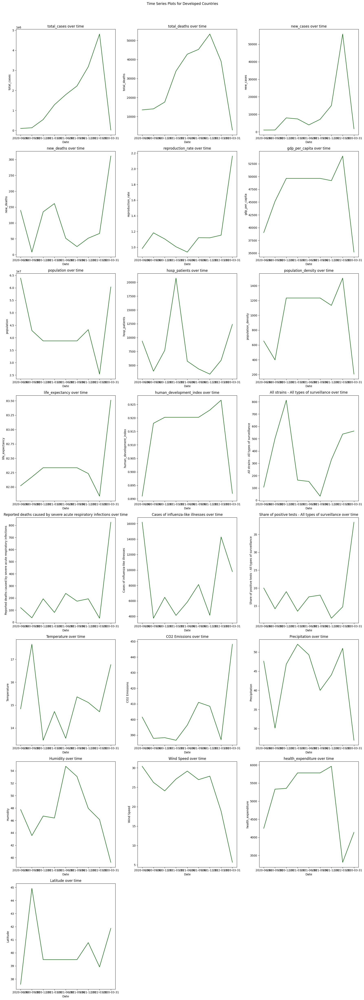

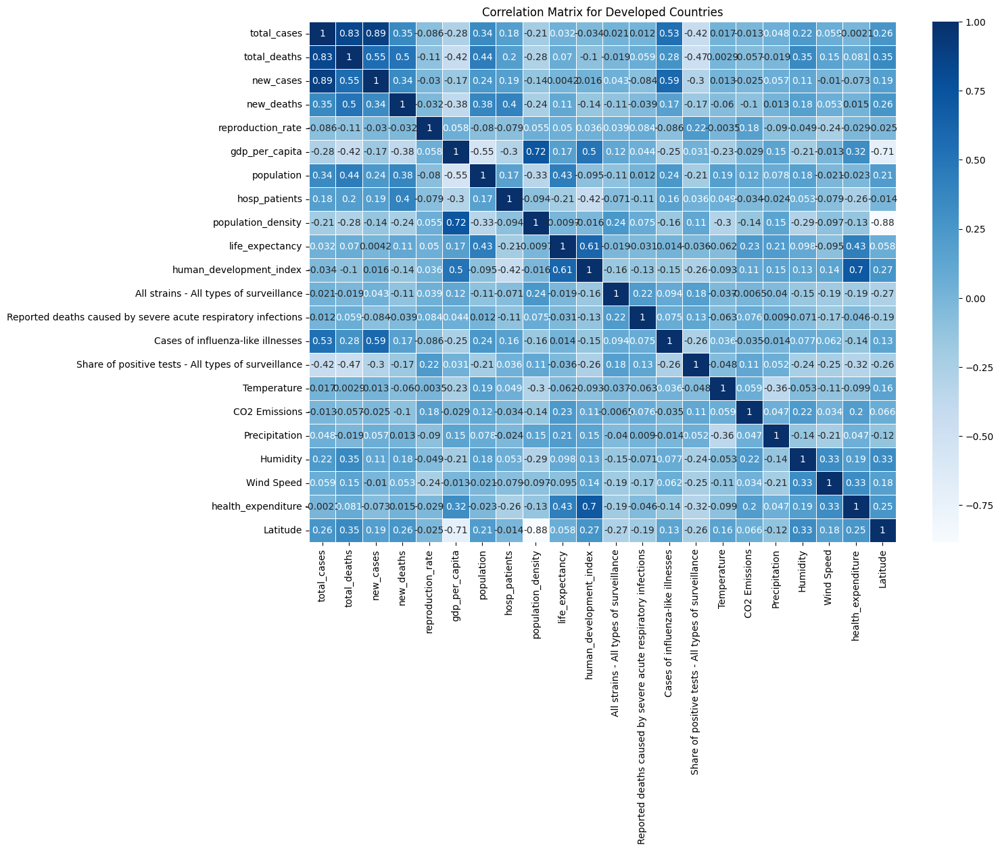


--- EDA for Developing Countries ---
Dimensions of the dataset: (296, 24)

Missing values in each column:
location                                                         0
date                                                             0
total_cases                                                      0
total_deaths                                                     0
new_cases                                                        0
new_deaths                                                       0
reproduction_rate                                                0
gdp_per_capita                                                   0
population                                                       0
hosp_patients                                                    0
population_density                                               0
life_expectancy                                                  0
human_development_index                                          0
All strains - All type

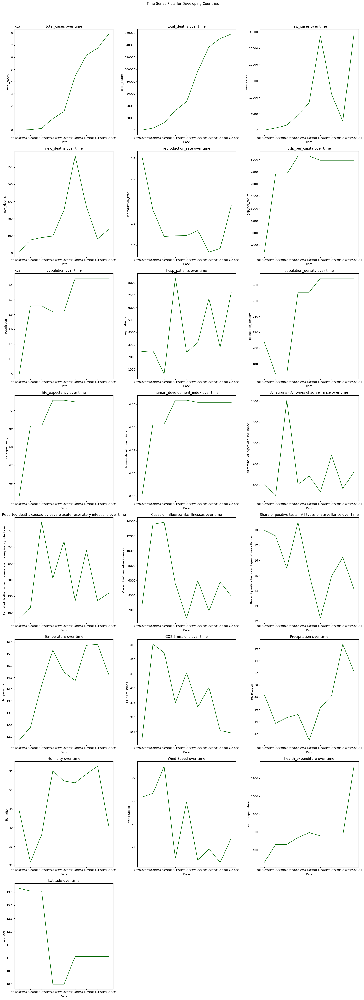

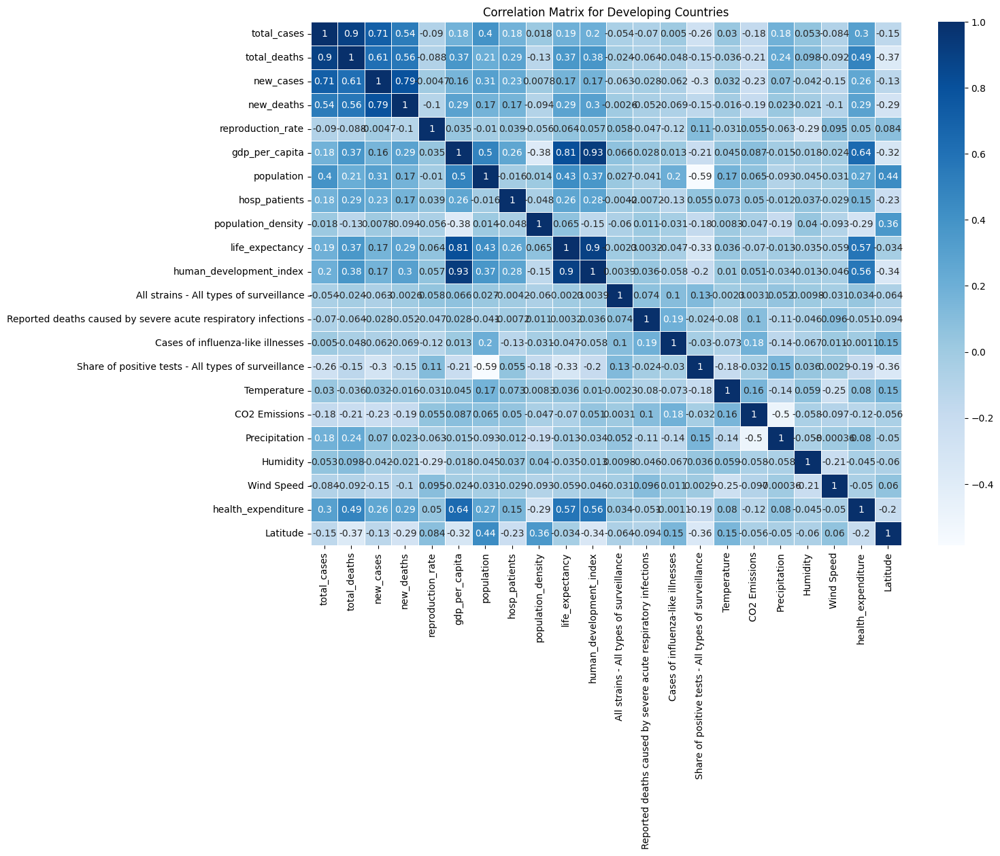


--- EDA for Underdeveloped Countries ---
Dimensions of the dataset: (304, 24)

Missing values in each column:
location                                                         0
date                                                             0
total_cases                                                      0
total_deaths                                                     0
new_cases                                                        0
new_deaths                                                       0
reproduction_rate                                                0
gdp_per_capita                                                   0
population                                                       0
hosp_patients                                                    0
population_density                                               0
life_expectancy                                                  0
human_development_index                                          0
All strains - All 

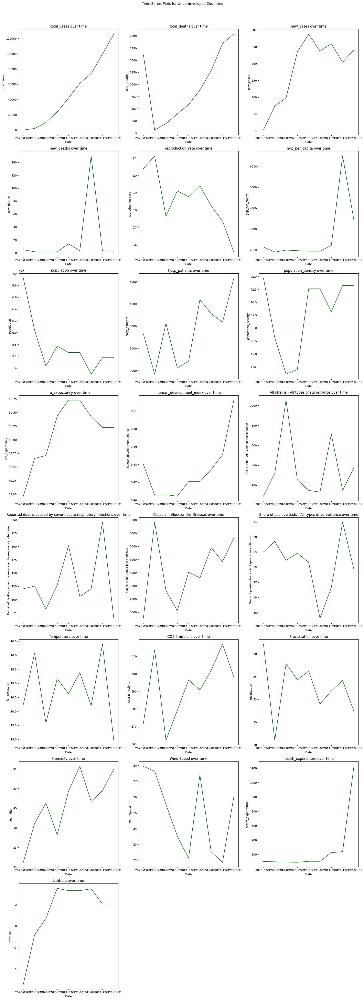

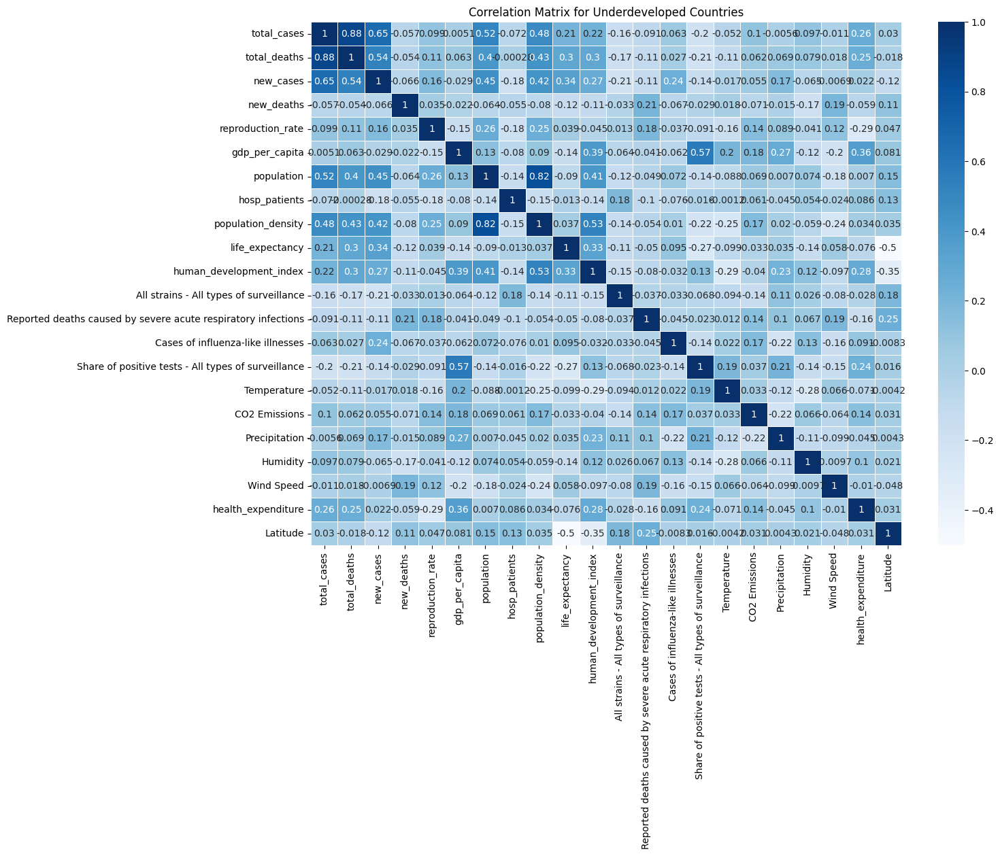


--- EDA for Island Countries ---
Dimensions of the dataset: (320, 24)

Missing values in each column:
location                                                         0
date                                                             0
total_cases                                                      0
total_deaths                                                     0
new_cases                                                        0
new_deaths                                                       0
reproduction_rate                                                0
gdp_per_capita                                                   0
population                                                       0
hosp_patients                                                    0
population_density                                               0
life_expectancy                                                  0
human_development_index                                          0
All strains - All types of

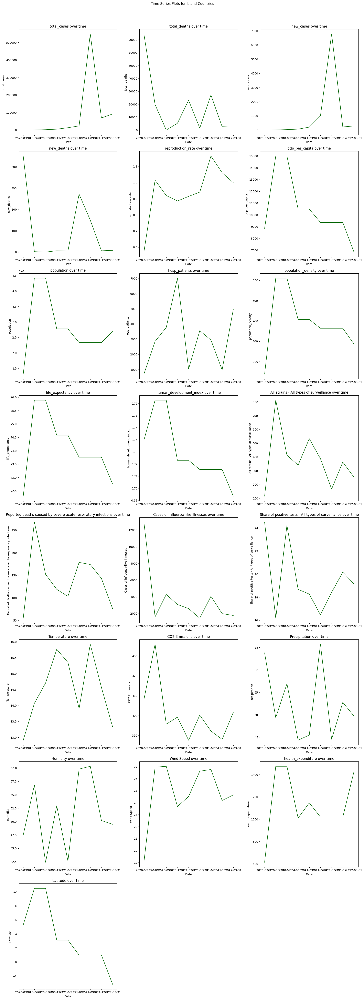

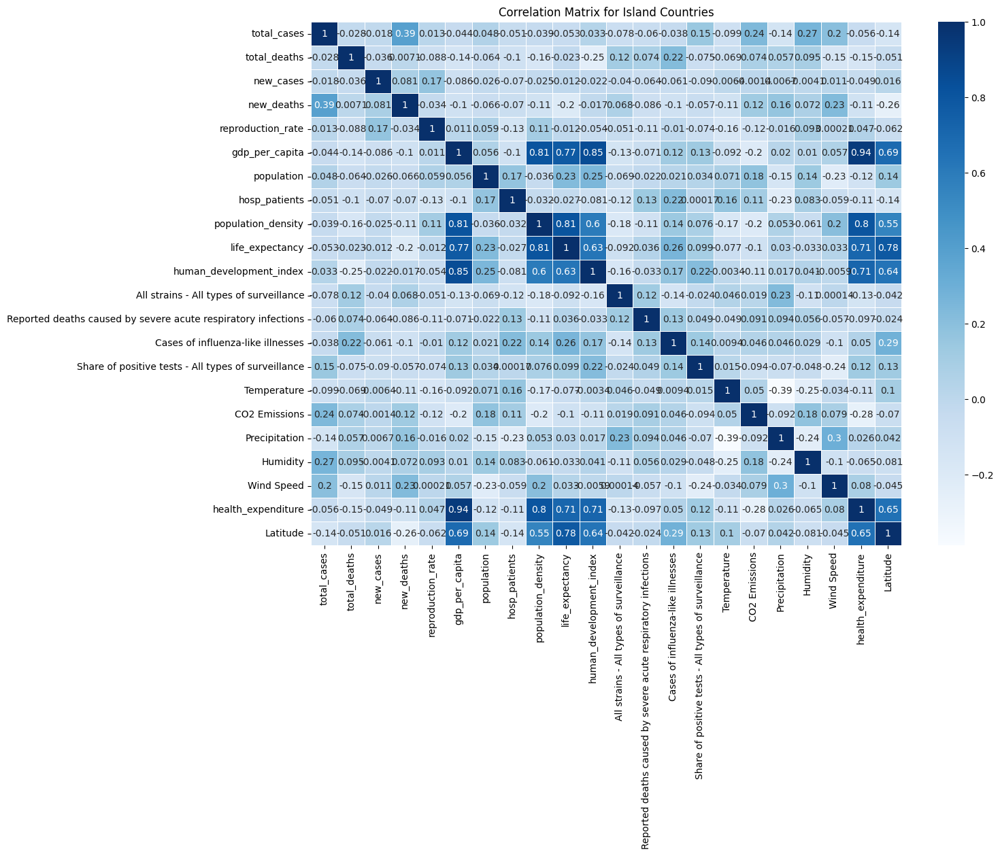

In [17]:
# Check for missing values and handle them
project_merged_data = project_merged_data.dropna(subset=['date', 'total_cases', 'total_deaths'])

# Define a function for EDA
def perform_eda(data, category_name):
    print(f"\n--- EDA for {category_name} Countries ---")

    if data.empty:
        print(f"No data available for {category_name} countries.")
        return

# Check the dimensions of the dataset
    print("Dimensions of the dataset:", data.shape)

# Check for missing values
    print("\nMissing values in each column:")
    print(data.isnull().sum())

# Summary statistics
    print("\nSummary statistics for numerical variables:")
    print(data.describe())

# Univariate Analysis with line plots
    numeric_columns = data.select_dtypes(include=[np.number]).columns
    num_plots = len(numeric_columns)
    num_cols = 3
    num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)

    plt.figure(figsize=(18, num_rows * 6))
    for i, column in enumerate(numeric_columns):
        plt.subplot(num_rows, num_cols, i + 1)
        sns.lineplot(x=data['date'], y=data[column], errorbar=None, color='darkgreen')
        plt.title(f'{column} over time')
        plt.xlabel('Date')
        plt.ylabel(column)

    plt.tight_layout()
    plt.suptitle(f'Time Series Plots for {category_name} Countries', y=1.02)
    plt.show()

# Correlation matrix
    numeric_data = data.select_dtypes(include=[np.number])
    if not numeric_data.empty:
        plt.figure(figsize=(14, 10))
        correlation_matrix = numeric_data.corr()
        sns.heatmap(correlation_matrix, annot=True, cmap='Blues', linewidths=0.5)
        plt.title(f'Correlation Matrix for {category_name} Countries')
        plt.show()
    else:
        print("No numeric data available for correlation matrix.")

# Perform EDA for each category
perform_eda(developed_countries_data, "Developed")
perform_eda(developing_countries_data, "Developing")
perform_eda(underdeveloped_countries_data, "Underdeveloped")
perform_eda(island_countries_data, "Island")

<ipython-input-60-f4cae7cbf4f9>:28: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


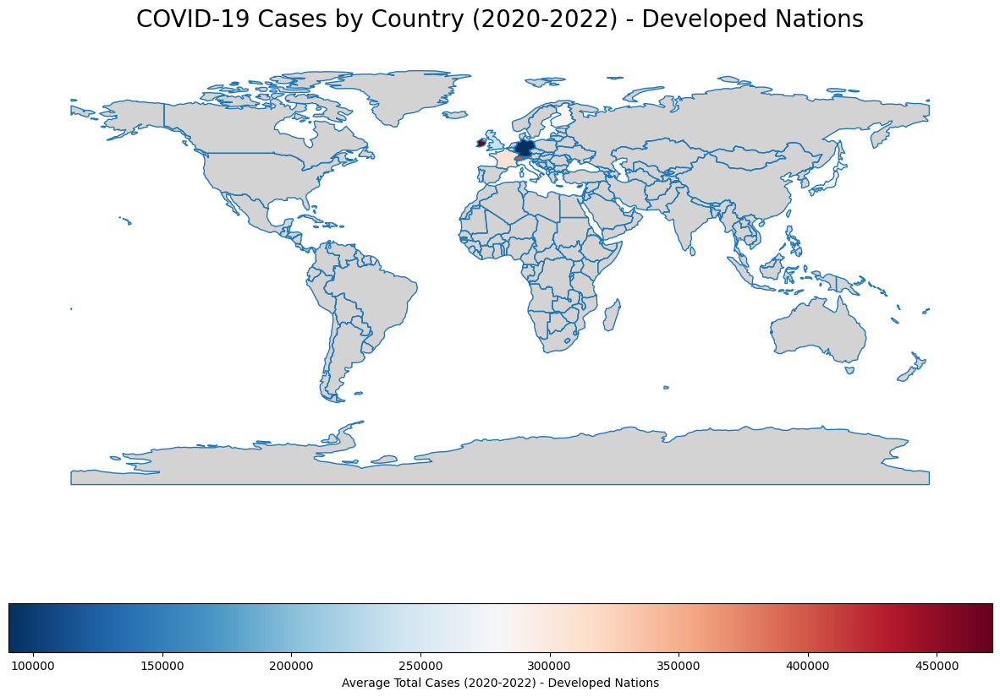

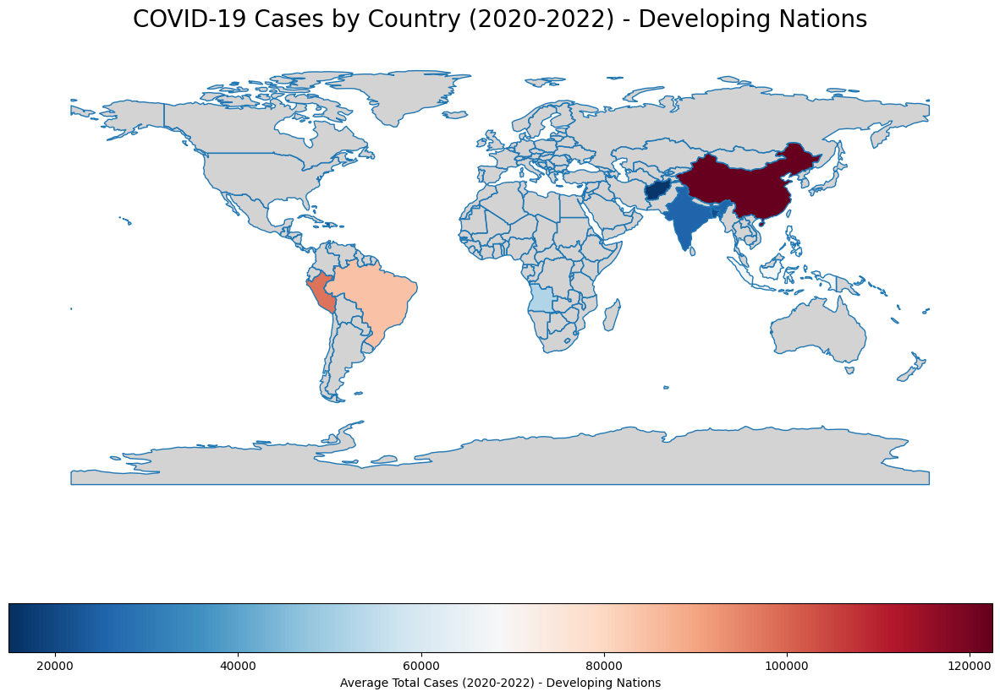

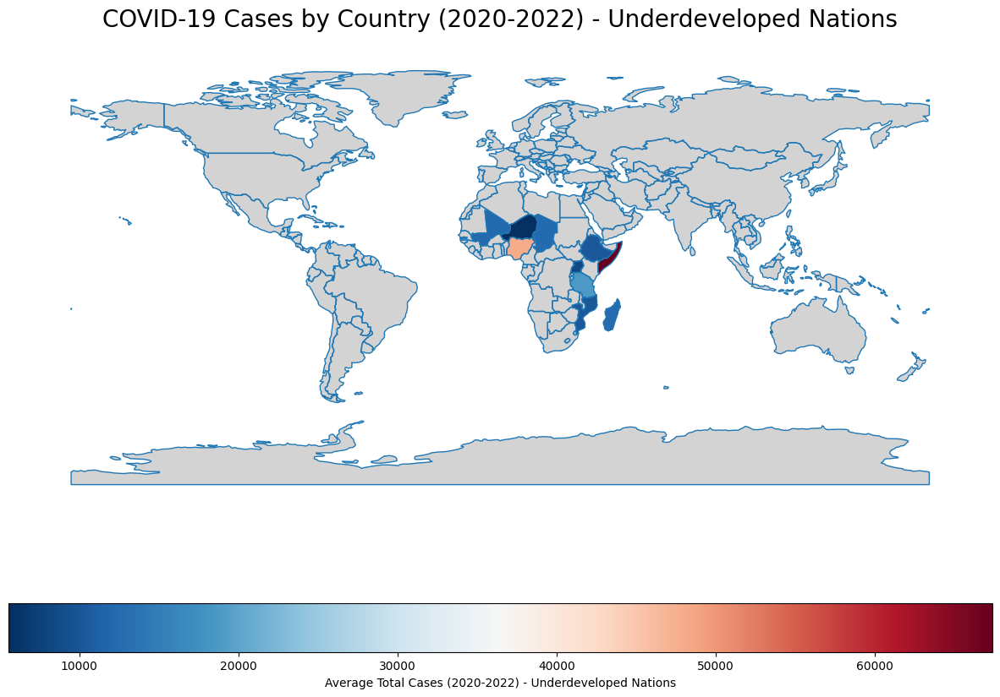

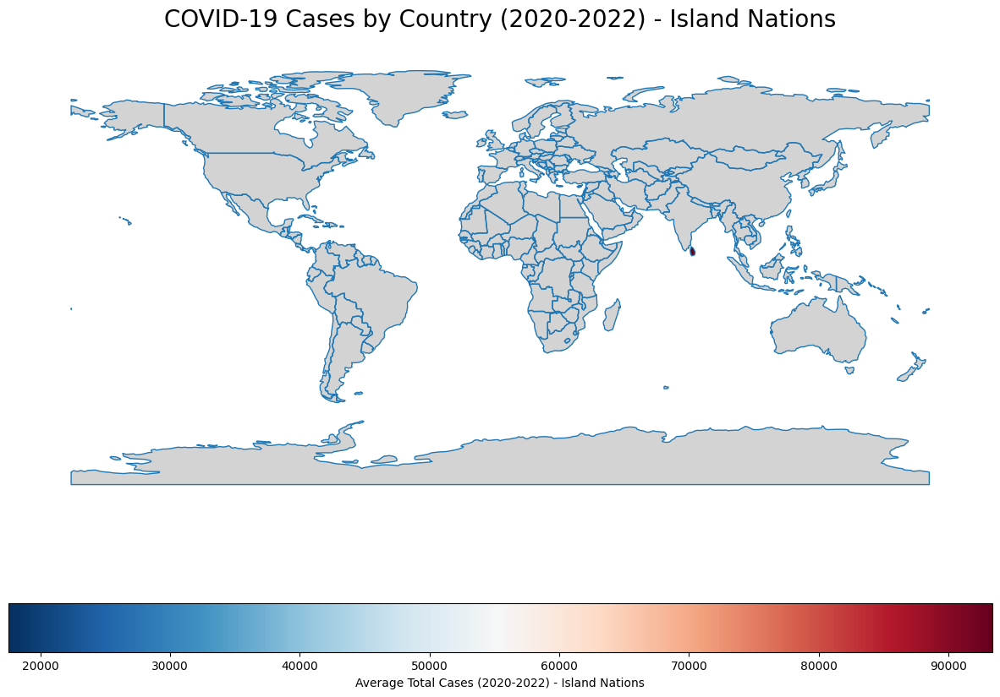

In [ ]:


# Load your dataset (assuming it's already loaded as 'project_merged_data')
project_merged_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv')

# Convert 'date' column to datetime and extract the year
project_merged_data['date'] = pd.to_datetime(project_merged_data['date'])
project_merged_data['year'] = project_merged_data['date'].dt.year

# Remove duplicates and keep relevant data
project_merged_data = project_merged_data.drop_duplicates()

# Function to aggregate data
def aggregate_data_for_category(data):
    aggregated_data = data[data['year'].between(2020, 2022)].groupby('location').agg({
        'gdp_per_capita': 'sum',  # Or use 'sum' if you prefer
        'population_density': 'sum',
        'All strains - All types of surveillance': 'sum',
        'Reported deaths caused by severe acute respiratory infections': 'sum'
    }).reset_index()
    return aggregated_data

# Filter and aggregate data for each category
developed_countries_data = aggregate_data_for_category(project_merged_data[project_merged_data['location'].isin(developed_nations)])
developing_countries_data = aggregate_data_for_category(project_merged_data[project_merged_data['location'].isin(developing_nations)])
underdeveloped_countries_data = aggregate_data_for_category(project_merged_data[project_merged_data['location'].isin(underdeveloped_nations)])
island_countries_data = aggregate_data_for_category(project_merged_data[project_merged_data['location'].isin(island_nations)])

# Load world map data
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Function to plot the data
def plot_category_data(aggregated_data, category_name):
    world_category = world.merge(aggregated_data, how="left", left_on="name", right_on="location")

    # Plot the heatmap using a diverging colormap
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    world.boundary.plot(ax=ax, linewidth=1)
    world_category.plot(column='gdp_per_capita', ax=ax, legend=True, cmap='RdBu_r',  # Diverging colormap
                        missing_kwds={"color": "lightgrey"},
                        legend_kwds={'label': f"Average Total Cases (2020-2022) - {category_name}",
                                     'orientation': "horizontal"})

    # Customize plot
    ax.set_title(f'COVID-19 Cases by Country (2020-2022) - {category_name}', fontdict={'fontsize': 20}, pad=20)
    ax.axis('off')  # Remove axis
    plt.show()

# Plot each category
plot_category_data(developed_countries_data, 'Developed Nations')
plot_category_data(developing_countries_data, 'Developing Nations')
plot_category_data(underdeveloped_countries_data, 'Underdeveloped Nations')
plot_category_data(island_countries_data, 'Island Nations')


**APPLYING MODELS**

XGBOOST

developed - total_cases - Cross-Validation RMSE: 381842.27
developed - total_cases - Validation MSE: 0.79, RMSE: 0.89, MAE: 0.65, R2: 1.0000
developed - total_cases - Test MSE: 0.80, RMSE: 0.90, MAE: 0.63, R2: 1.0000


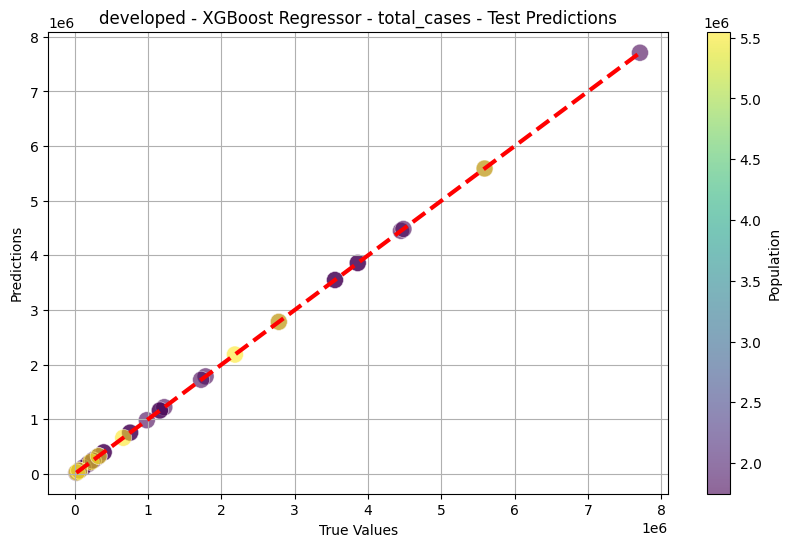

developed - total_deaths - Cross-Validation RMSE: 3807.03
developed - total_deaths - Validation MSE: 0.00, RMSE: 0.02, MAE: 0.01, R2: 1.0000
developed - total_deaths - Test MSE: 0.00, RMSE: 0.02, MAE: 0.01, R2: 1.0000


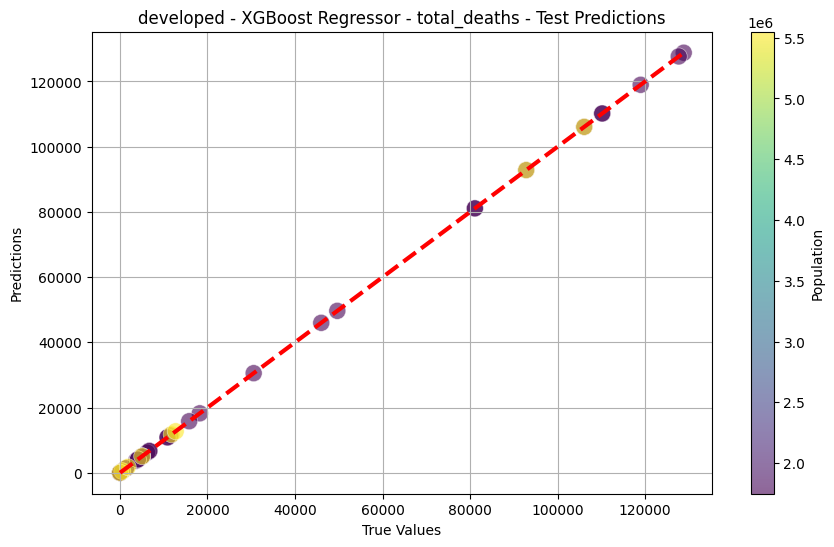

developed - All strains - All types of surveillance - Cross-Validation RMSE: 199.24
developed - All strains - All types of surveillance - Validation MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000
developed - All strains - All types of surveillance - Test MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000


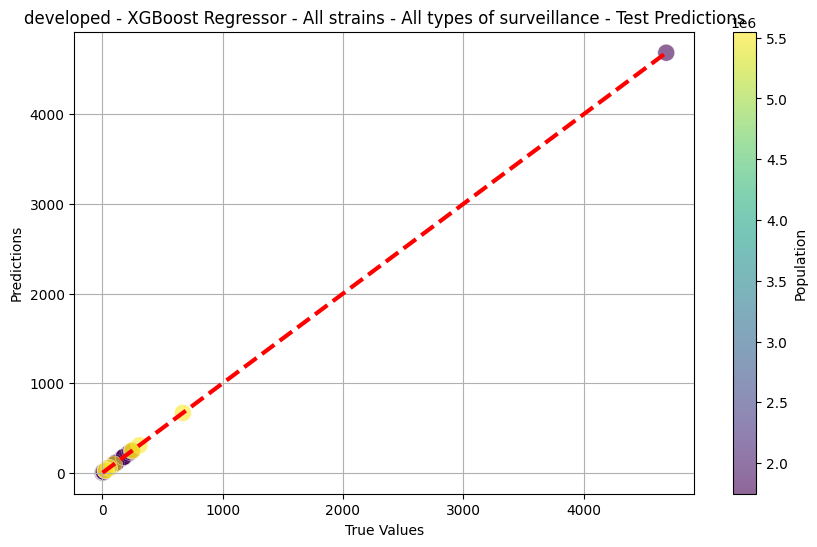

developed - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 64.49
developed - Reported deaths caused by severe acute respiratory infections - Validation MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000
developed - Reported deaths caused by severe acute respiratory infections - Test MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000


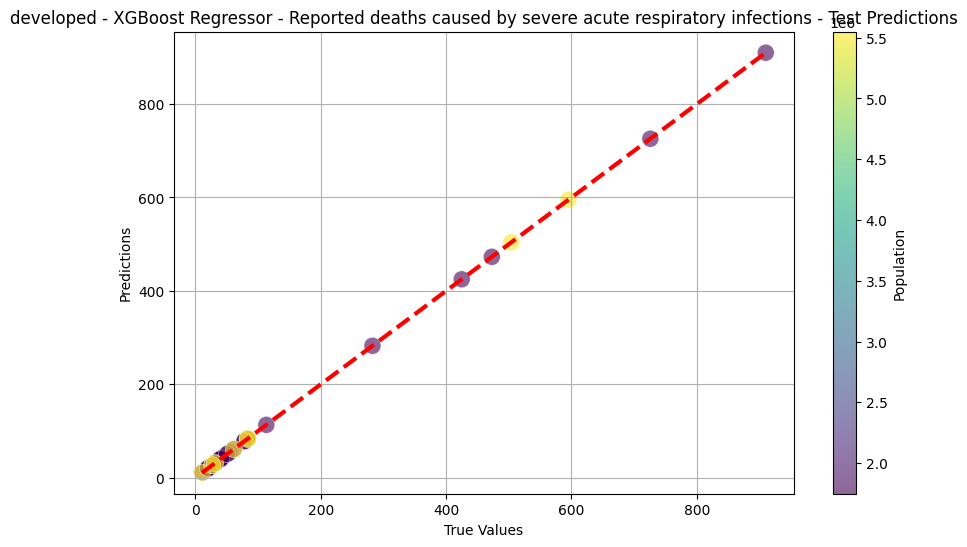

developing - total_cases - Cross-Validation RMSE: 96787.80
developing - total_cases - Validation MSE: 17.10, RMSE: 4.14, MAE: 2.77, R2: 1.0000
developing - total_cases - Test MSE: 18.19, RMSE: 4.26, MAE: 2.64, R2: 1.0000


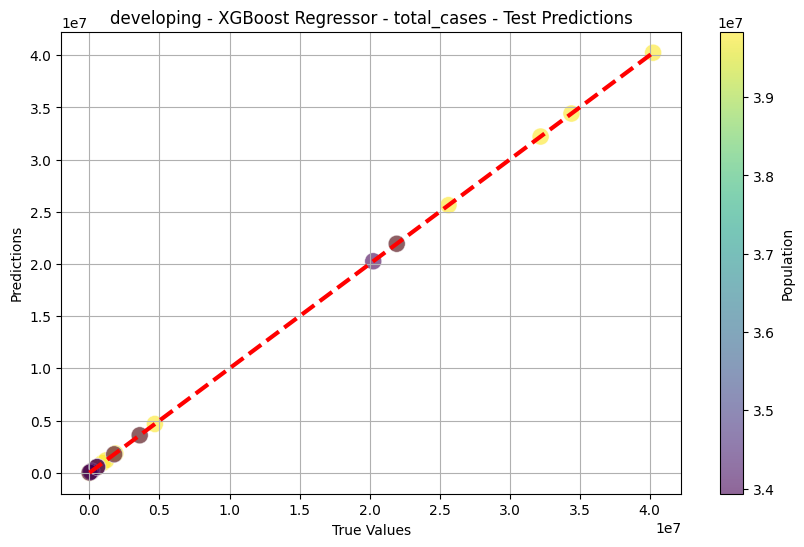

developing - total_deaths - Cross-Validation RMSE: 3910.20
developing - total_deaths - Validation MSE: 0.01, RMSE: 0.07, MAE: 0.05, R2: 1.0000
developing - total_deaths - Test MSE: 0.00, RMSE: 0.06, MAE: 0.04, R2: 1.0000


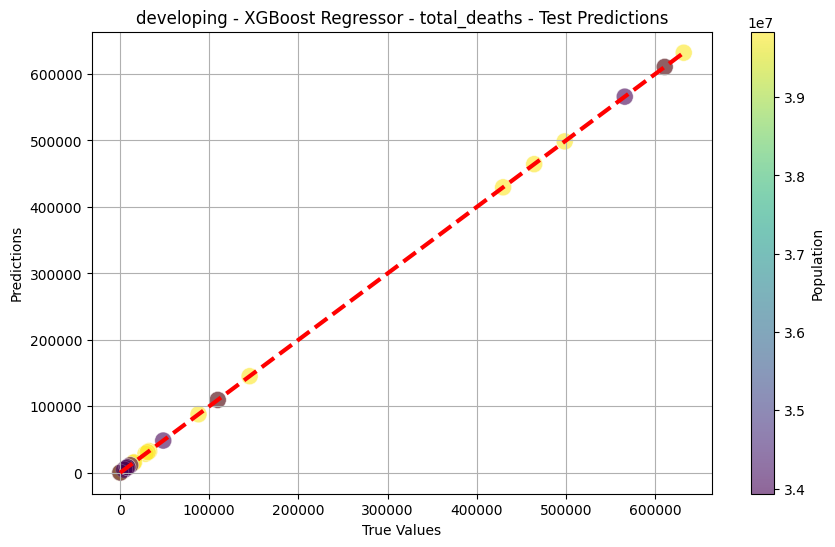

developing - All strains - All types of surveillance - Cross-Validation RMSE: 222.54
developing - All strains - All types of surveillance - Validation MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000
developing - All strains - All types of surveillance - Test MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000


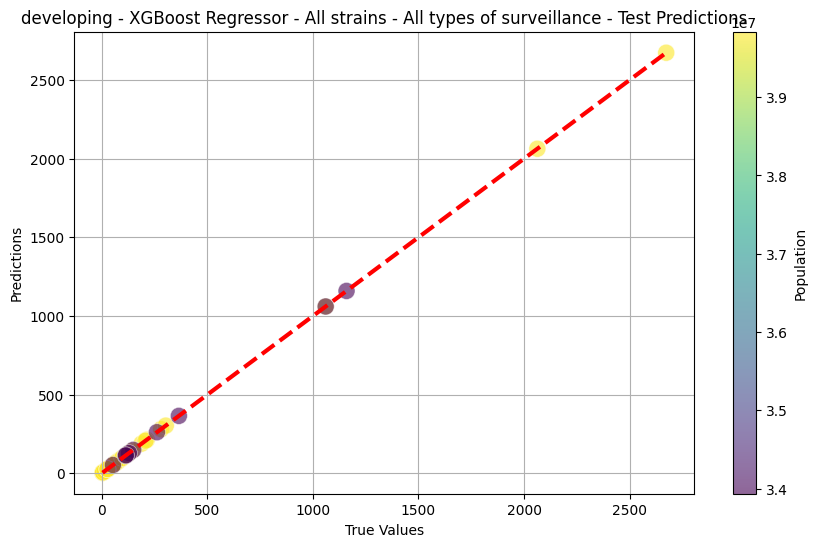

developing - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 109.35
developing - Reported deaths caused by severe acute respiratory infections - Validation MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000
developing - Reported deaths caused by severe acute respiratory infections - Test MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000


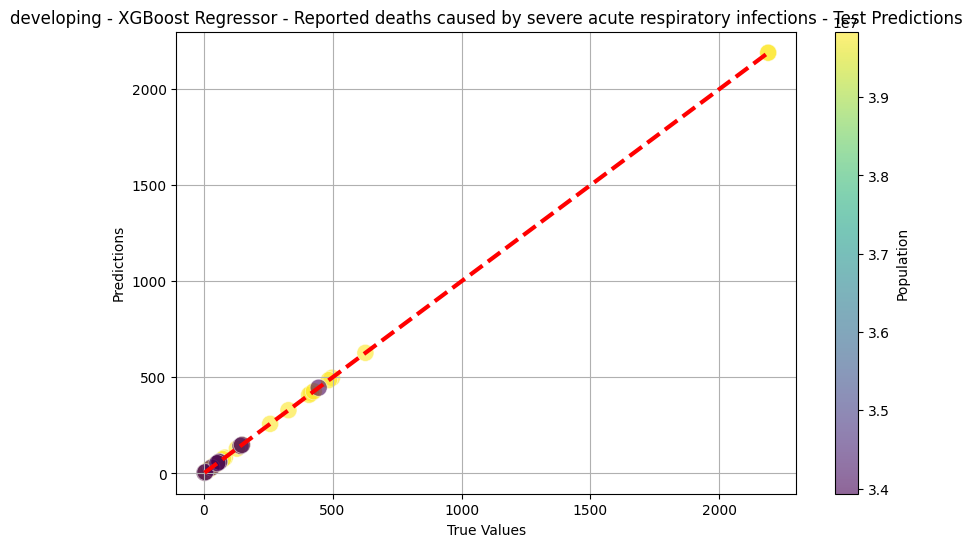

underdeveloped - total_cases - Cross-Validation RMSE: 16088.68
underdeveloped - total_cases - Validation MSE: 331601707.74, RMSE: 18209.93, MAE: 4406.10, R2: 0.9596
underdeveloped - total_cases - Test MSE: 482998675.80, RMSE: 21977.23, MAE: 6882.47, R2: 0.9628


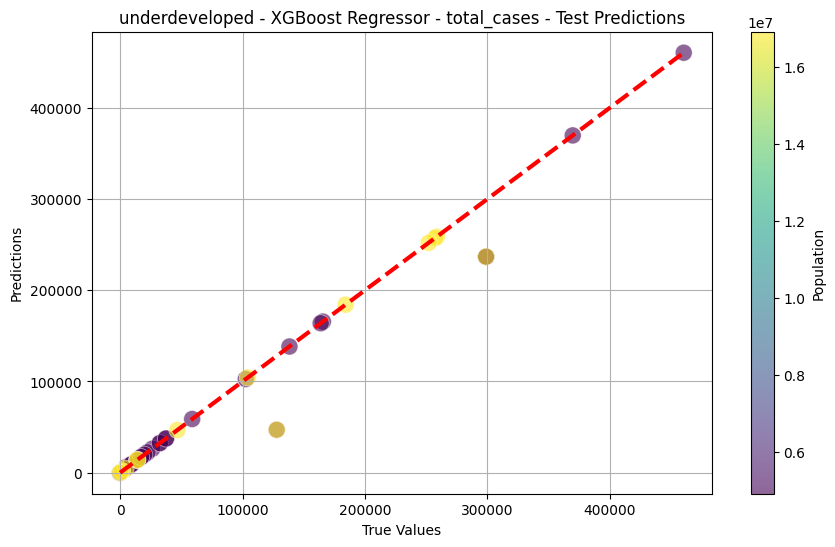

underdeveloped - total_deaths - Cross-Validation RMSE: 376.56
underdeveloped - total_deaths - Validation MSE: 73716.87, RMSE: 271.51, MAE: 66.21, R2: 0.9714
underdeveloped - total_deaths - Test MSE: 109206.84, RMSE: 330.46, MAE: 104.93, R2: 0.9713


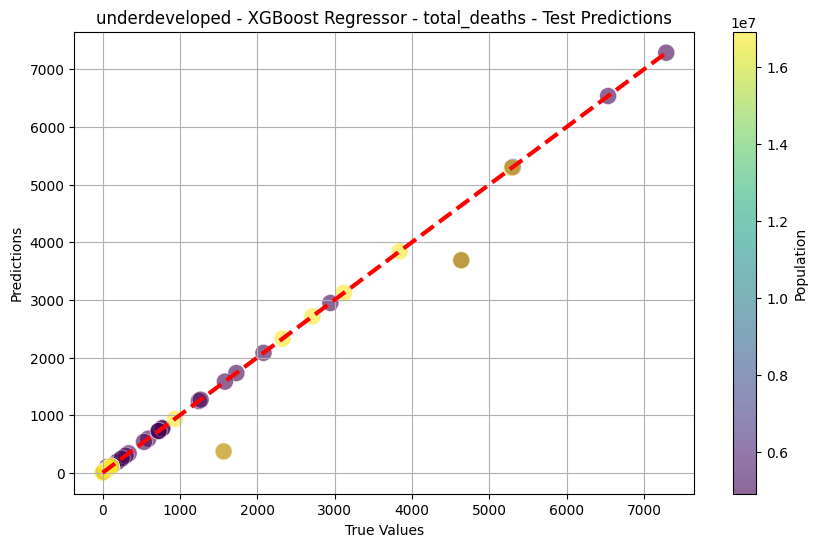

underdeveloped - All strains - All types of surveillance - Cross-Validation RMSE: 427.82
underdeveloped - All strains - All types of surveillance - Validation MSE: 2328.24, RMSE: 48.25, MAE: 11.32, R2: 0.9960
underdeveloped - All strains - All types of surveillance - Test MSE: 2707.58, RMSE: 52.03, MAE: 15.64, R2: 0.9967


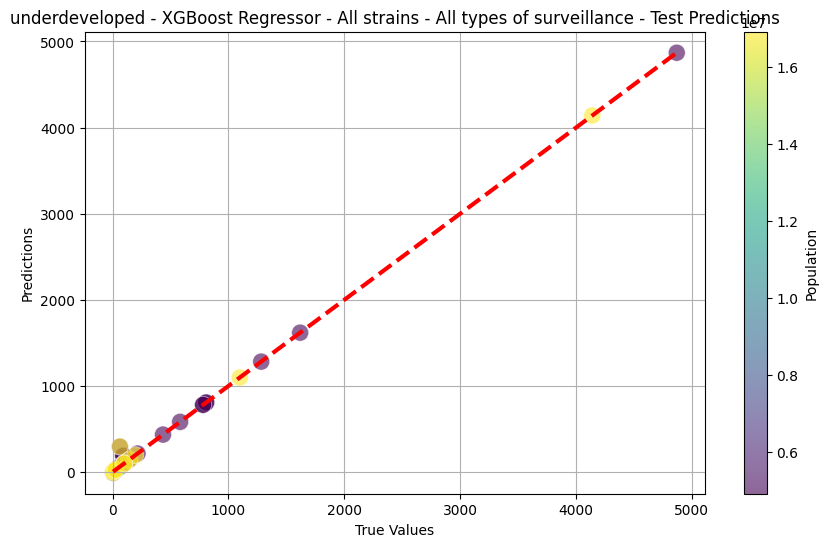

underdeveloped - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 14.70
underdeveloped - Reported deaths caused by severe acute respiratory infections - Validation MSE: 6358.13, RMSE: 79.74, MAE: 12.29, R2: 0.7759
underdeveloped - Reported deaths caused by severe acute respiratory infections - Test MSE: 19070.01, RMSE: 138.09, MAE: 36.29, R2: 0.6953


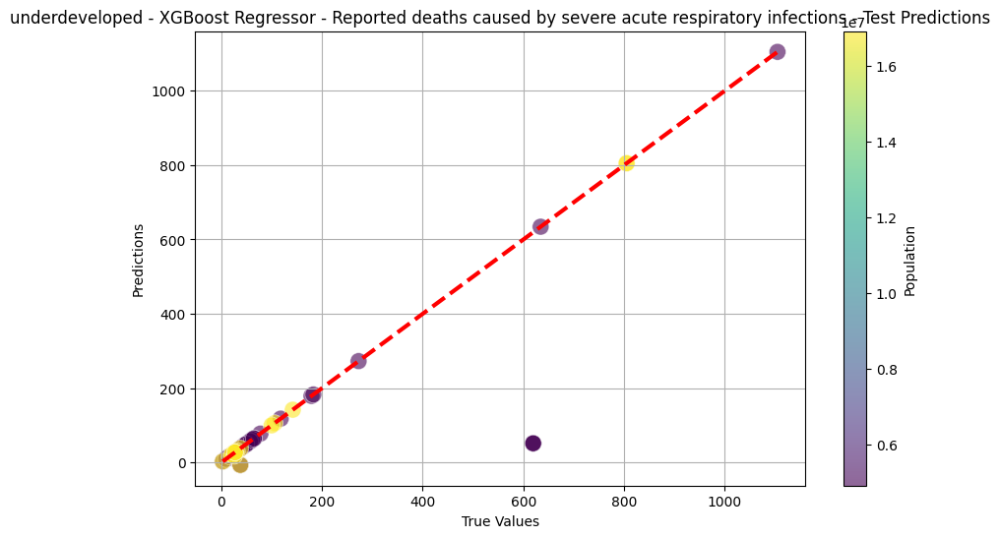

island - total_cases - Cross-Validation RMSE: 24110.37
island - total_cases - Validation MSE: 0.04, RMSE: 0.19, MAE: 0.10, R2: 1.0000
island - total_cases - Test MSE: 0.05, RMSE: 0.23, MAE: 0.13, R2: 1.0000


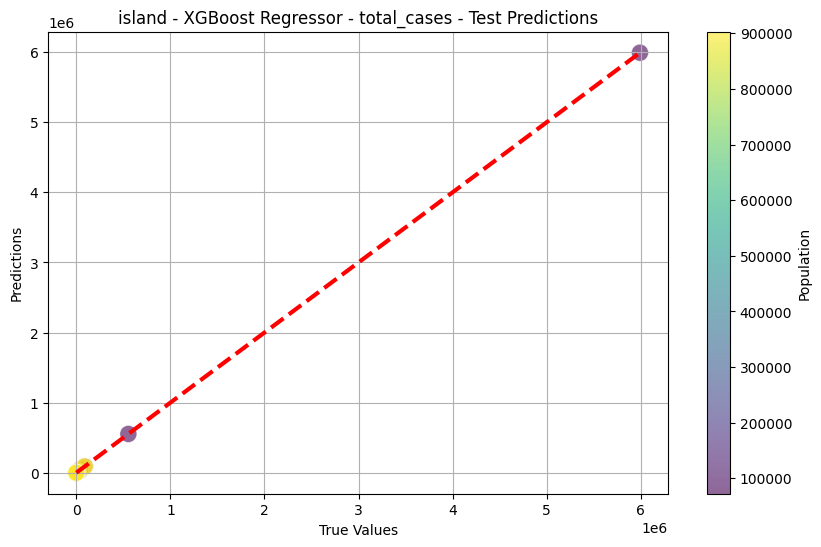

island - total_deaths - Cross-Validation RMSE: 9469.42
island - total_deaths - Validation MSE: 0.00, RMSE: 0.06, MAE: 0.04, R2: 1.0000
island - total_deaths - Test MSE: 0.01, RMSE: 0.07, MAE: 0.04, R2: 1.0000


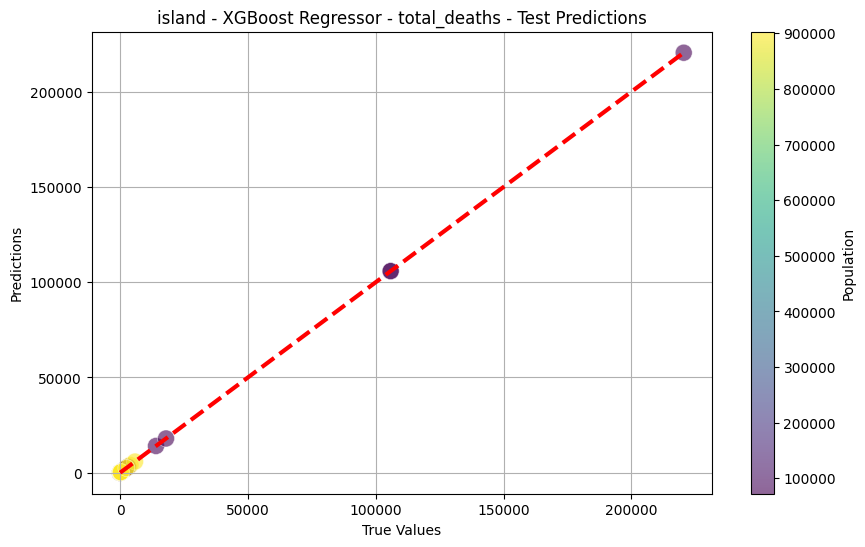

island - All strains - All types of surveillance - Cross-Validation RMSE: 174.04
island - All strains - All types of surveillance - Validation MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000
island - All strains - All types of surveillance - Test MSE: 0.00, RMSE: 0.01, MAE: 0.00, R2: 1.0000


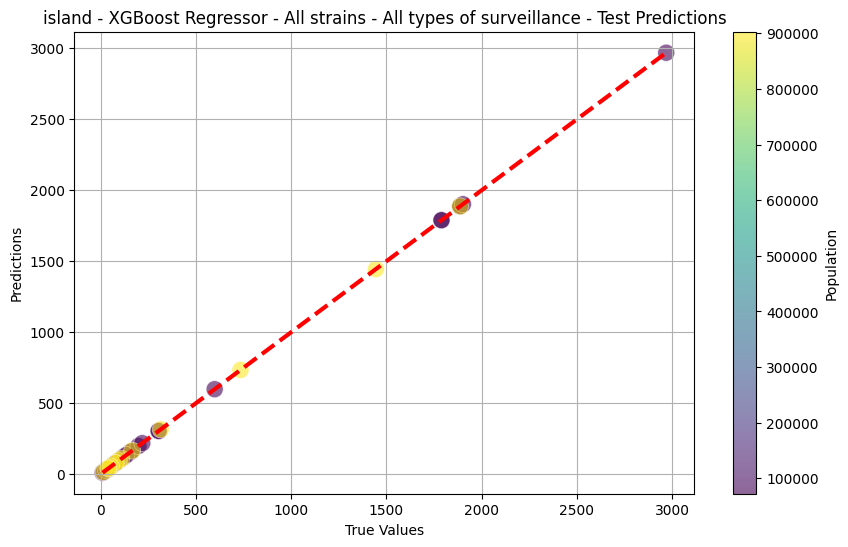

island - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 58.34
island - Reported deaths caused by severe acute respiratory infections - Validation MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000
island - Reported deaths caused by severe acute respiratory infections - Test MSE: 0.00, RMSE: 0.00, MAE: 0.00, R2: 1.0000


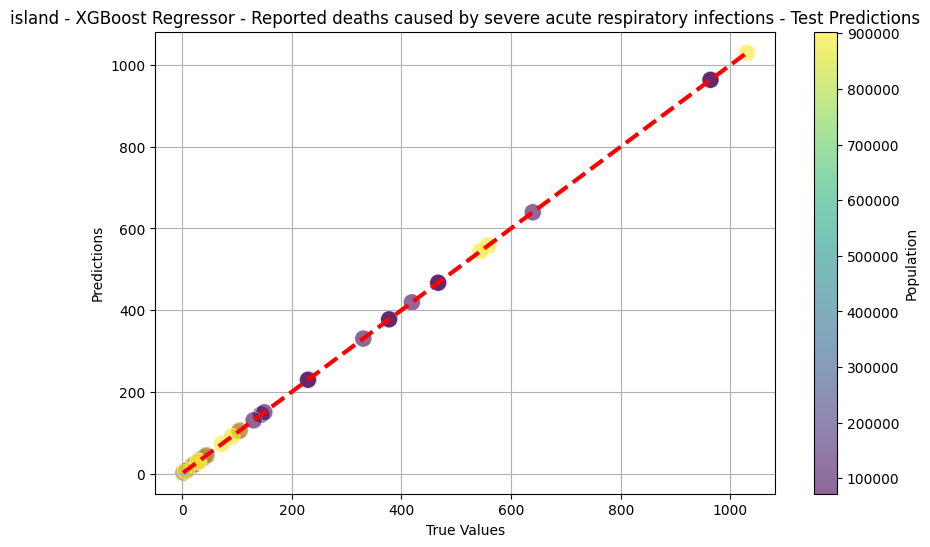


Model Comparison:
          Category                                             Target  \
0        developed                                        total_cases   
1        developed                                       total_deaths   
2        developed            All strains - All types of surveillance   
3        developed  Reported deaths caused by severe acute respira...   
4       developing                                        total_cases   
5       developing                                       total_deaths   
6       developing            All strains - All types of surveillance   
7       developing  Reported deaths caused by severe acute respira...   
8   underdeveloped                                        total_cases   
9   underdeveloped                                       total_deaths   
10  underdeveloped            All strains - All types of surveillance   
11  underdeveloped  Reported deaths caused by severe acute respira...   
12          island              

In [25]:
# Load your merged data here
project_merged_data = pd.read_csv("/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv")

# Country list dictionary
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Define target variables for both COVID-19 and Influenza
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define the columns you want to exclude
excluded_features = ['new_cases', 'new_deaths', 'Cases of influenza-like illnesses', 'Share of positive tests - All types of surveillance']

# Define feature variables (excluding date, location, population, and excluded features)
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population'] + excluded_features]

# Function to preprocess data
def preprocess_data(data):
    # One-hot encode categorical variables
    data = pd.get_dummies(data, drop_first=True)
    return data

# Function to evaluate model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Adjusted function to plot predictions with color bar
def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))
    populations = populations[:len(y_true)]

    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=150,
                     alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')
    plt.show()

# Function to train, validate, and test XGBoost with cross-validation
def train_validate_test_xgboost(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with mean.")
        y = y.fillna(y.mean())  # Fill missing values with the mean

    # Split data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Define the XGBoost model
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Cross-validation on training data
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_val_score(model, X_train, y_train, cv=kf, scoring='neg_mean_squared_error')
    cv_rmse = np.sqrt(-cv_results)
    print(f'{category} - {target} - Cross-Validation RMSE: {cv_rmse.mean():.2f}')

    # Train the model on the training data
    model.fit(X_train, y_train)

    # Validate the model
    y_val_pred = model.predict(X_val)
    val_mse, val_rmse, val_mae, val_r2 = evaluate_model(y_val, y_val_pred)
    print(f'{category} - {target} - Validation MSE: {val_mse:.2f}, RMSE: {val_rmse:.2f}, MAE: {val_mae:.2f}, R2: {val_r2:.4f}')

    # Test the model on the test set
    y_test_pred = model.predict(X_test)
    test_mse, test_rmse, test_mae, test_r2 = evaluate_model(y_test, y_test_pred)
    print(f'{category} - {target} - Test MSE: {test_mse:.2f}, RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R2: {test_r2:.4f}')

    # Plot predictions for the test set
    plot_predictions(y_test, y_test_pred, populations, f"{category} - XGBoost Regressor - {target} - Test Predictions")

    # Return all necessary metrics
    return model, cv_rmse.mean(), val_rmse, test_rmse, test_mse, test_mae, test_r2

# To store performance metrics for comparison
performance_metrics = []

# Train, validate, and test for each category and target
for category, country_list in country_categories.items():
    filtered_data = project_merged_data[project_merged_data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    for target in target_variables:
        model, cv_rmse_mean, val_rmse, test_rmse, test_mse, test_mae, test_r2 = train_validate_test_xgboost(filtered_data, category, target)
        performance_metrics.append({
            'Category': category,
            'Target': target,
            'Test MSE': test_mse,
            'Test RMSE': test_rmse,
            'Test MAE': test_mae,
            'Test R²': test_r2
        })

# Compare model performances
performance_df = pd.DataFrame(performance_metrics)
print("\nModel Comparison:")
print(performance_df)

BAGGING REGRESSION

developed - Bagging Regressor - total_cases - Cross-Validation RMSE: 1580105.278579907
developed - Bagging Regressor - total_cases - Validation MSE: 2221644948243.11, RMSE: 1490518.35, MAE: 1044263.01, R2: 0.8342
developed - Bagging Regressor - total_cases - Test MSE: 1447761476129.28, RMSE: 1203229.60, MAE: 882242.24, R2: 0.6088


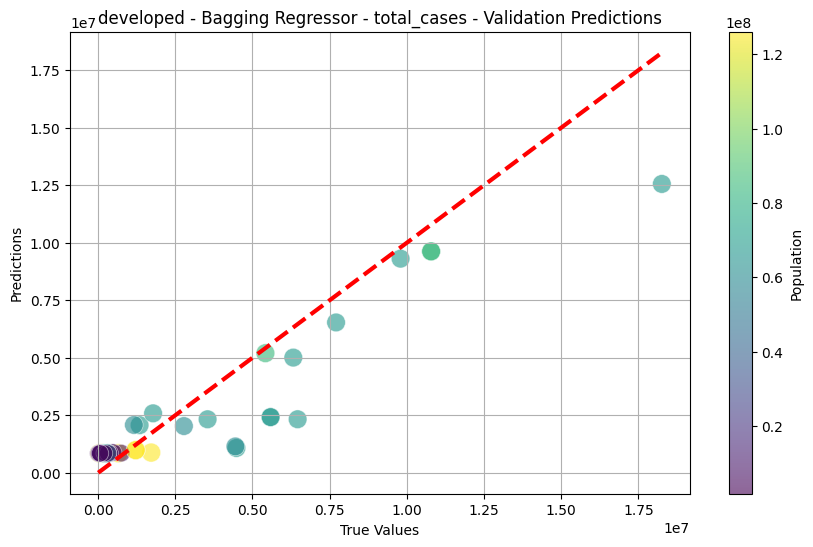

developed - Bagging Regressor - total_deaths - Cross-Validation RMSE: 21432.984076285124
developed - Bagging Regressor - total_deaths - Validation MSE: 501817074.63, RMSE: 22401.27, MAE: 15293.47, R2: 0.7877
developed - Bagging Regressor - total_deaths - Test MSE: 589148729.82, RMSE: 24272.39, MAE: 16254.22, R2: 0.7076


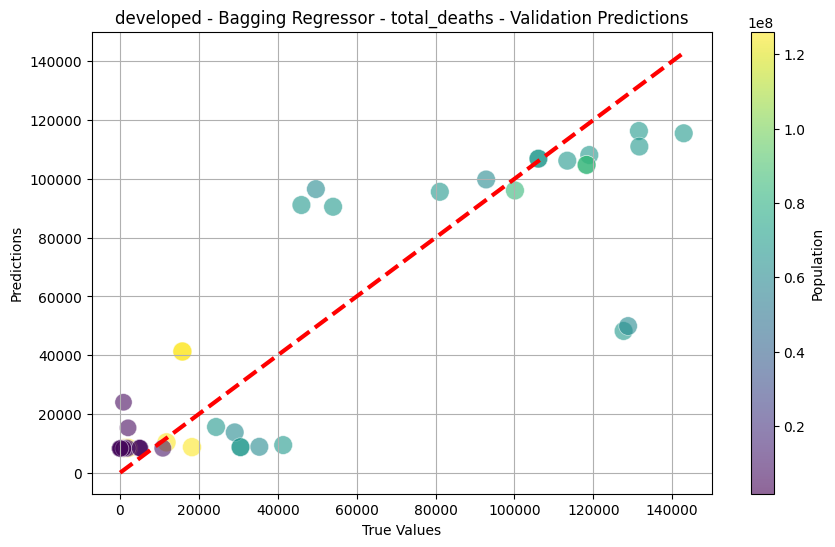

developed - Bagging Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 576.7179570936999
developed - Bagging Regressor - All strains - All types of surveillance - Validation MSE: 76708.07, RMSE: 276.96, MAE: 174.25, R2: 0.6732
developed - Bagging Regressor - All strains - All types of surveillance - Test MSE: 64529.01, RMSE: 254.03, MAE: 157.11, R2: 0.8979


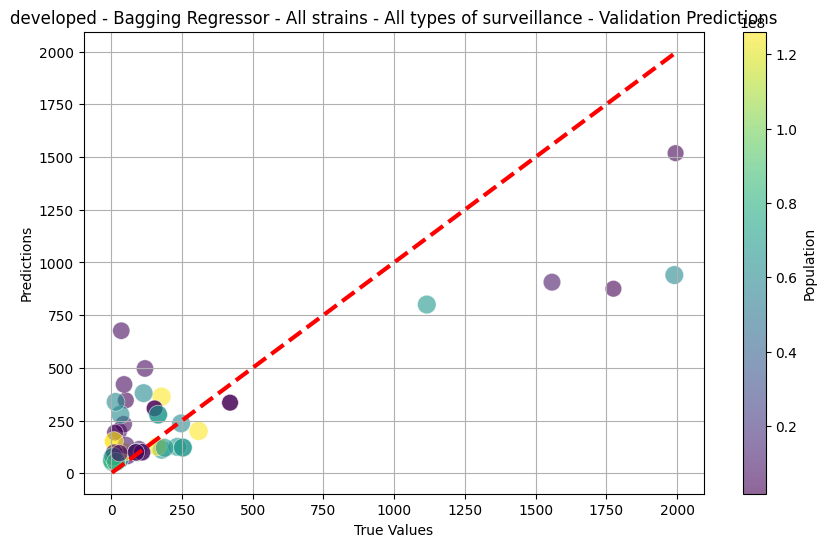

developed - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 179.30620373848228
developed - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 30229.11, RMSE: 173.87, MAE: 121.06, R2: 0.4539
developed - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 30968.56, RMSE: 175.98, MAE: 132.29, R2: 0.3665


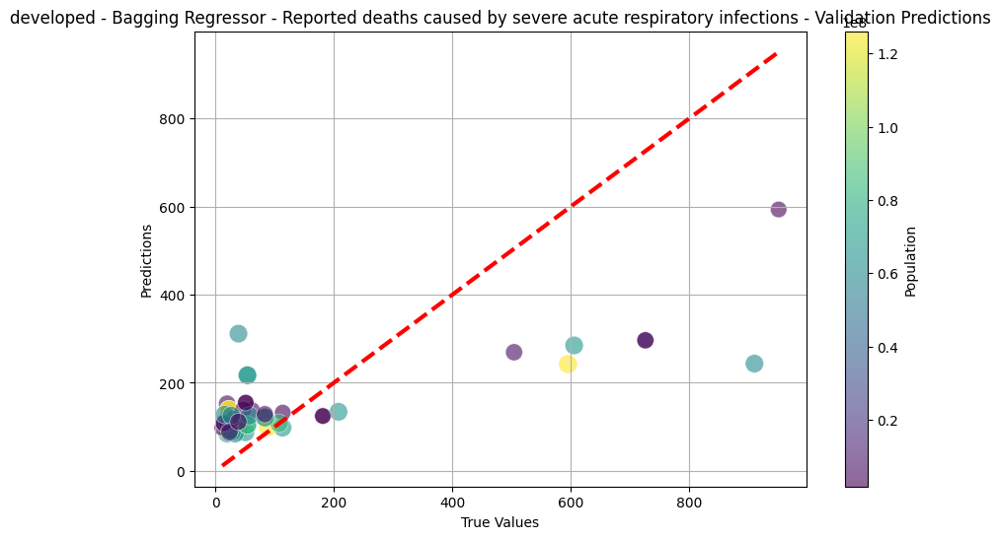

developing - Bagging Regressor - total_cases - Cross-Validation RMSE: 2364516.670189687
developing - Bagging Regressor - total_cases - Validation MSE: 1674110304760.91, RMSE: 1293874.15, MAE: 511685.82, R2: 0.9693
developing - Bagging Regressor - total_cases - Test MSE: 1974227164469.15, RMSE: 1405071.94, MAE: 542436.25, R2: 0.9777


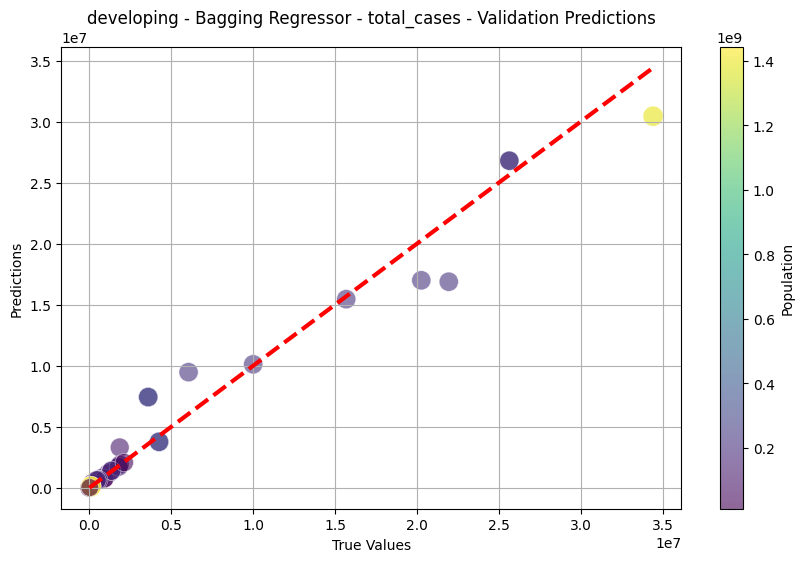

developing - Bagging Regressor - total_deaths - Cross-Validation RMSE: 52572.3994107382
developing - Bagging Regressor - total_deaths - Validation MSE: 849037258.41, RMSE: 29138.24, MAE: 11751.04, R2: 0.9705
developing - Bagging Regressor - total_deaths - Test MSE: 1175767947.43, RMSE: 34289.47, MAE: 13180.34, R2: 0.9656


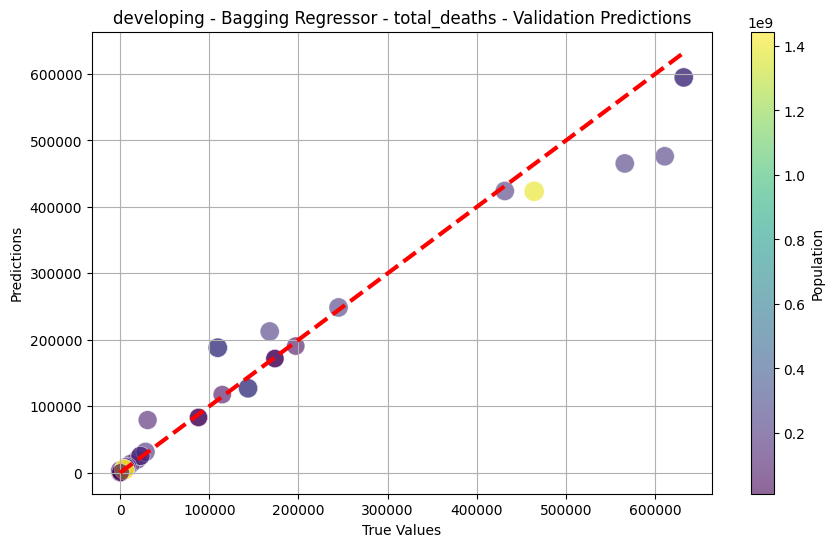

developing - Bagging Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 400.34015220120097
developing - Bagging Regressor - All strains - All types of surveillance - Validation MSE: 130192.39, RMSE: 360.82, MAE: 159.58, R2: 0.3717
developing - Bagging Regressor - All strains - All types of surveillance - Test MSE: 31027.08, RMSE: 176.15, MAE: 97.93, R2: 0.8710


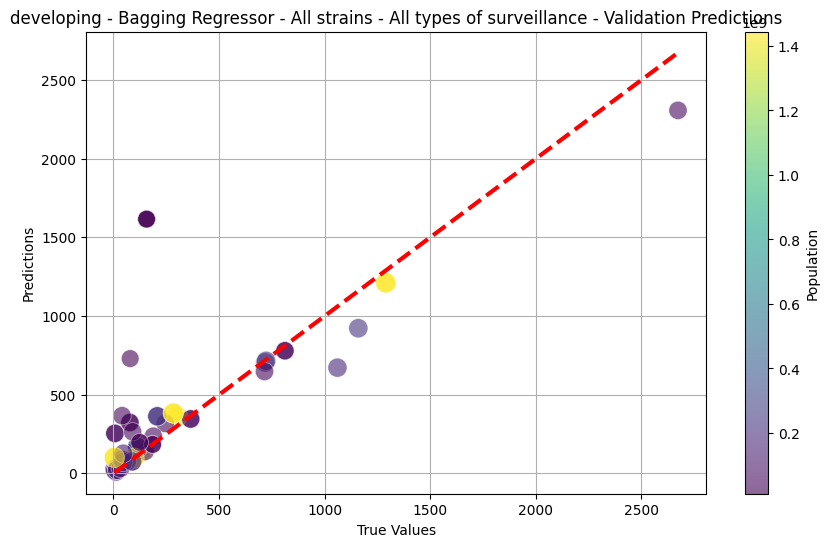

developing - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 115.14416682341252
developing - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 160636.03, RMSE: 400.79, MAE: 108.03, R2: 0.0815
developing - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 157510.46, RMSE: 396.88, MAE: 101.19, R2: 0.0346


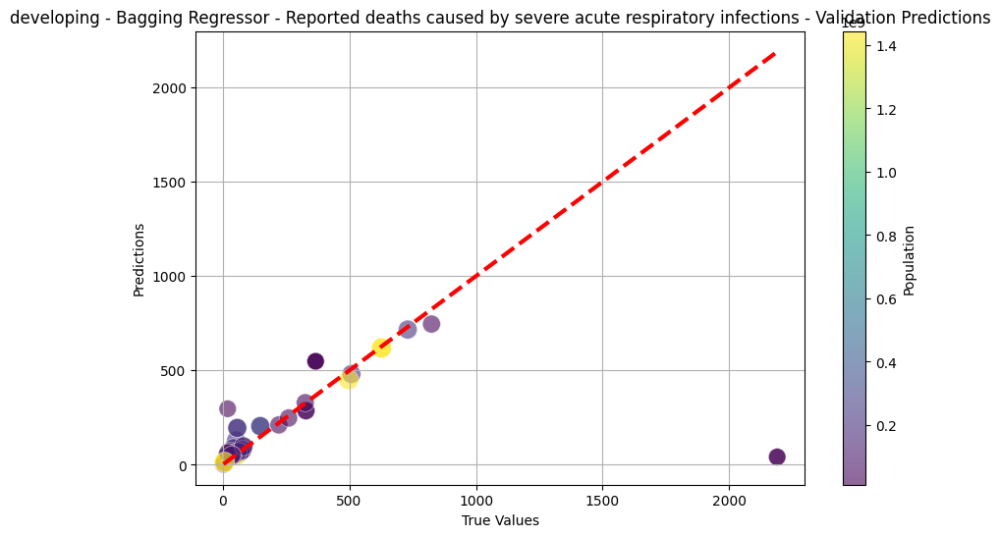

underdeveloped - Bagging Regressor - total_cases - Cross-Validation RMSE: 26387.783210101643
underdeveloped - Bagging Regressor - total_cases - Validation MSE: 1099680234.56, RMSE: 33161.43, MAE: 14267.75, R2: 0.8598
underdeveloped - Bagging Regressor - total_cases - Test MSE: 651094543.23, RMSE: 25516.55, MAE: 11297.71, R2: 0.9441


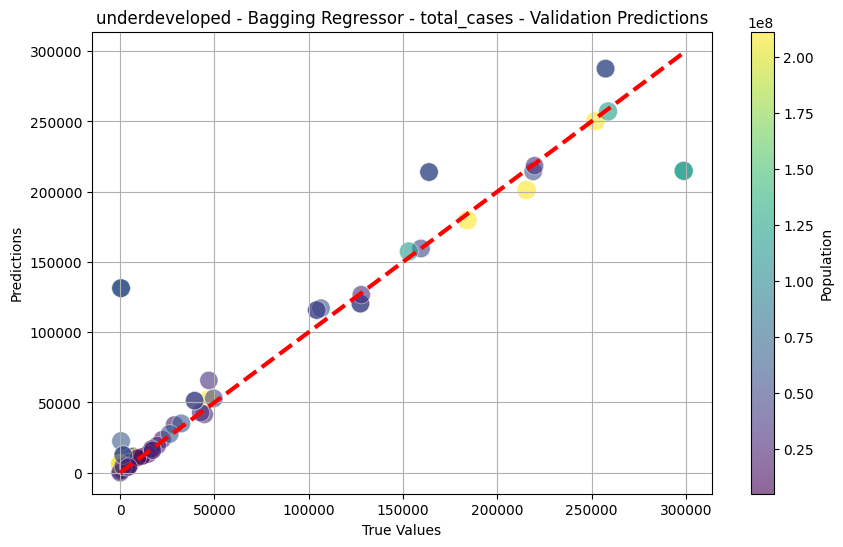

underdeveloped - Bagging Regressor - total_deaths - Cross-Validation RMSE: 601.4445631614851
underdeveloped - Bagging Regressor - total_deaths - Validation MSE: 235610.72, RMSE: 485.40, MAE: 256.77, R2: 0.8950
underdeveloped - Bagging Regressor - total_deaths - Test MSE: 155856.85, RMSE: 394.79, MAE: 233.59, R2: 0.9563


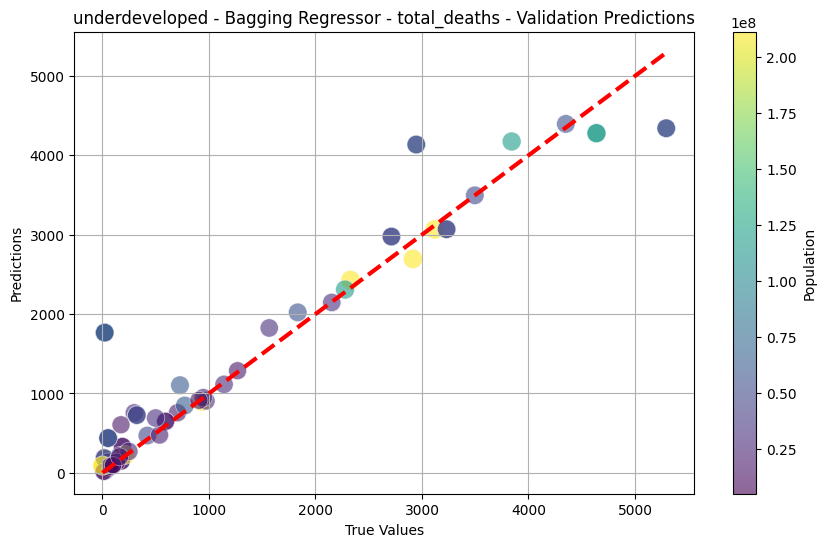

underdeveloped - Bagging Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 309.7293307415599
underdeveloped - Bagging Regressor - All strains - All types of surveillance - Validation MSE: 17895.07, RMSE: 133.77, MAE: 70.62, R2: 0.9595
underdeveloped - Bagging Regressor - All strains - All types of surveillance - Test MSE: 24504.12, RMSE: 156.54, MAE: 92.17, R2: 0.9740


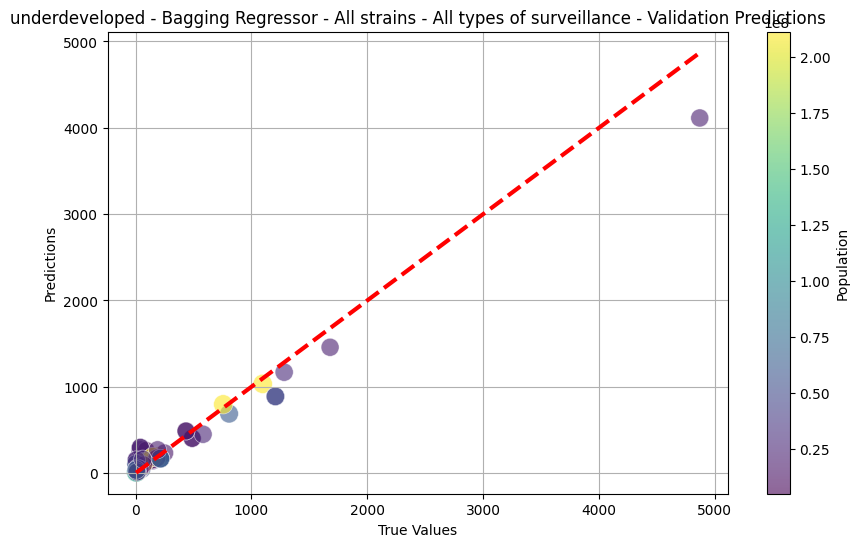

underdeveloped - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 114.42787805001254
underdeveloped - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 14176.72, RMSE: 119.07, MAE: 52.38, R2: 0.7805
underdeveloped - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 18915.53, RMSE: 137.53, MAE: 52.76, R2: 0.6334


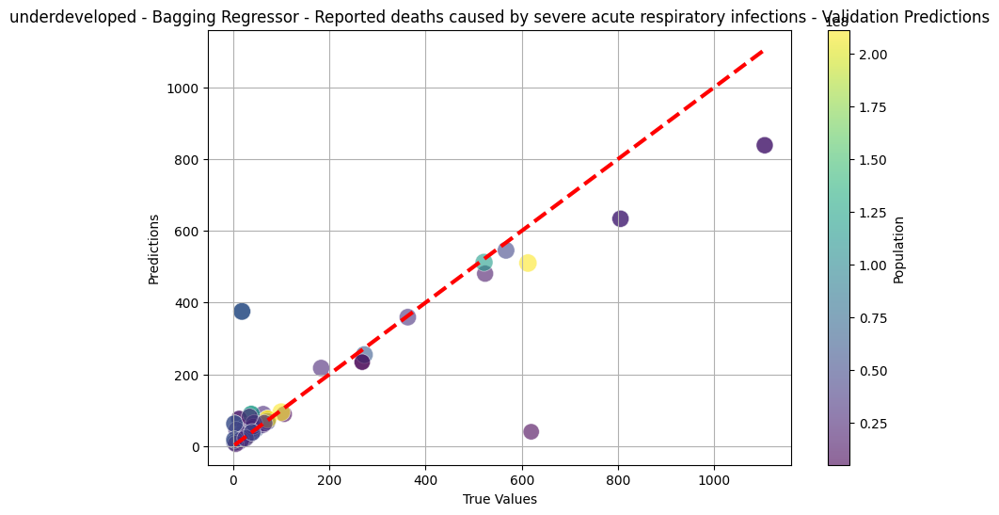

island - Bagging Regressor - total_cases - Cross-Validation RMSE: 287545.51007919246
island - Bagging Regressor - total_cases - Validation MSE: 25113041380.45, RMSE: 158470.95, MAE: 43043.13, R2: 0.9547
island - Bagging Regressor - total_cases - Test MSE: 18280797086.76, RMSE: 135206.50, MAE: 30656.23, R2: 0.9668


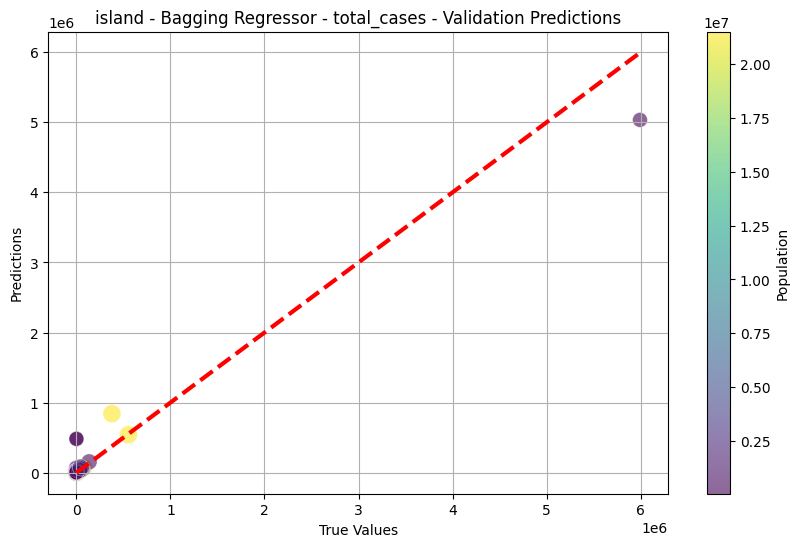

island - Bagging Regressor - total_deaths - Cross-Validation RMSE: 15871.37904683142
island - Bagging Regressor - total_deaths - Validation MSE: 82264703.08, RMSE: 9069.99, MAE: 3757.43, R2: 0.8756
island - Bagging Regressor - total_deaths - Test MSE: 93873485.83, RMSE: 9688.83, MAE: 3561.06, R2: 0.9220


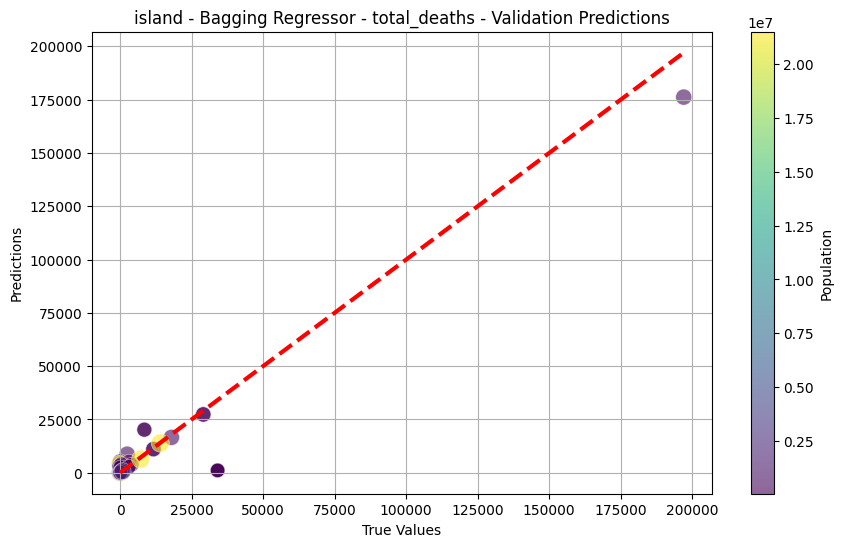

island - Bagging Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 259.8033389715971
island - Bagging Regressor - All strains - All types of surveillance - Validation MSE: 63820.59, RMSE: 252.63, MAE: 118.44, R2: 0.7961
island - Bagging Regressor - All strains - All types of surveillance - Test MSE: 149514.34, RMSE: 386.67, MAE: 167.90, R2: 0.6875


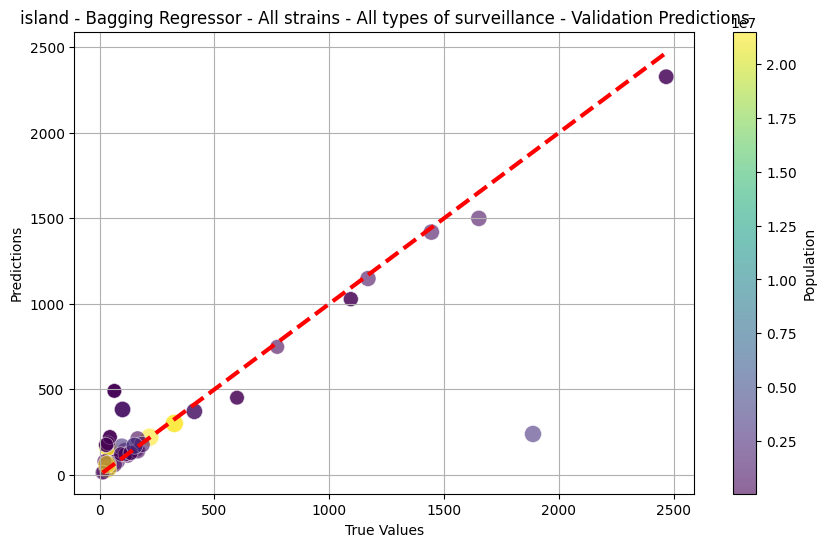

island - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 100.59467683934697
island - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 3588.61, RMSE: 59.91, MAE: 33.19, R2: 0.8875
island - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 6447.78, RMSE: 80.30, MAE: 44.49, R2: 0.9014


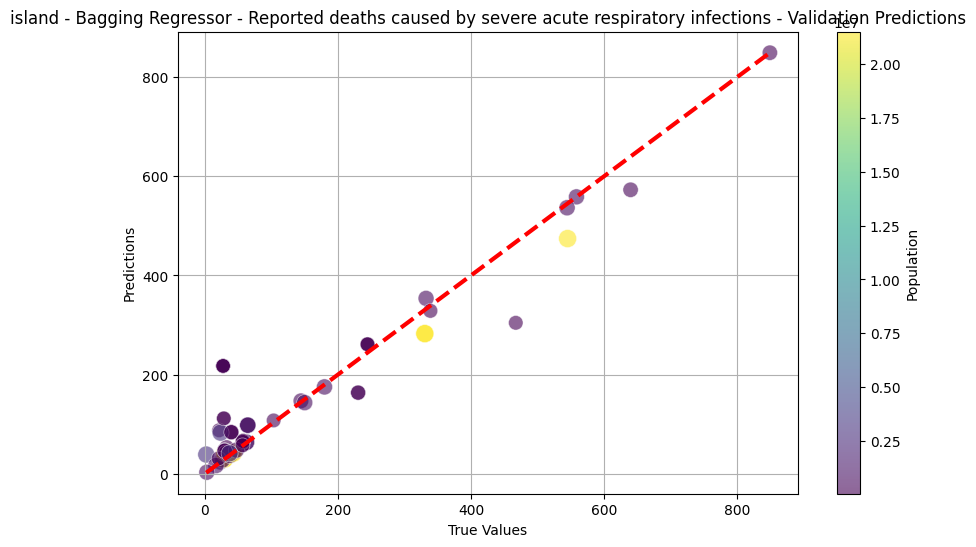


Model Comparison:
          Category                                             Target  \
0        developed                                        total_cases   
1        developed                                       total_deaths   
2        developed            All strains - All types of surveillance   
3        developed  Reported deaths caused by severe acute respira...   
4       developing                                        total_cases   
5       developing                                       total_deaths   
6       developing            All strains - All types of surveillance   
7       developing  Reported deaths caused by severe acute respira...   
8   underdeveloped                                        total_cases   
9   underdeveloped                                       total_deaths   
10  underdeveloped            All strains - All types of surveillance   
11  underdeveloped  Reported deaths caused by severe acute respira...   
12          island              

In [43]:
# Load your merged data here
project_merged_data = pd.read_csv("/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv")

# Define target variables for both COVID-19 and Influenza
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define features
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population']]

# Define country list dictionary
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Function to evaluate model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Function to plot predictions with color bar
def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')
    plt.show()

# Function to preprocess data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    return data

# Function to train and evaluate Bagging Regressor
def train_evaluate_bagging(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with mean.")
        y = y.fillna(y.mean())  # Fill missing values with the mean


    # Split data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Initialize and train the Bagging Regressor
    base_model = DecisionTreeRegressor(random_state=42)
    model = BaggingRegressor(estimator=base_model, n_estimators=50, random_state=42)
    model.fit(X_train, y_train)

    # Cross-validation
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')
    cv_rmse = np.sqrt(-cv_scores)
    print(f'{category} - Bagging Regressor - {target} - Cross-Validation RMSE: {cv_rmse.mean()}')

    # Make predictions on the validation and test sets
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)

    # Validate the model
    val_mse, val_rmse, val_mae, val_r2 = evaluate_model(y_val, y_val_pred)
    print(f'{category} - Bagging Regressor - {target} - Validation MSE: {val_mse:.2f}, RMSE: {val_rmse:.2f}, MAE: {val_mae:.2f}, R2: {val_r2:.4f}')

    # Test the model
    test_mse, test_rmse, test_mae, test_r2 = evaluate_model(y_test, y_test_pred)
    print(f'{category} - Bagging Regressor - {target} - Test MSE: {test_mse:.2f}, RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R2: {test_r2:.4f}')

    # Plot predictions
    plot_predictions(y_val, y_val_pred, populations.loc[X_val.index], f"{category} - Bagging Regressor - {target} - Validation Predictions")

    return model, test_mse, test_rmse, test_mae, test_r2

# Filter and preprocess data
def filter_and_preprocess_data(data, country_list):
    filtered_data = data[data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    return filtered_data

# To store performance metrics for comparison
bagging_performance_metrics = []

# Apply the Bagging model to each category and target
for category, country_list in country_categories.items():
    filtered_data = filter_and_preprocess_data(project_merged_data, country_list)
    for target in target_variables:
        model, test_mse, test_rmse, test_mae, test_r2 = train_evaluate_bagging(filtered_data, category, target)
        bagging_performance_metrics.append({
            'Category': category,
            'Target': target,
            'Test MSE': test_mse,
            'Test RMSE': test_rmse,
            'Test MAE': test_mae,
            'Test R²': test_r2
        })

# Compare model performances
bagging_performance_df = pd.DataFrame(bagging_performance_metrics)
print("\nModel Comparison:")
print(performance_df)


VOTING REGRESSION

developed - Voting Regressor - total_cases - Cross-Validation RMSE: 346753.68942670047
developed - Voting Regressor - total_cases - Validation MSE: 51787809439.49, RMSE: 227569.35, MAE: 81920.38, R2: 0.9961
developed - Voting Regressor - total_cases - Test MSE: 134045329666.07, RMSE: 366122.01, MAE: 138162.88, R2: 0.9638


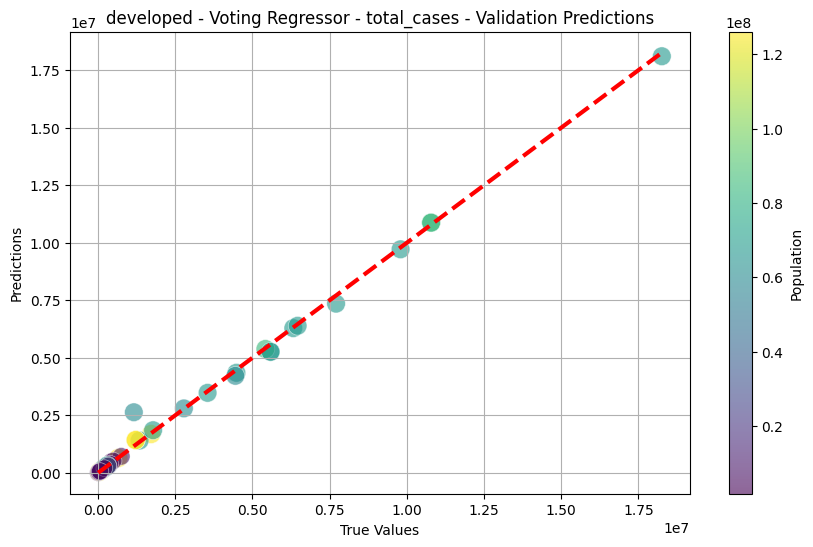

developed - Voting Regressor - total_deaths - Cross-Validation RMSE: 10502.463035072482
developed - Voting Regressor - total_deaths - Validation MSE: 27599992.67, RMSE: 5253.57, MAE: 1540.37, R2: 0.9883
developed - Voting Regressor - total_deaths - Test MSE: 76967315.84, RMSE: 8773.10, MAE: 3400.64, R2: 0.9618


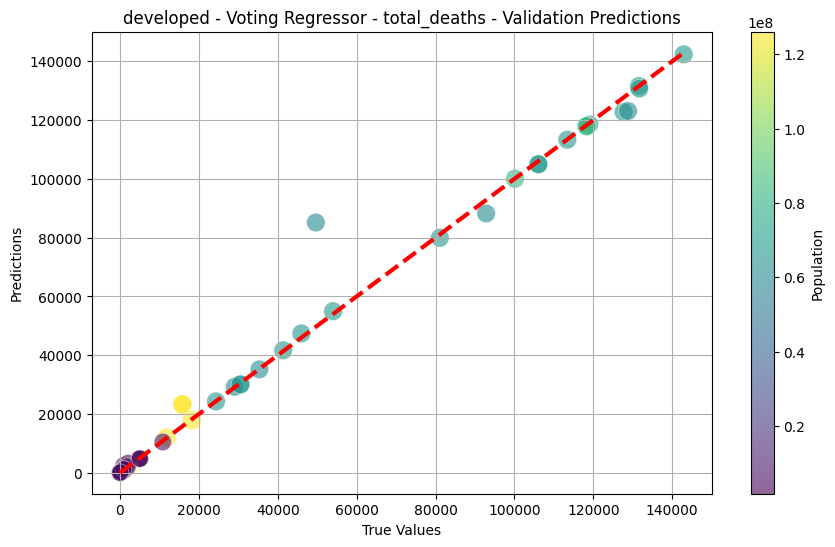

developed - Voting Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 446.5435132308524
developed - Voting Regressor - All strains - All types of surveillance - Validation MSE: 2311.82, RMSE: 48.08, MAE: 27.50, R2: 0.9902
developed - Voting Regressor - All strains - All types of surveillance - Test MSE: 2946.33, RMSE: 54.28, MAE: 29.90, R2: 0.9953


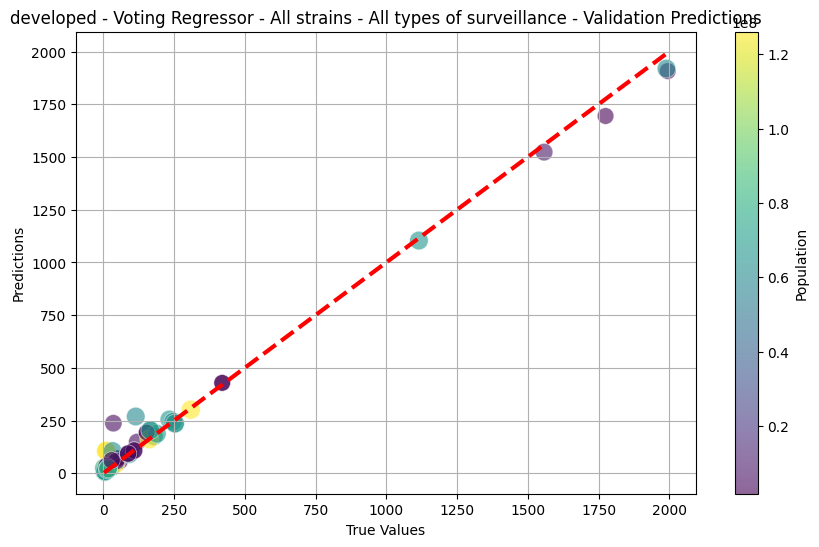

developed - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 111.43177470950596
developed - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 962.43, RMSE: 31.02, MAE: 14.66, R2: 0.9826
developed - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 10471.19, RMSE: 102.33, MAE: 48.56, R2: 0.7858


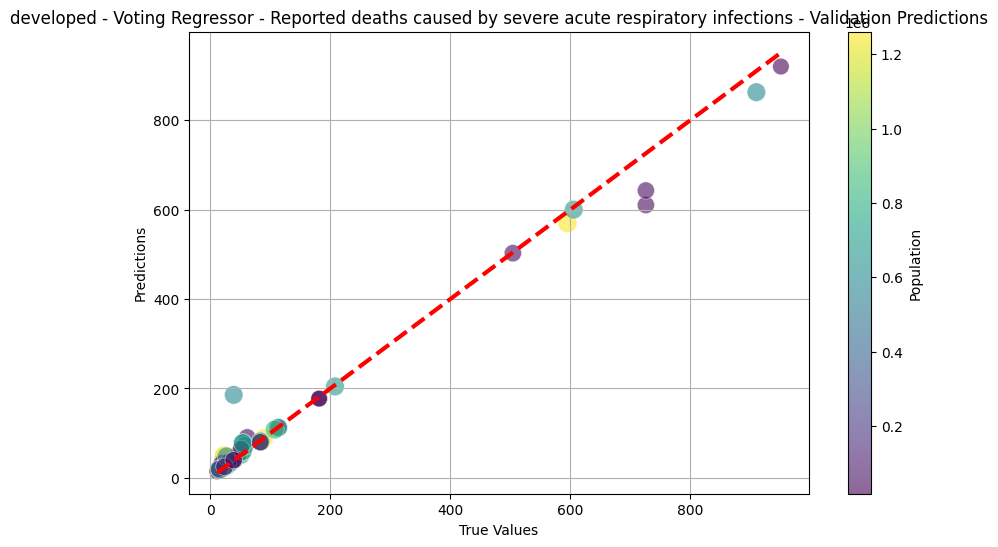

developing - Voting Regressor - total_cases - Cross-Validation RMSE: 1732871.4555105537
developing - Voting Regressor - total_cases - Validation MSE: 196712506883.74, RMSE: 443522.84, MAE: 177629.51, R2: 0.9964
developing - Voting Regressor - total_cases - Test MSE: 272348994067.74, RMSE: 521870.67, MAE: 202647.79, R2: 0.9969


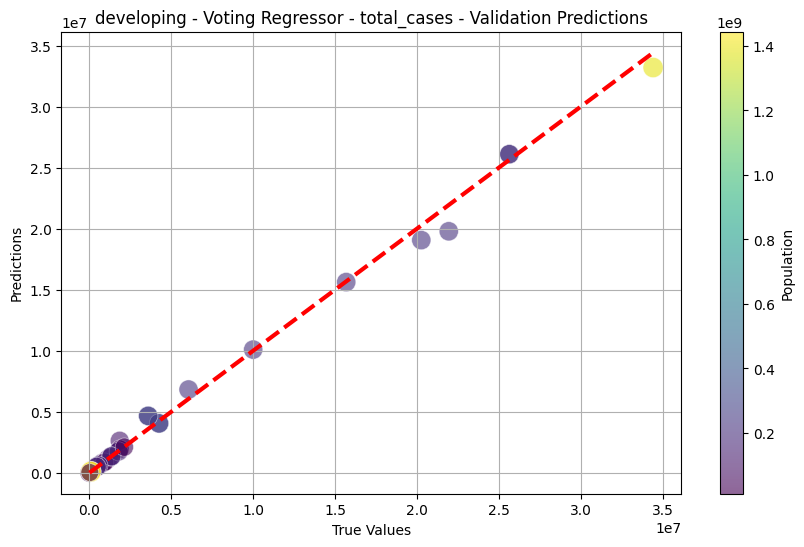

developing - Voting Regressor - total_deaths - Cross-Validation RMSE: 46616.056075861256
developing - Voting Regressor - total_deaths - Validation MSE: 153938223.21, RMSE: 12407.18, MAE: 5014.81, R2: 0.9947
developing - Voting Regressor - total_deaths - Test MSE: 198700434.22, RMSE: 14096.11, MAE: 5375.60, R2: 0.9942


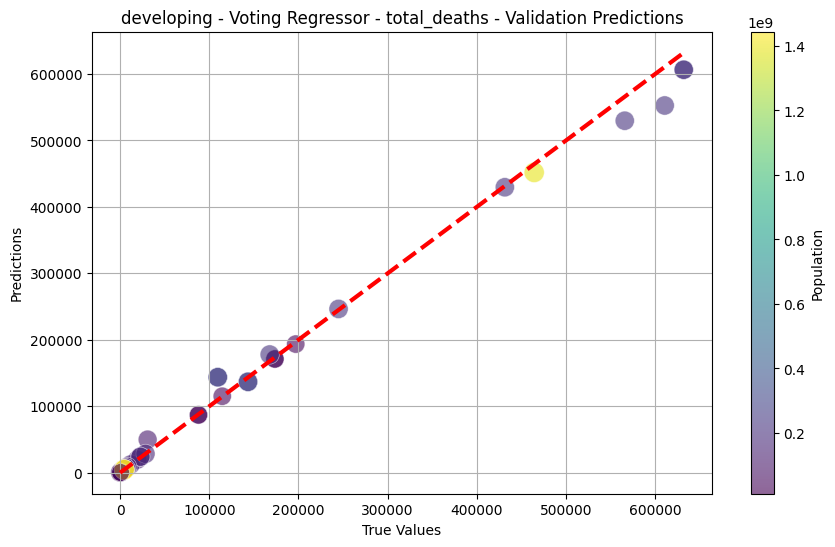

developing - Voting Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 423.3733158177198
developing - Voting Regressor - All strains - All types of surveillance - Validation MSE: 17461.44, RMSE: 132.14, MAE: 60.12, R2: 0.9157
developing - Voting Regressor - All strains - All types of surveillance - Test MSE: 6933.43, RMSE: 83.27, MAE: 40.46, R2: 0.9712


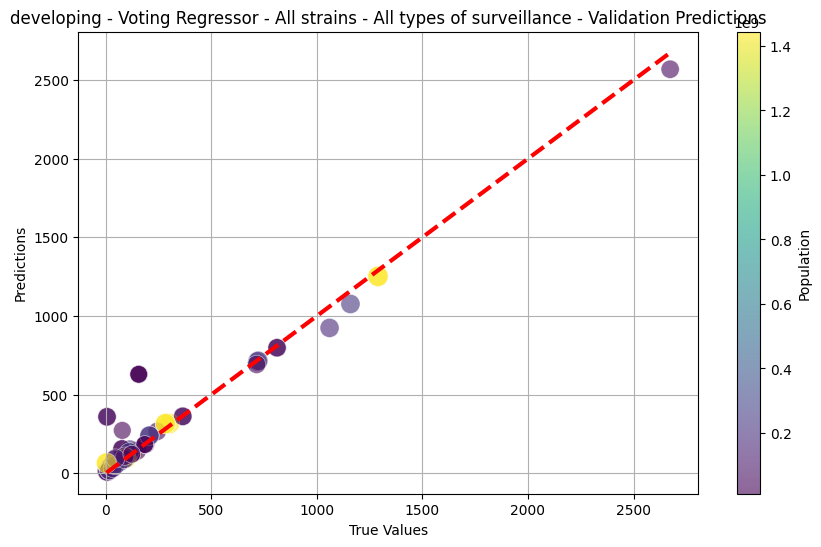

developing - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 99.16064424036553
developing - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 157795.08, RMSE: 397.23, MAE: 86.30, R2: 0.0977
developing - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 155090.07, RMSE: 393.81, MAE: 82.07, R2: 0.0494


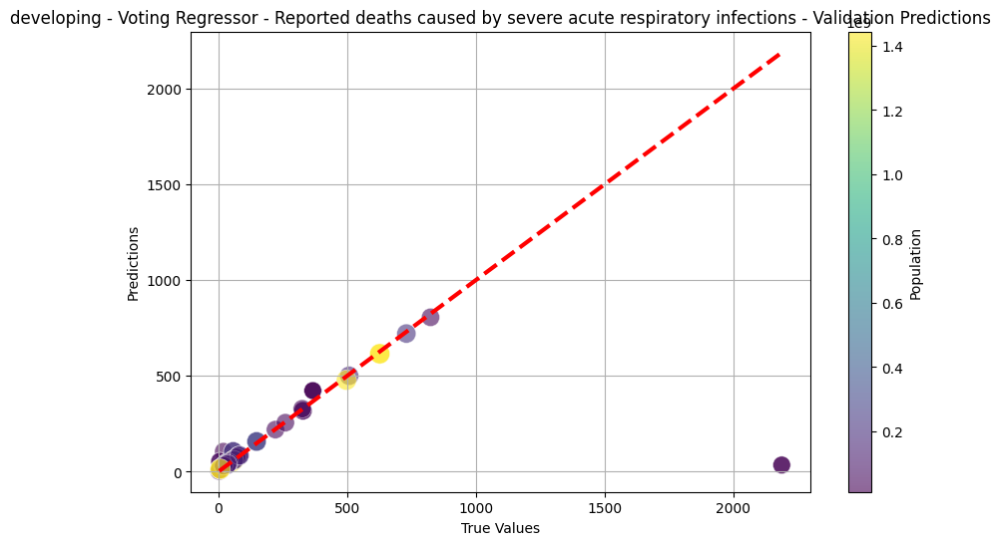

underdeveloped - Voting Regressor - total_cases - Cross-Validation RMSE: 22431.95366834661
underdeveloped - Voting Regressor - total_cases - Validation MSE: 1933204743.76, RMSE: 43968.22, MAE: 14355.01, R2: 0.7535
underdeveloped - Voting Regressor - total_cases - Test MSE: 1419613487.10, RMSE: 37677.76, MAE: 11826.17, R2: 0.8781


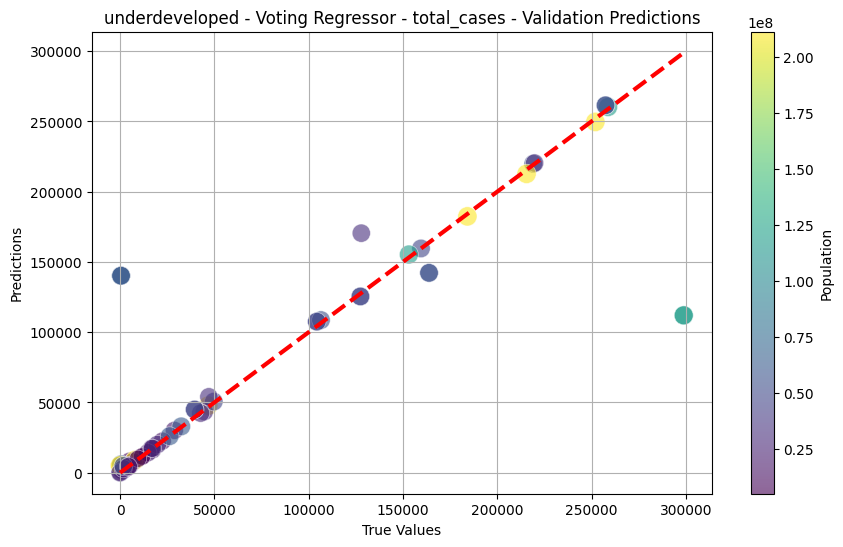

underdeveloped - Voting Regressor - total_deaths - Cross-Validation RMSE: 481.8537075508595
underdeveloped - Voting Regressor - total_deaths - Validation MSE: 207261.61, RMSE: 455.26, MAE: 169.08, R2: 0.9076
underdeveloped - Voting Regressor - total_deaths - Test MSE: 118722.48, RMSE: 344.56, MAE: 143.30, R2: 0.9667


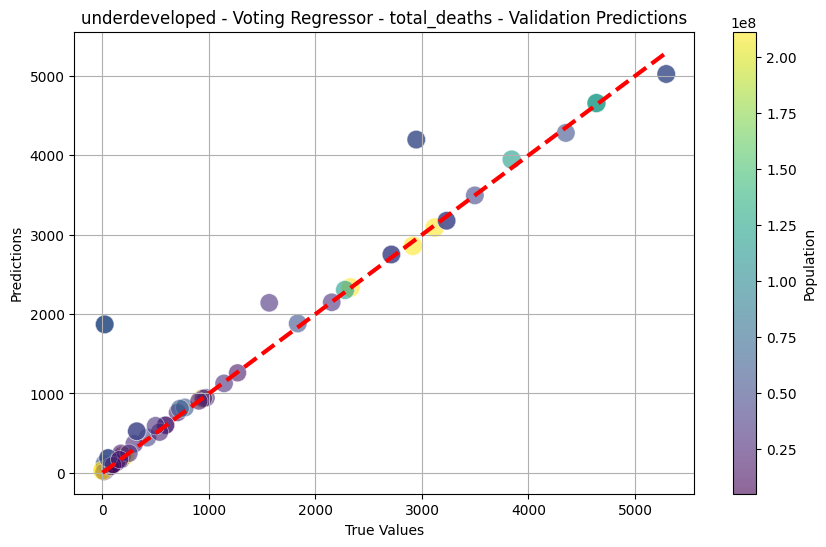

underdeveloped - Voting Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 137.0748716512373
underdeveloped - Voting Regressor - All strains - All types of surveillance - Validation MSE: 2995.28, RMSE: 54.73, MAE: 28.31, R2: 0.9932
underdeveloped - Voting Regressor - All strains - All types of surveillance - Test MSE: 2998.54, RMSE: 54.76, MAE: 29.74, R2: 0.9968


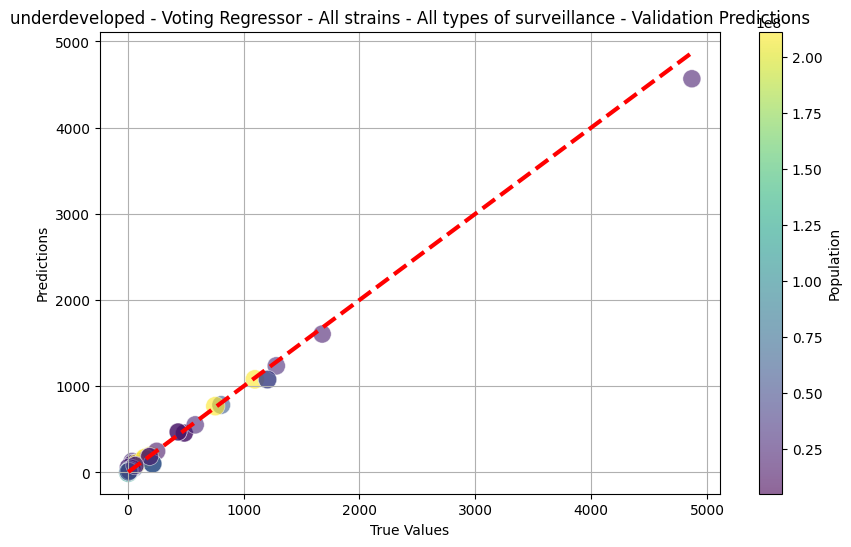

underdeveloped - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 100.69310722406041
underdeveloped - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 10057.76, RMSE: 100.29, MAE: 36.51, R2: 0.8443
underdeveloped - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 16411.24, RMSE: 128.11, MAE: 41.01, R2: 0.6819


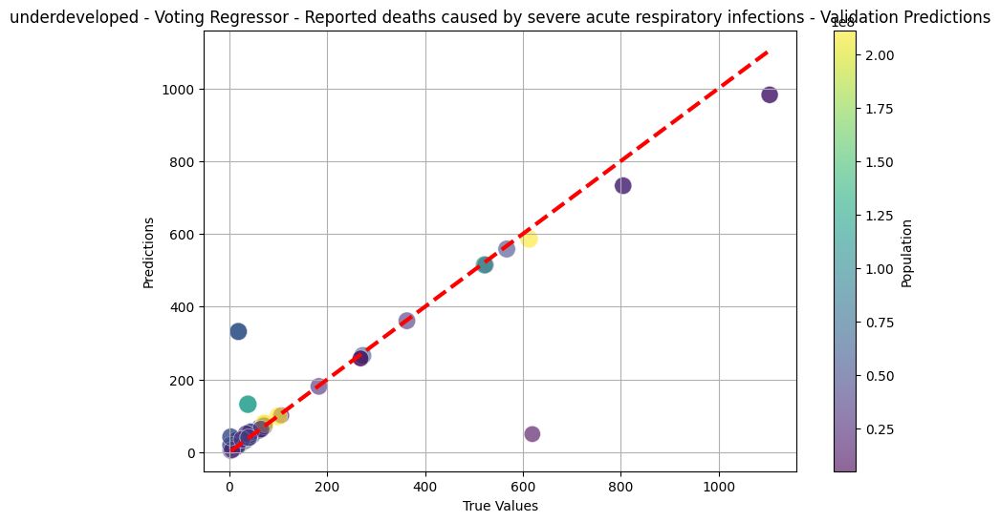

island - Voting Regressor - total_cases - Cross-Validation RMSE: 100162.51755658083
island - Voting Regressor - total_cases - Validation MSE: 3279506480.41, RMSE: 57266.98, MAE: 15792.00, R2: 0.9941
island - Voting Regressor - total_cases - Test MSE: 2284443153.38, RMSE: 47795.85, MAE: 10328.46, R2: 0.9959


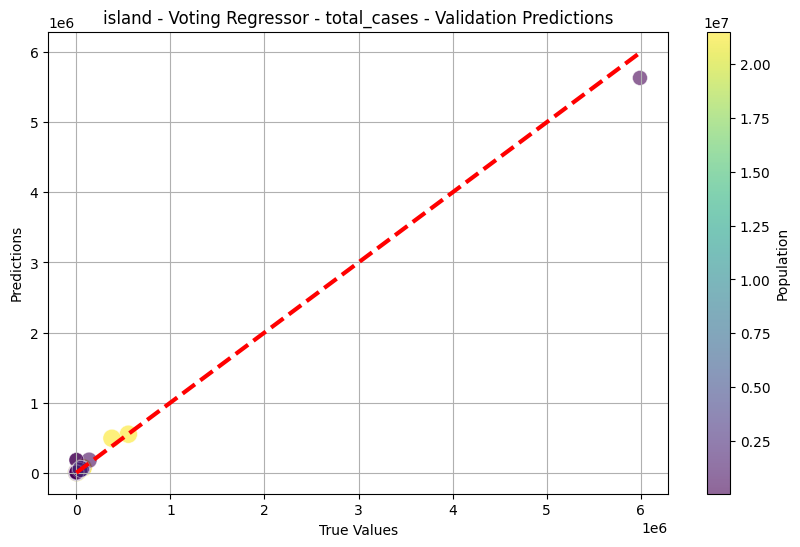

island - Voting Regressor - total_deaths - Cross-Validation RMSE: 12317.090280811197
island - Voting Regressor - total_deaths - Validation MSE: 61047291.02, RMSE: 7813.28, MAE: 2408.06, R2: 0.9077
island - Voting Regressor - total_deaths - Test MSE: 13124639.88, RMSE: 3622.79, MAE: 1437.54, R2: 0.9891


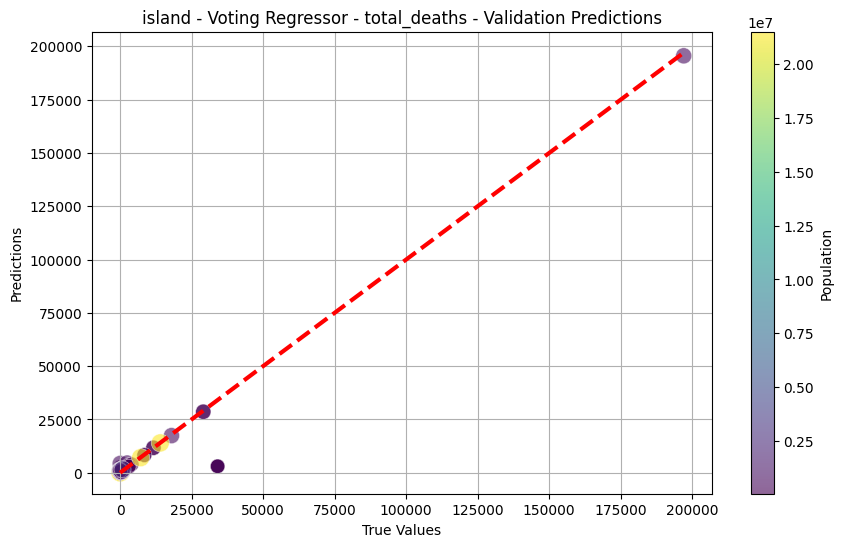

island - Voting Regressor - All strains - All types of surveillance - Cross-Validation RMSE: 171.99206558099857
island - Voting Regressor - All strains - All types of surveillance - Validation MSE: 77414.52, RMSE: 278.23, MAE: 101.95, R2: 0.7526
island - Voting Regressor - All strains - All types of surveillance - Test MSE: 122946.65, RMSE: 350.64, MAE: 106.78, R2: 0.7430


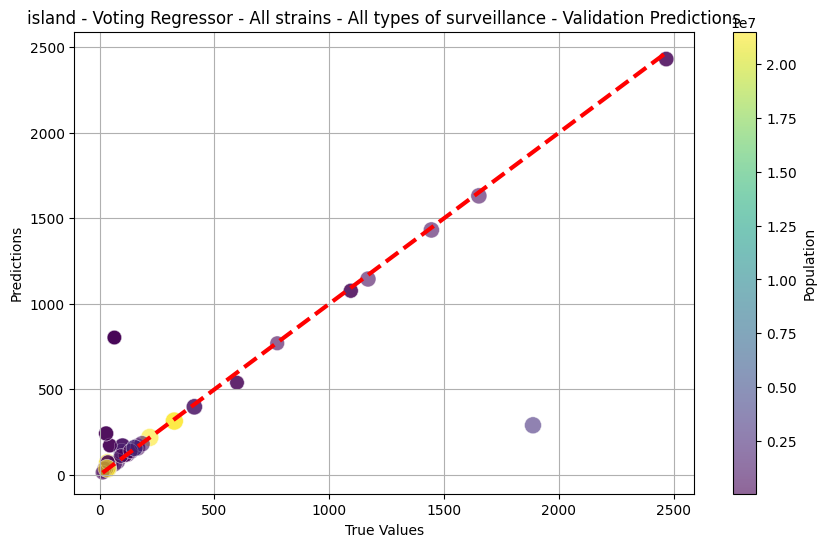

island - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Cross-Validation RMSE: 79.60264239854261
island - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Validation MSE: 6197.09, RMSE: 78.72, MAE: 32.40, R2: 0.8057
island - Voting Regressor - Reported deaths caused by severe acute respiratory infections - Test MSE: 1185.39, RMSE: 34.43, MAE: 18.32, R2: 0.9819


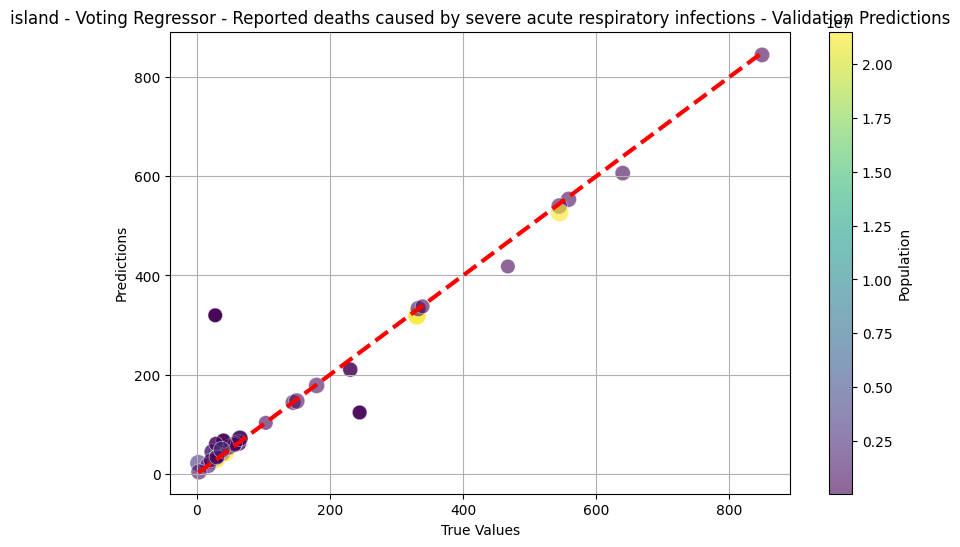


Model Comparison:
          Category                                             Target  \
0        developed                                        total_cases   
1        developed                                       total_deaths   
2        developed            All strains - All types of surveillance   
3        developed  Reported deaths caused by severe acute respira...   
4       developing                                        total_cases   
5       developing                                       total_deaths   
6       developing            All strains - All types of surveillance   
7       developing  Reported deaths caused by severe acute respira...   
8   underdeveloped                                        total_cases   
9   underdeveloped                                       total_deaths   
10  underdeveloped            All strains - All types of surveillance   
11  underdeveloped  Reported deaths caused by severe acute respira...   
12          island              

In [44]:
# Function to impute missing values by sampling from existing values in the same column
def impute_by_sampling(data):
    for column in data.columns:
        if data[column].isnull().sum() > 0:  # If there are missing values in the column
            # Sample with replacement from the non-missing values in the column
            data[column] = data[column].apply(lambda x: np.random.choice(data[column].dropna()) if pd.isnull(x) else x)
    return data

# Impute missing values in your data
project_merged_data_imputed = impute_by_sampling(project_merged_data)

# Function to evaluate model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Function to plot predictions with color bar
def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')
    plt.show()

# Function to preprocess data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    return data

# Function to train and evaluate Voting Regressor
def train_evaluate_voting(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with mean.")
        y = y.fillna(y.mean())  # Fill missing values with the mean


    # Split data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Define the base models
    model1 = DecisionTreeRegressor(random_state=42)
    model2 = RandomForestRegressor(n_estimators=100, random_state=42)
    model3 = XGBRegressor(random_state=42, objective='reg:squarederror')

    # Create the Voting Regressor
    voting_model = VotingRegressor(estimators=[
        ('dt', model1),
        ('rf', model2),
        ('xgb', model3)
    ])

    # Train the model on the training data
    voting_model.fit(X_train, y_train)

    # Cross-validation
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(voting_model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')
    cv_rmse = np.sqrt(-cv_scores)
    print(f'{category} - Voting Regressor - {target} - Cross-Validation RMSE: {cv_rmse.mean()}')

    # Make predictions on the validation and test sets
    y_val_pred = voting_model.predict(X_val)
    y_test_pred = voting_model.predict(X_test)

    # Validate the model
    val_mse, val_rmse, val_mae, val_r2 = evaluate_model(y_val, y_val_pred)
    print(f'{category} - Voting Regressor - {target} - Validation MSE: {val_mse:.2f}, RMSE: {val_rmse:.2f}, MAE: {val_mae:.2f}, R2: {val_r2:.4f}')

    # Test the model
    test_mse, test_rmse, test_mae, test_r2 = evaluate_model(y_test, y_test_pred)
    print(f'{category} - Voting Regressor - {target} - Test MSE: {test_mse:.2f}, RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R2: {test_r2:.4f}')

    # Plot predictions
    plot_predictions(y_val, y_val_pred, populations.loc[X_val.index], f"{category} - Voting Regressor - {target} - Validation Predictions")

    return voting_model, test_mse, test_rmse, test_mae, test_r2

# Define the target variables
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define the feature variables (independent variables)
features = [col for col in project_merged_data_imputed.columns if col not in target_variables + ['date', 'location', 'population']]

# Define country lists for each category
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Filter and preprocess data
def filter_and_preprocess_data(data, country_list):
    filtered_data = data[data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    return filtered_data

# To store performance metrics for comparison
voting_performance_metrics = []

# Apply the Voting Regressor model to each category and target
for category, country_list in country_categories.items():
    filtered_data = filter_and_preprocess_data(project_merged_data_imputed, country_list)
    for target in target_variables:
        model, test_mse, test_rmse, test_mae, test_r2 = train_evaluate_voting(filtered_data, category, target)
        voting_performance_metrics.append({
            'Category': category,
            'Target': target,
            'Test MSE': test_mse,
            'Test RMSE': test_rmse,
            'Test MAE': test_mae,
            'Test R²': test_r2
        })

# Compare model performances
performance_df = pd.DataFrame(voting_performance_metrics)
print("\nModel Comparison:")
print(performance_df)


MODELS WITH HYPERPARAMETER TUNING

XGBOOST

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - total_cases - Validation MSE: 60061182129.54, RMSE: 245073.83, MAE: 33664.41, R2: 0.9955
developed - total_cases - Test MSE: 180183546385.05, RMSE: 424480.33, MAE: 100991.33, R2: 0.9513


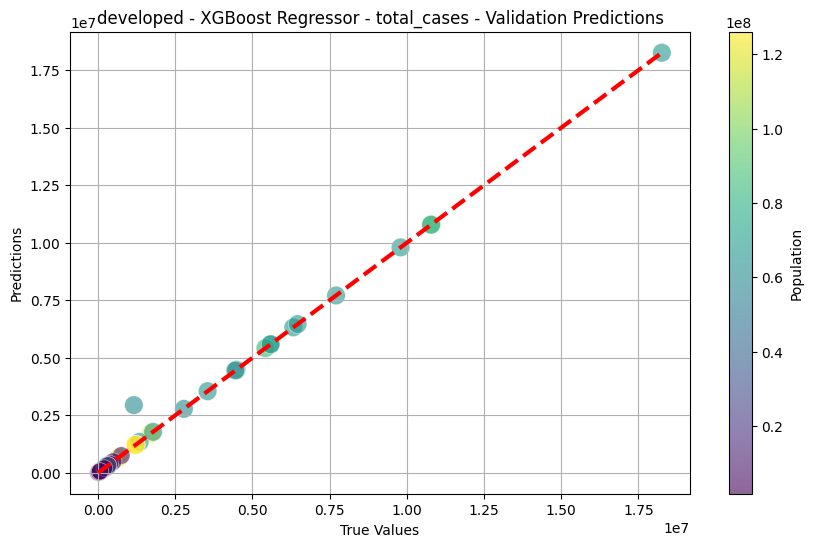

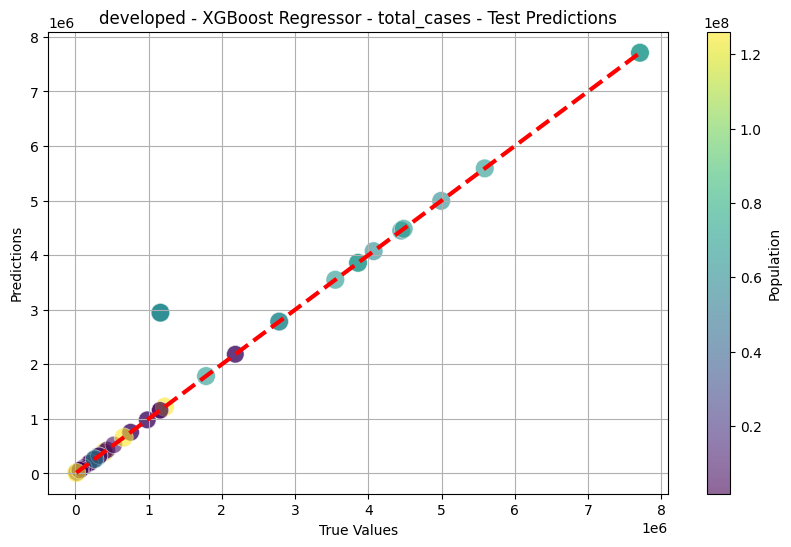

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - total_deaths - Validation MSE: 11805386.41, RMSE: 3435.90, MAE: 471.97, R2: 0.9950
developed - total_deaths - Test MSE: 35416159.24, RMSE: 5951.15, MAE: 1415.89, R2: 0.9824


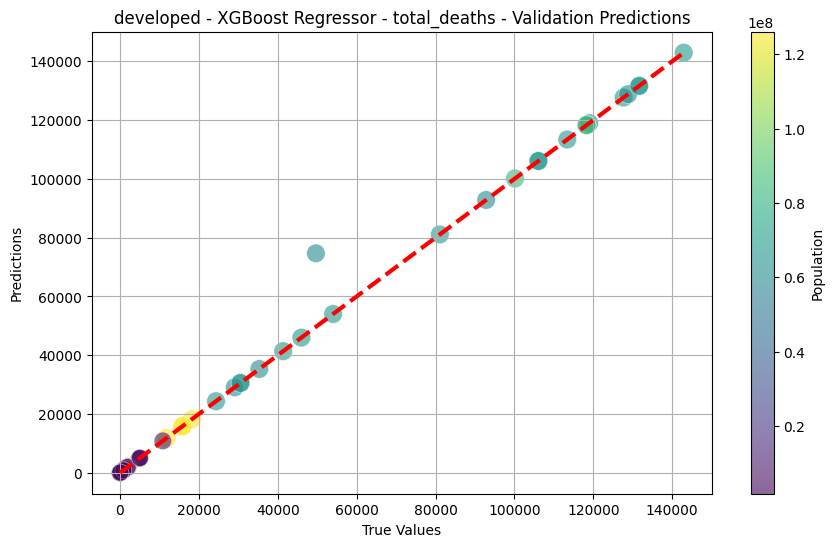

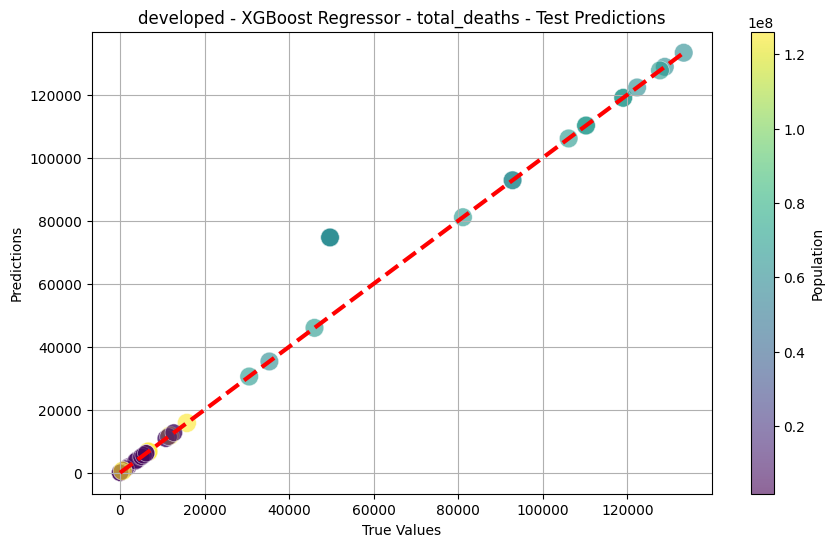

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - All strains - All types of surveillance - Validation MSE: 3290.94, RMSE: 57.37, MAE: 7.97, R2: 0.9860
developed - All strains - All types of surveillance - Test MSE: 9872.80, RMSE: 99.36, MAE: 23.75, R2: 0.9844


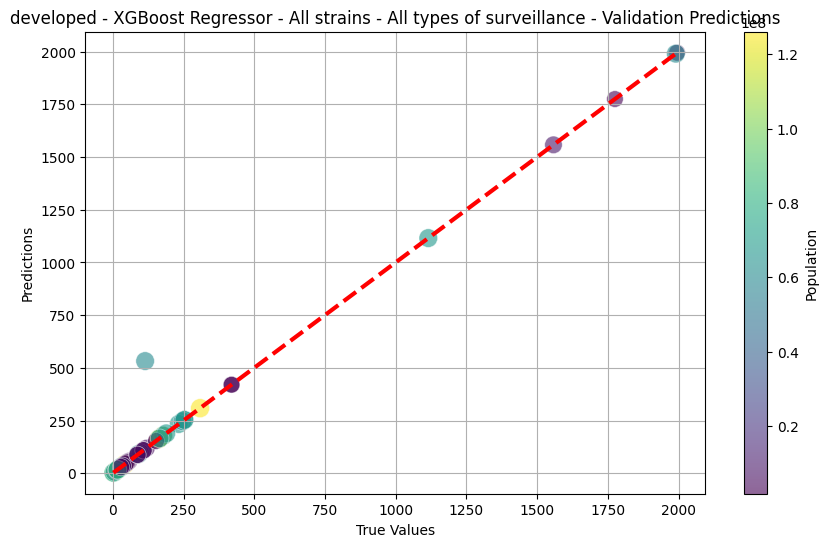

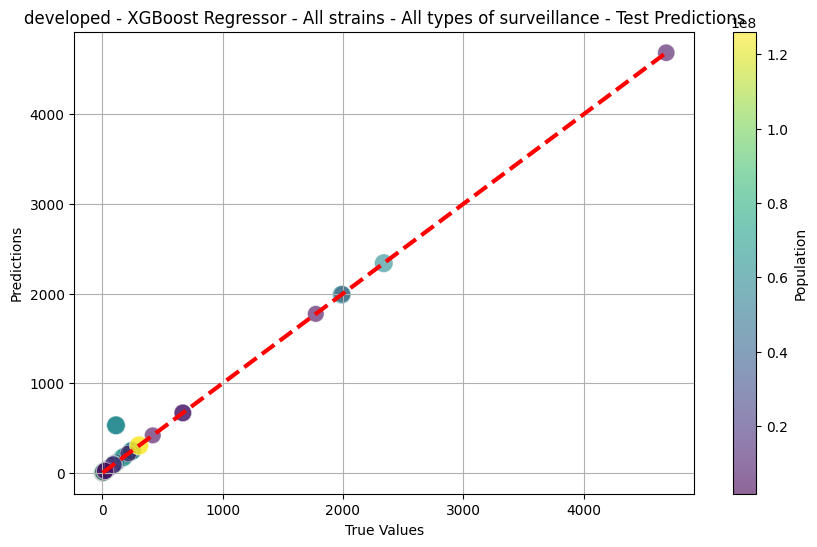

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - Reported deaths caused by severe acute respiratory infections - Validation MSE: 0.80, RMSE: 0.89, MAE: 0.44, R2: 1.0000
developed - Reported deaths caused by severe acute respiratory infections - Test MSE: 2.11, RMSE: 1.45, MAE: 0.75, R2: 1.0000


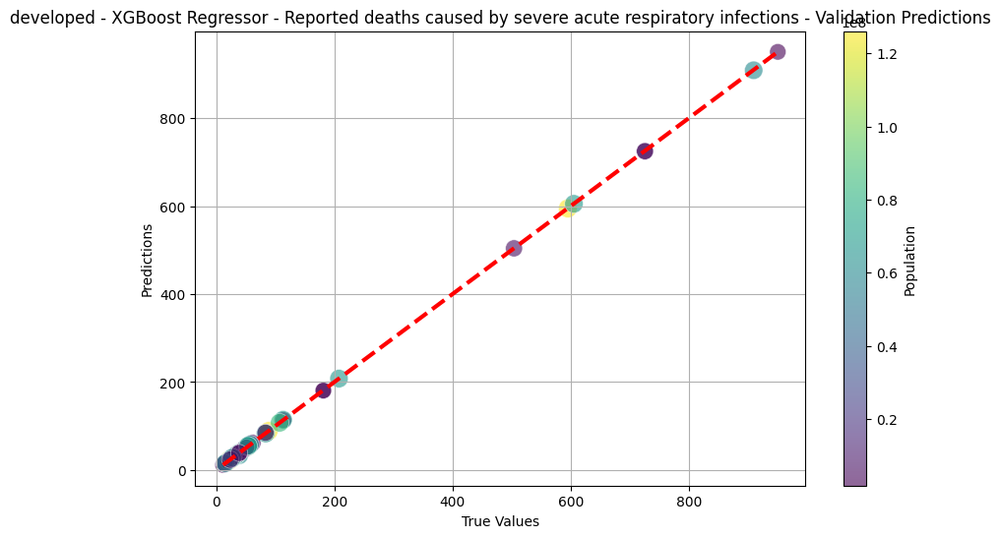

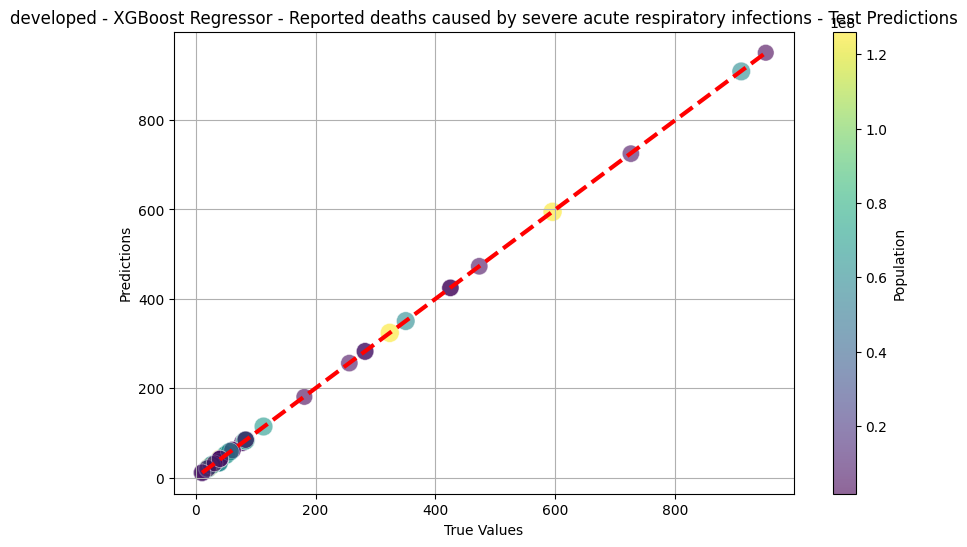

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - total_cases - Validation MSE: 7098843126.92, RMSE: 84254.63, MAE: 17255.25, R2: 0.9999
developing - total_cases - Test MSE: 6980529078.15, RMSE: 83549.56, MAE: 16968.15, R2: 0.9999


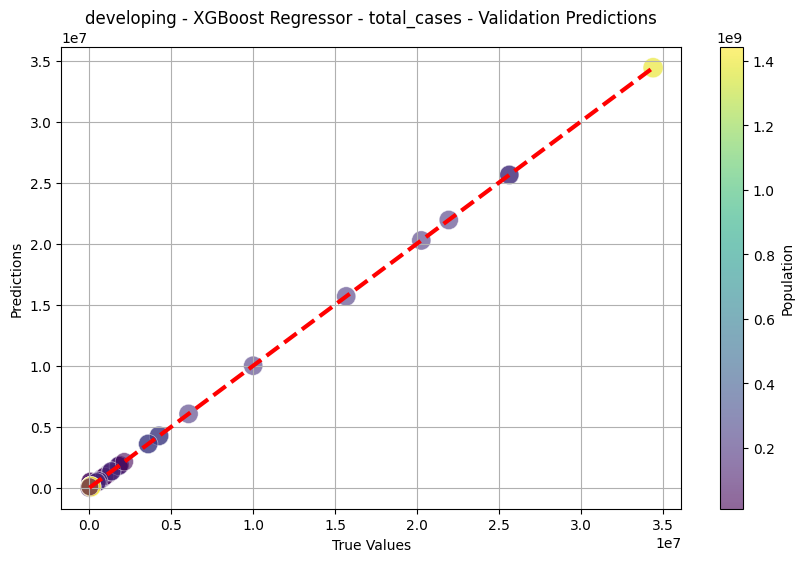

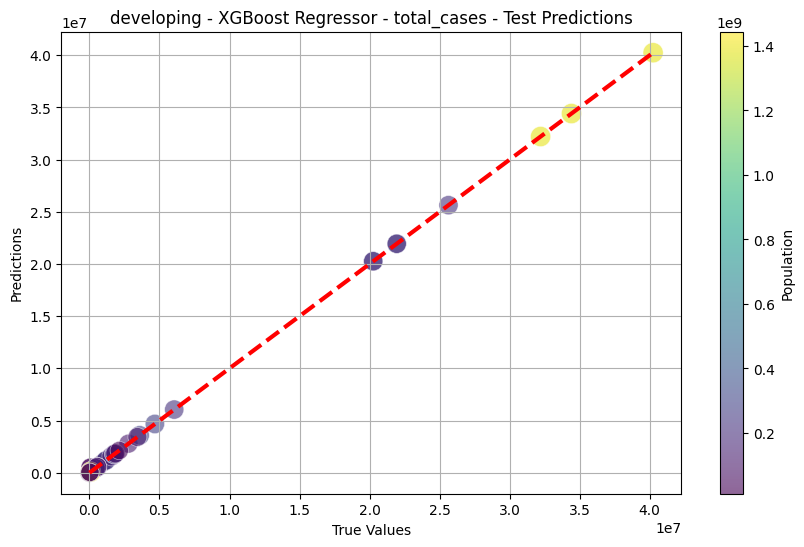

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - total_deaths - Validation MSE: 2311222.96, RMSE: 1520.27, MAE: 1014.49, R2: 0.9999
developing - total_deaths - Test MSE: 2315721.90, RMSE: 1521.75, MAE: 959.41, R2: 0.9999


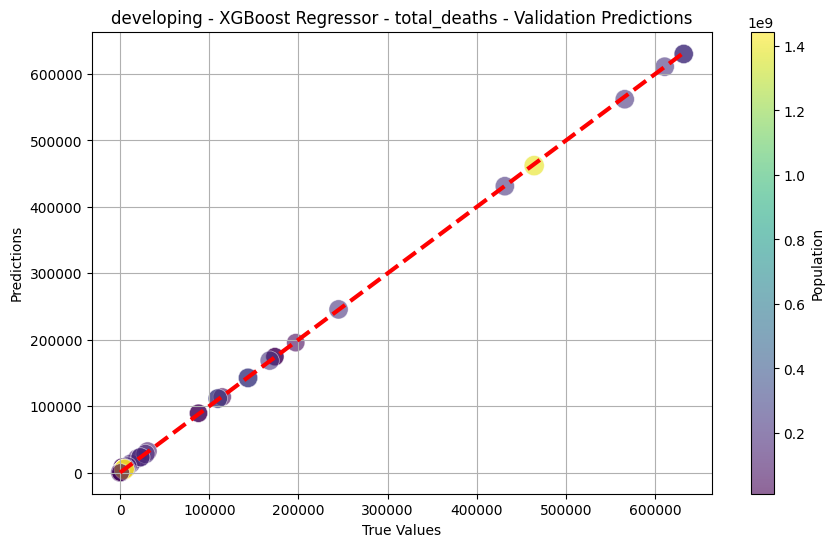

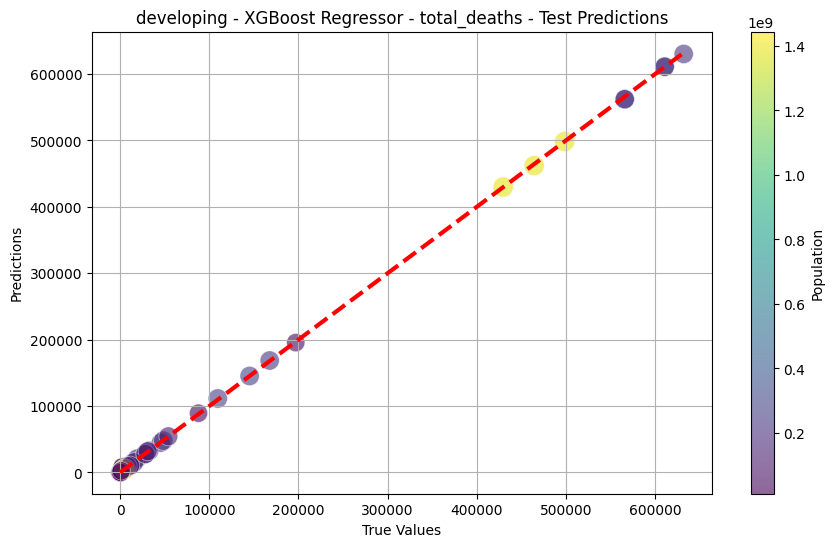

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - All strains - All types of surveillance - Validation MSE: 12680.70, RMSE: 112.61, MAE: 29.25, R2: 0.9388
developing - All strains - All types of surveillance - Test MSE: 12469.36, RMSE: 111.67, MAE: 28.77, R2: 0.9481


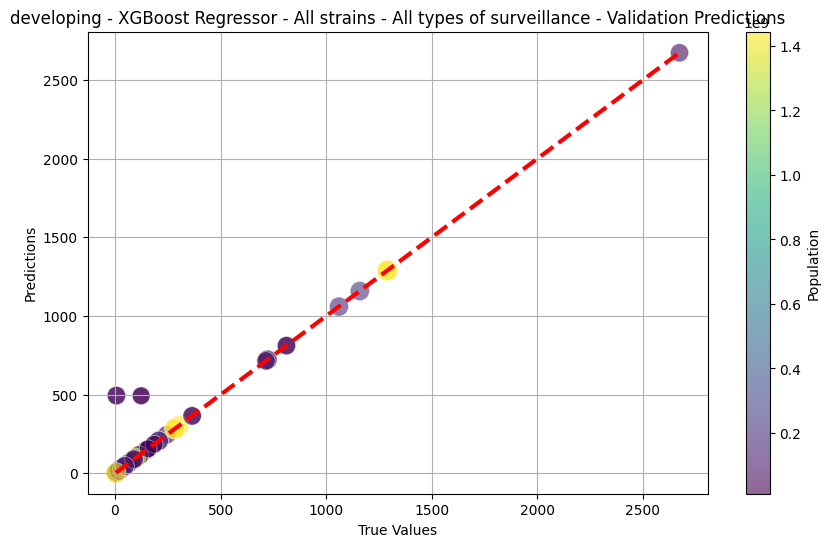

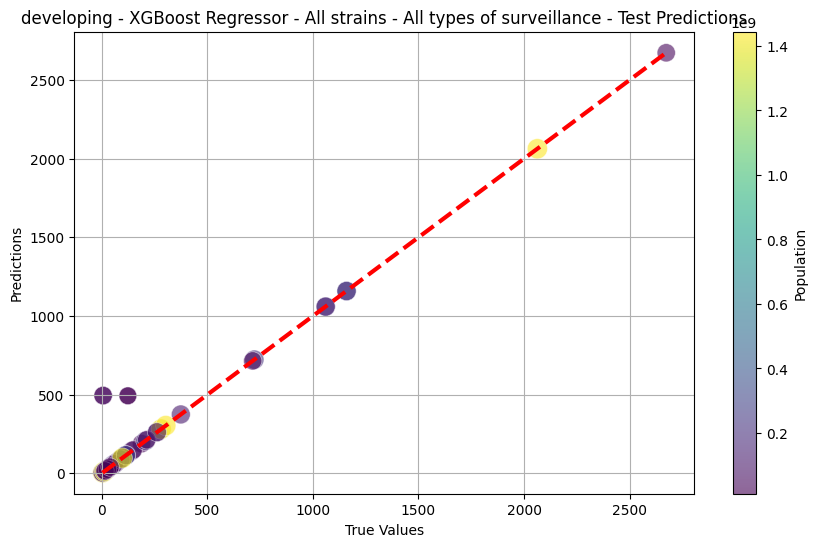

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - Reported deaths caused by severe acute respiratory infections - Validation MSE: 149321.01, RMSE: 386.42, MAE: 71.28, R2: 0.1462
developing - Reported deaths caused by severe acute respiratory infections - Test MSE: 146832.33, RMSE: 383.19, MAE: 70.09, R2: 0.1000


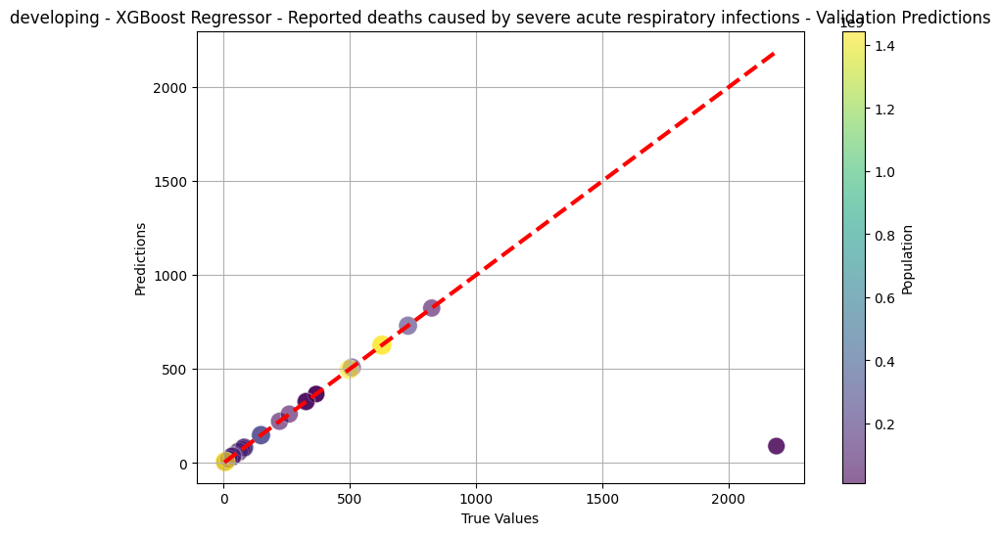

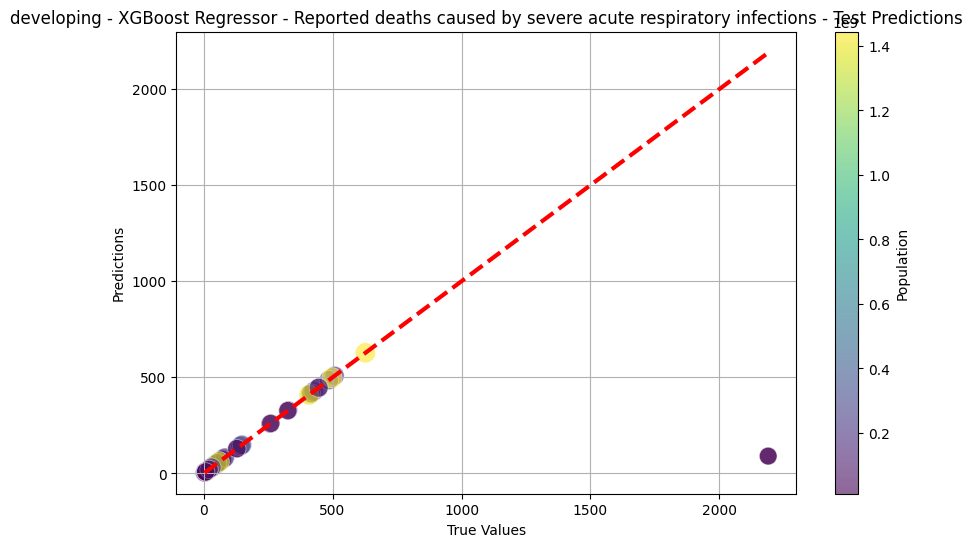

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - total_cases - Validation MSE: 2434134873.72, RMSE: 49336.95, MAE: 15599.98, R2: 0.6896
underdeveloped - total_cases - Test MSE: 2742136435.56, RMSE: 52365.41, MAE: 16754.04, R2: 0.7646


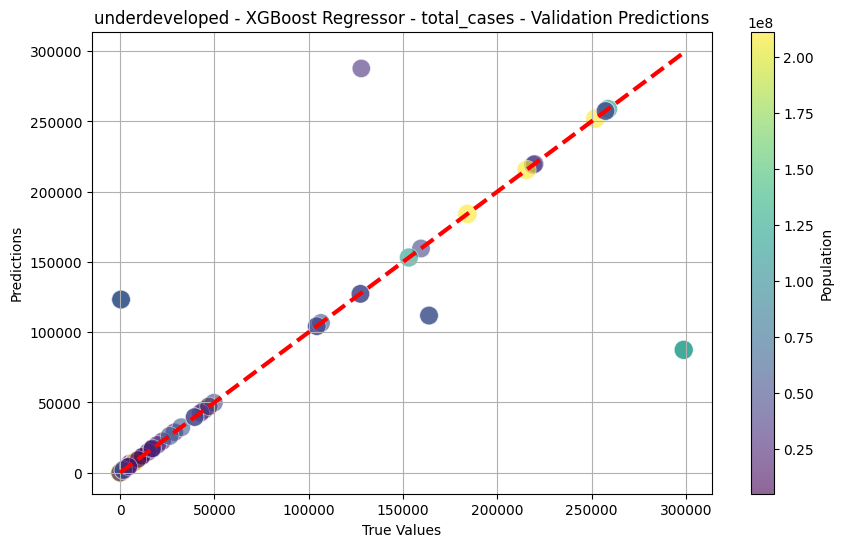

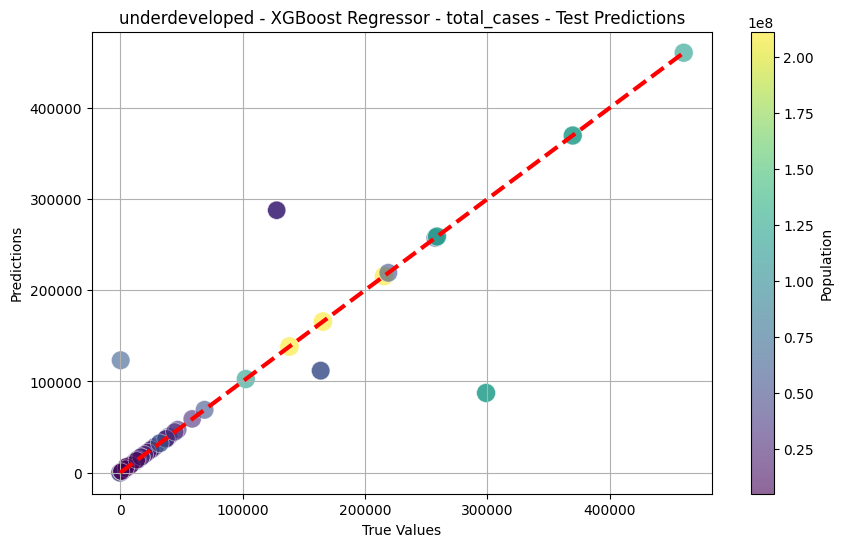

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - total_deaths - Validation MSE: 310367.12, RMSE: 557.11, MAE: 183.96, R2: 0.8617
underdeveloped - total_deaths - Test MSE: 270165.01, RMSE: 519.77, MAE: 175.31, R2: 0.9243


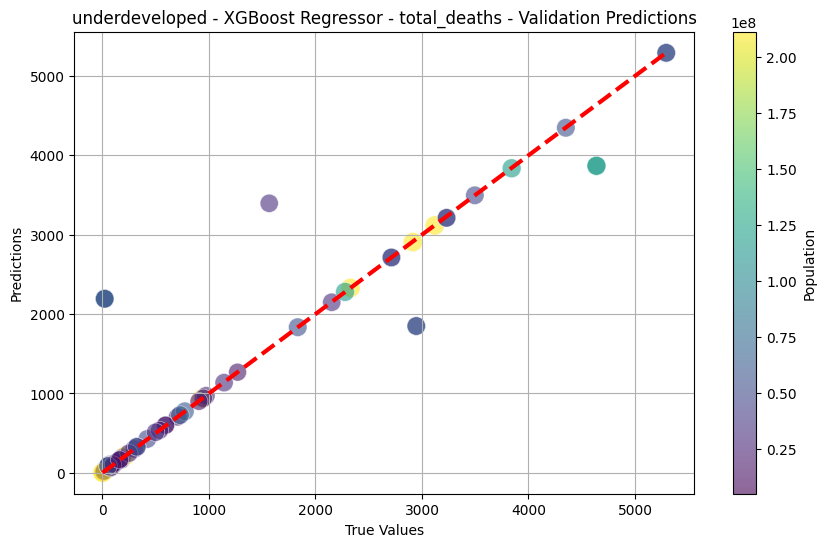

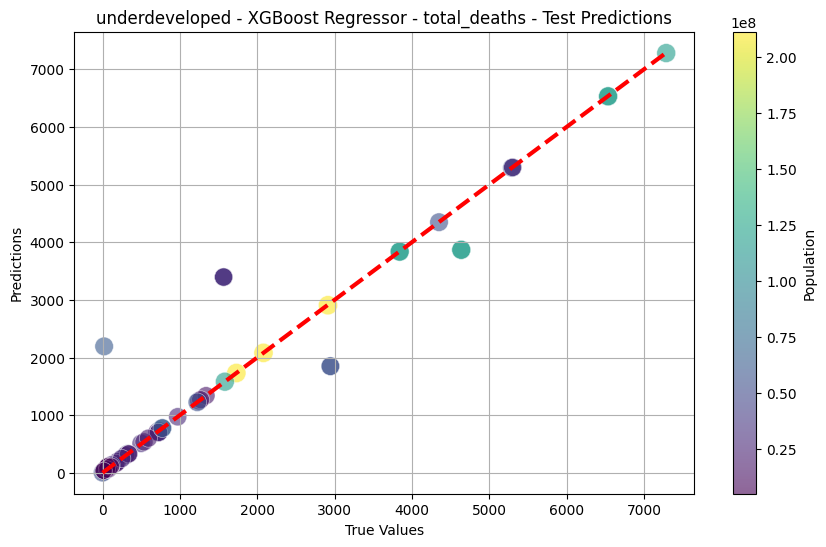

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - All strains - All types of surveillance - Validation MSE: 9.87, RMSE: 3.14, MAE: 0.93, R2: 1.0000
underdeveloped - All strains - All types of surveillance - Test MSE: 19.21, RMSE: 4.38, MAE: 1.44, R2: 1.0000


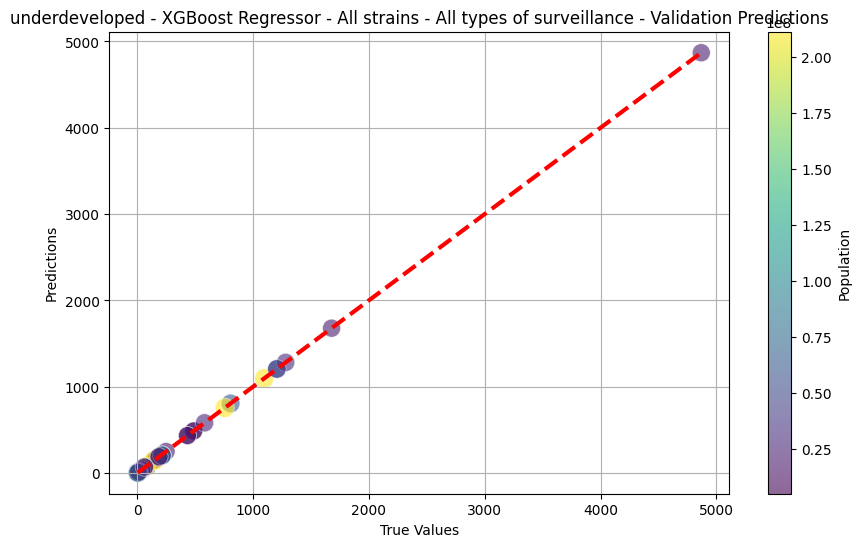

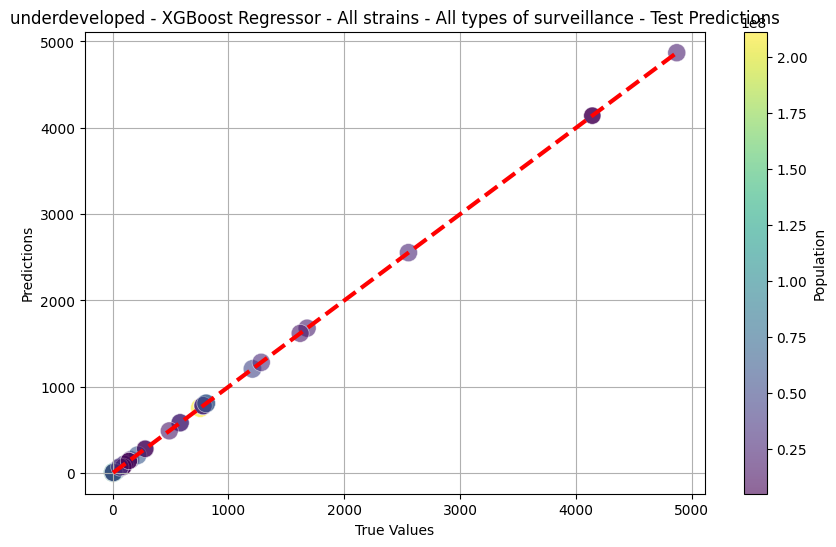

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - Reported deaths caused by severe acute respiratory infections - Validation MSE: 17320.97, RMSE: 131.61, MAE: 35.78, R2: 0.7318
underdeveloped - Reported deaths caused by severe acute respiratory infections - Test MSE: 19191.02, RMSE: 138.53, MAE: 37.68, R2: 0.6280


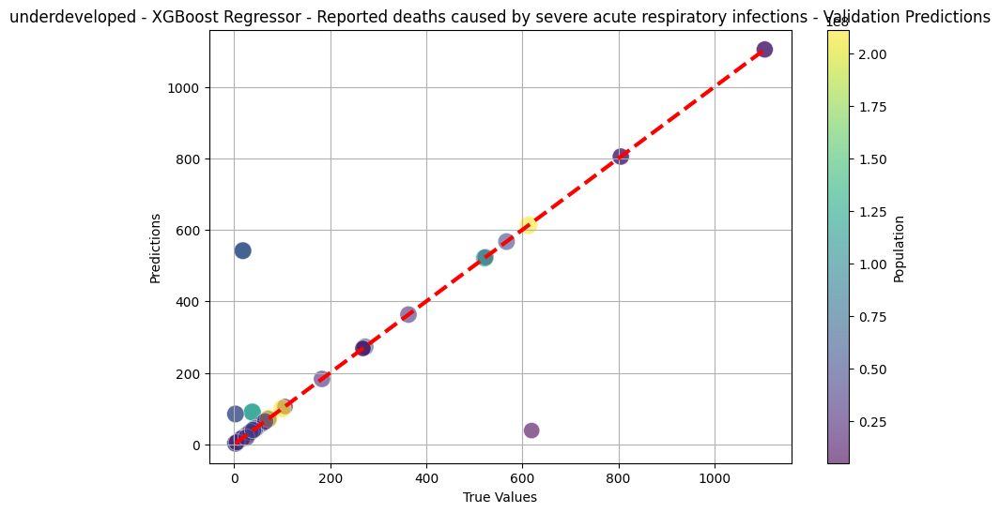

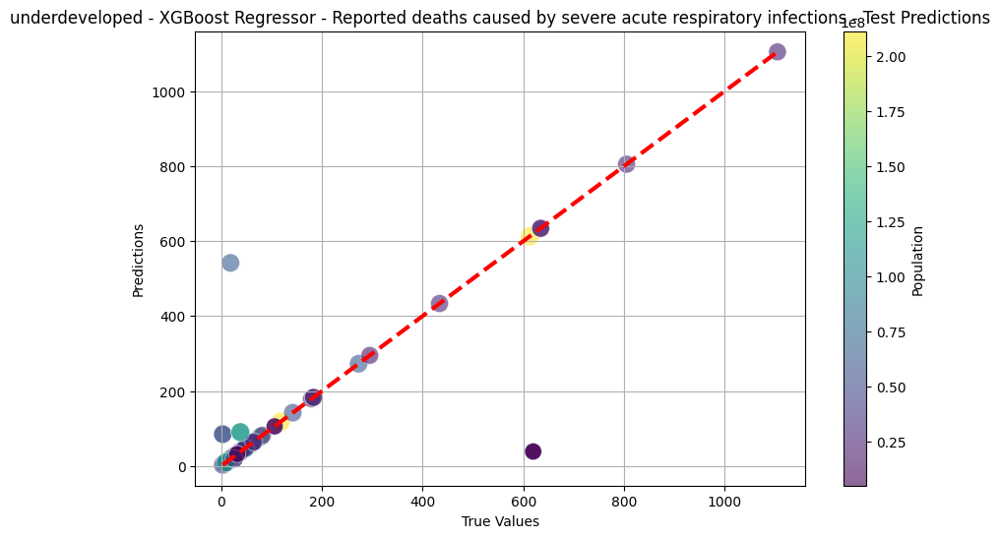

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - total_cases - Validation MSE: 52630884169.09, RMSE: 229414.22, MAE: 47549.12, R2: 0.9050
island - total_cases - Test MSE: 52044113027.15, RMSE: 228131.79, MAE: 42813.04, R2: 0.9056


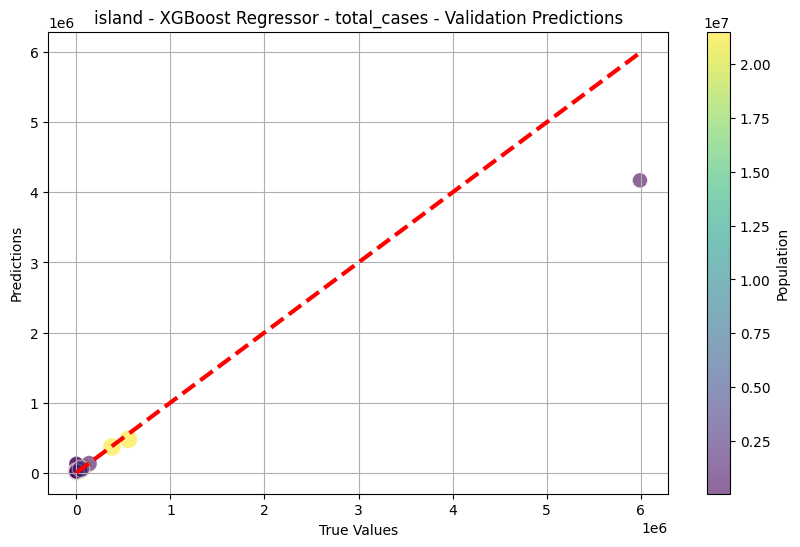

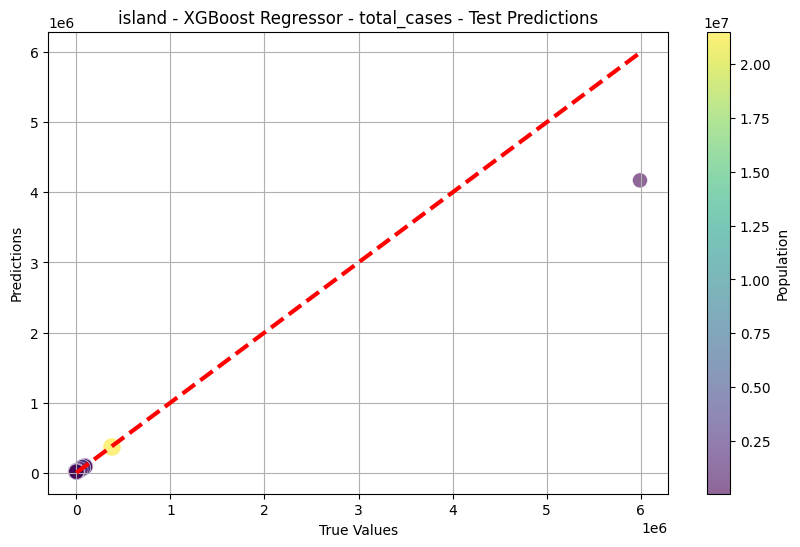

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - total_deaths - Validation MSE: 48298945.11, RMSE: 6949.74, MAE: 2048.09, R2: 0.9270
island - total_deaths - Test MSE: 760625.44, RMSE: 872.14, MAE: 124.42, R2: 0.9994


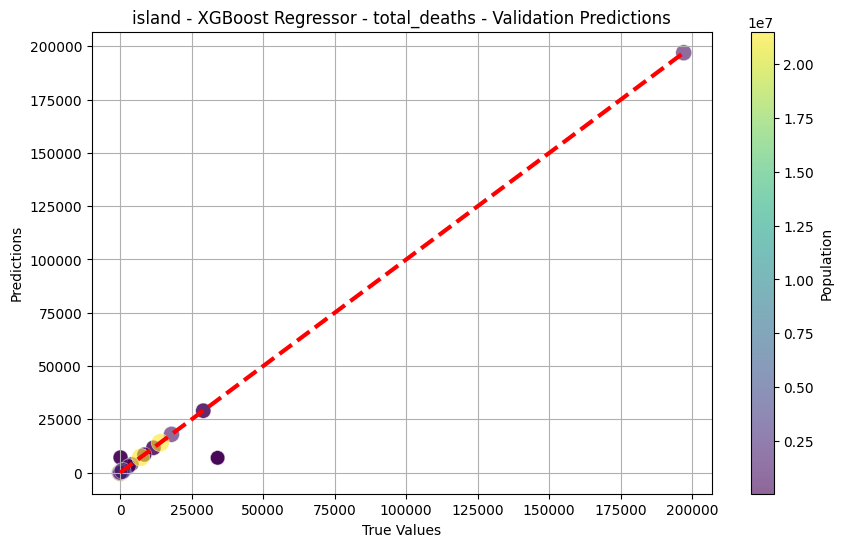

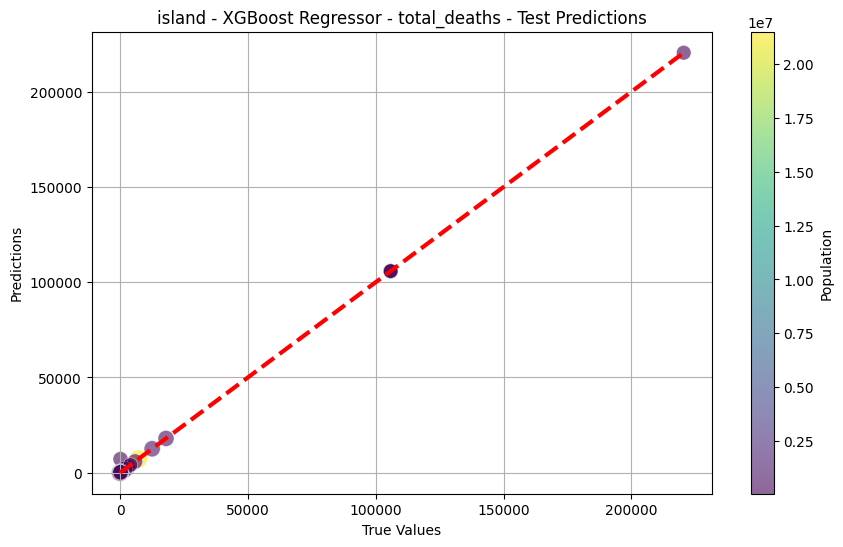

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - All strains - All types of surveillance - Validation MSE: 88823.78, RMSE: 298.03, MAE: 92.17, R2: 0.7162
island - All strains - All types of surveillance - Test MSE: 125255.61, RMSE: 353.91, MAE: 82.48, R2: 0.7382


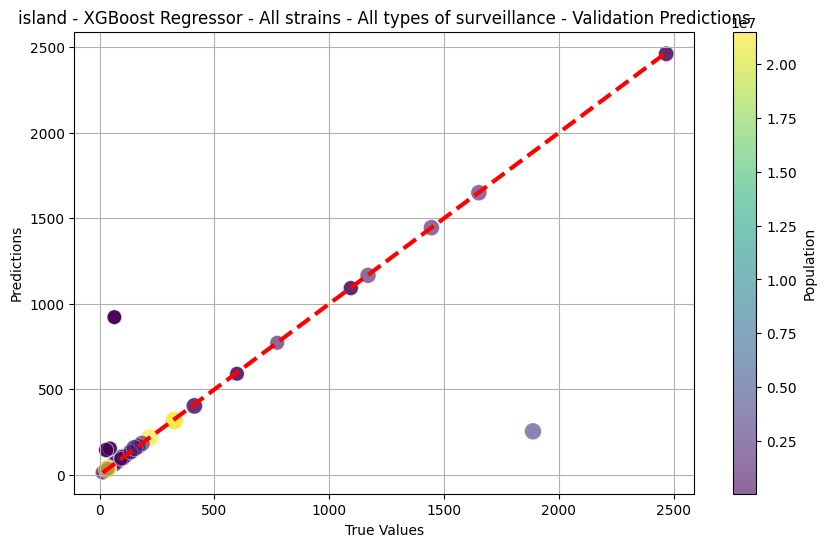

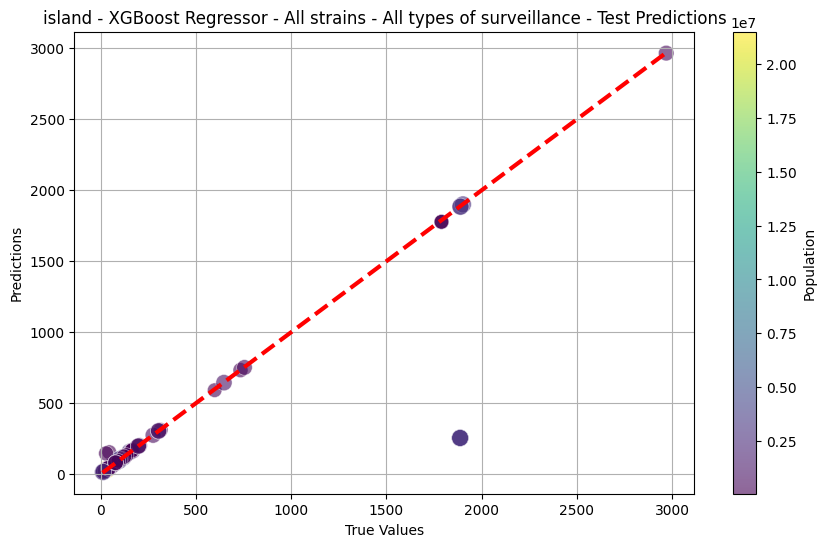

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - Reported deaths caused by severe acute respiratory infections - Validation MSE: 6485.75, RMSE: 80.53, MAE: 27.30, R2: 0.7966
island - Reported deaths caused by severe acute respiratory infections - Test MSE: 267.64, RMSE: 16.36, MAE: 3.49, R2: 0.9959


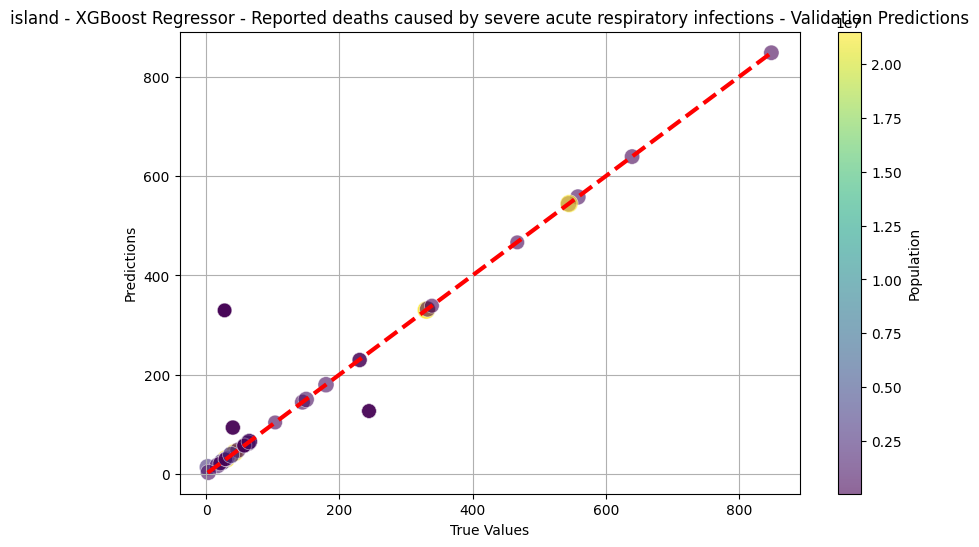

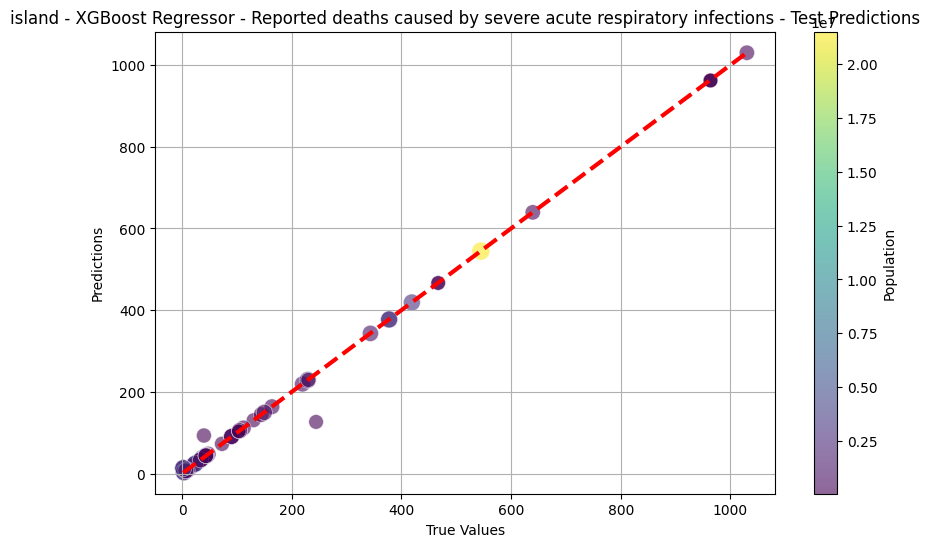

In [34]:
#XGBOOST GRIDSEARCHCV
# Load your merged data here
project_merged_data = pd.read_csv("/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv")

# Country list dictionary
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Define target variables for both COVID-19 and Influenza
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define feature variables (excluding date, location, and population)
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population']]

# KNN Imputation function
def impute_missing_values(X):
    """Impute missing values using KNN imputer."""
    imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
    X_imputed = imputer.fit_transform(X)
    X_imputed = pd.DataFrame(X_imputed, columns=X.columns)
    return X_imputed

# Preprocess the data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    # Impute missing values using KNN
    data = impute_missing_values(data)
    return data

# Train and evaluate XGBoost with GridSearchCV
def train_evaluate_xgboost(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with 0.")
        y = y.fillna(0)  # Optionally, use a different strategy, like y.fillna(y.mean())

    # Split data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Subset the populations for validation and test sets
    populations_val = populations.loc[X_val.index]
    populations_test = populations.loc[X_test.index]

    # Define the XGBoost model
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Set up the parameter grid for hyperparameter tuning
    param_grid = {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7, 10],
        'n_estimators': [100, 200, 500],
        'subsample': [0.8, 1.0]
    }

    # Use GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)

    # Best model from GridSearchCV
    best_model = grid_search.best_estimator_

    # Validate the model
    y_val_pred = best_model.predict(X_val)
    val_mse, val_rmse, val_mae, val_r2 = evaluate_model(y_val, y_val_pred)
    print(f'{category} - {target} - Validation MSE: {val_mse:.2f}, RMSE: {val_rmse:.2f}, MAE: {val_mae:.2f}, R2: {val_r2:.4f}')

    # Test the model
    y_test_pred = best_model.predict(X_test)
    test_mse, test_rmse, test_mae, test_r2 = evaluate_model(y_test, y_test_pred)
    print(f'{category} - {target} - Test MSE: {test_mse:.2f}, RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R2: {test_r2:.4f}')

    # Plot predictions
    plot_predictions(y_val, y_val_pred, populations_val, f"{category} - XGBoost Regressor - {target} - Validation Predictions")
    plot_predictions(y_test, y_test_pred, populations_test, f"{category} - XGBoost Regressor - {target} - Test Predictions")

    return best_model

def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))

    # Adjust point size
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)

    # Plotting the diagonal line
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)

    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)

    # Add color bar (keeping population reference)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')

    plt.show()

# Train and evaluate for each category and target
for category, country_list in country_categories.items():
    filtered_data = project_merged_data[project_merged_data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    for target in target_variables:
        model = train_evaluate_xgboost(filtered_data, category, target)

BAGGING REGRESSION

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developed - total_cases - Validation MSE: 167081568456.76, RMSE: 408756.12, MAE: 191832.90, R2: 0.9875
developed - total_cases - Test MSE: 223735211434.51, RMSE: 473006.57, MAE: 233067.60, R2: 0.9395


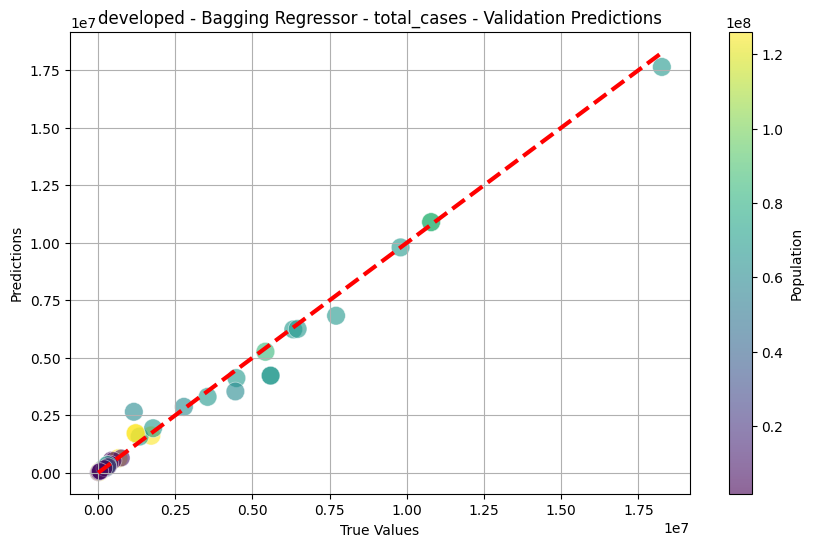

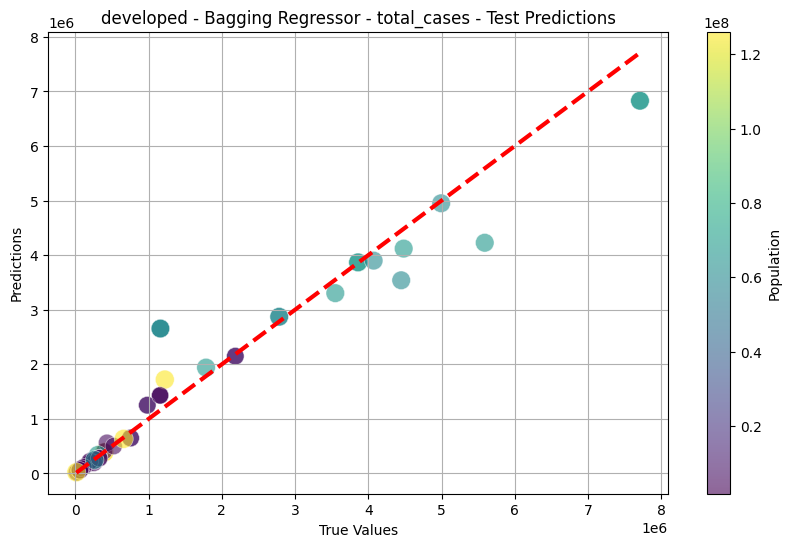

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developed - total_deaths - Validation MSE: 40956000.17, RMSE: 6399.69, MAE: 3188.03, R2: 0.9827
developed - total_deaths - Test MSE: 84011826.86, RMSE: 9165.80, MAE: 5665.47, R2: 0.9583


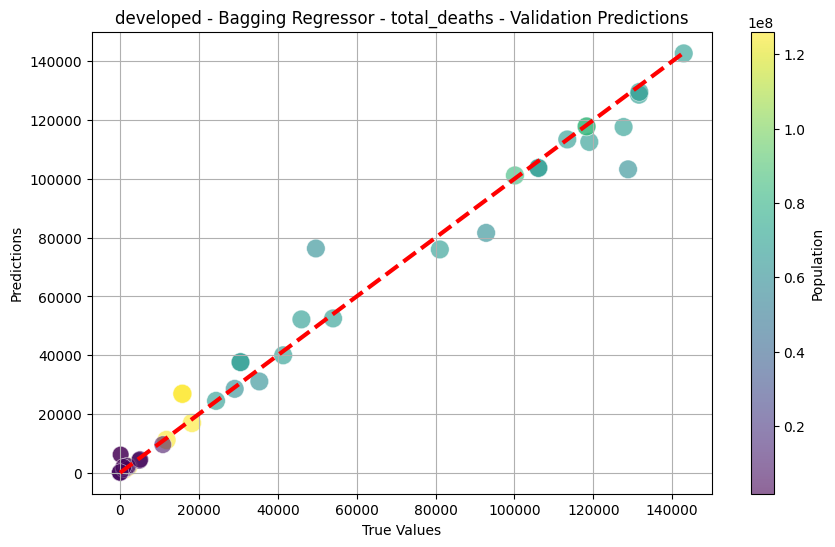

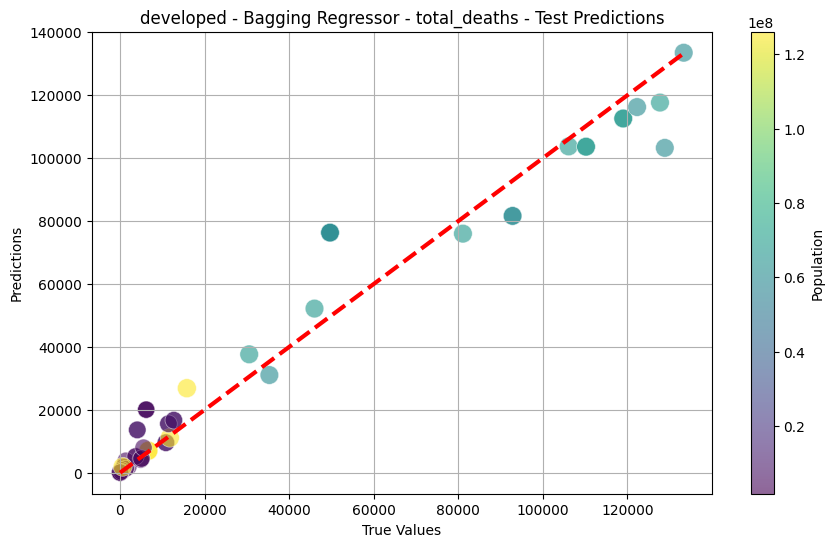

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developed - All strains - All types of surveillance - Validation MSE: 17353.62, RMSE: 131.73, MAE: 77.71, R2: 0.9261
developed - All strains - All types of surveillance - Test MSE: 22771.58, RMSE: 150.90, MAE: 86.41, R2: 0.9640


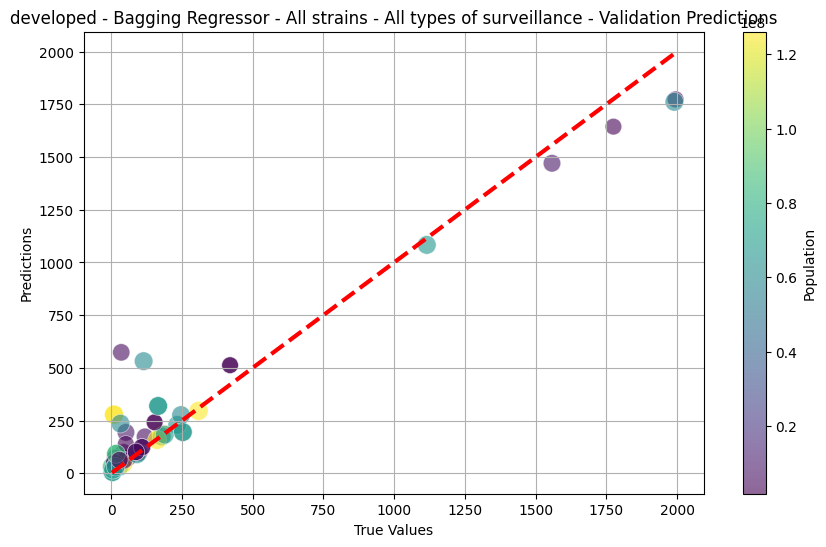

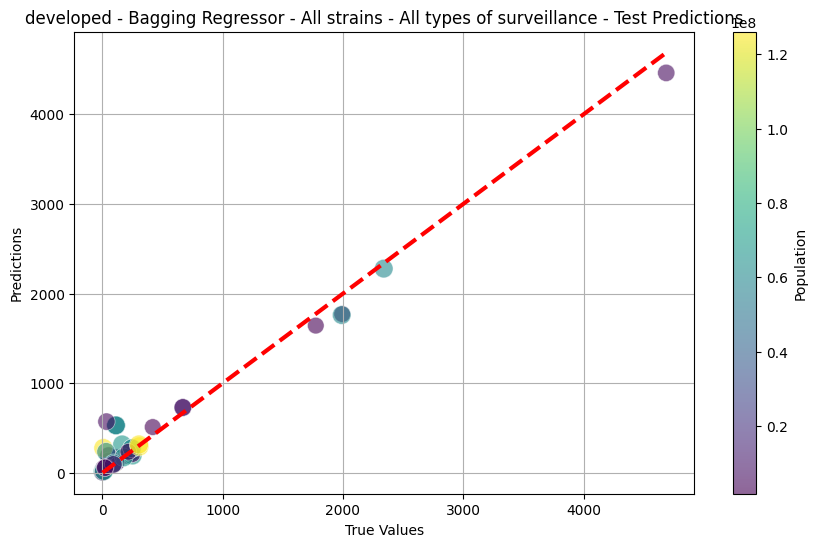

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developed - Reported deaths caused by severe acute respiratory infections - Validation MSE: 4679.55, RMSE: 68.41, MAE: 39.81, R2: 0.9155
developed - Reported deaths caused by severe acute respiratory infections - Test MSE: 6715.35, RMSE: 81.95, MAE: 53.80, R2: 0.8626


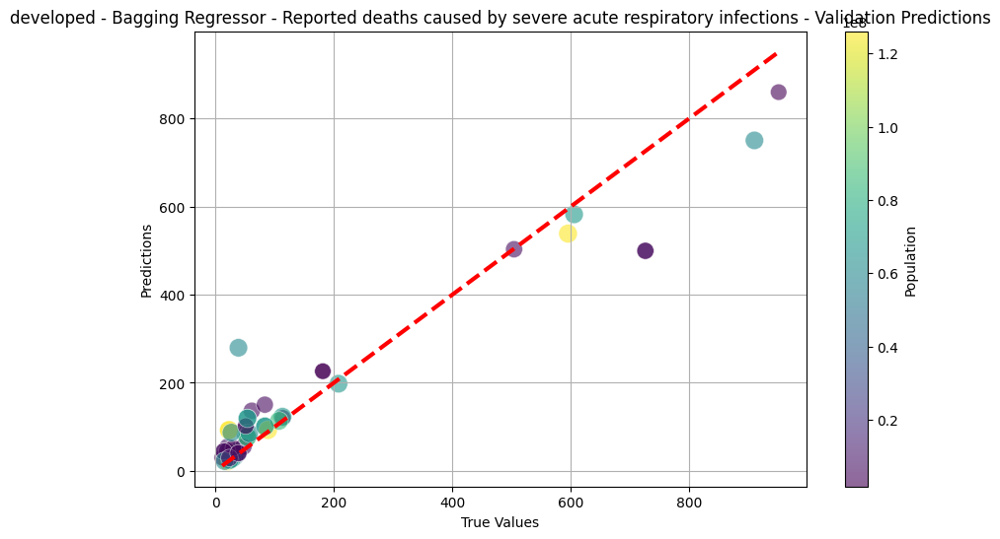

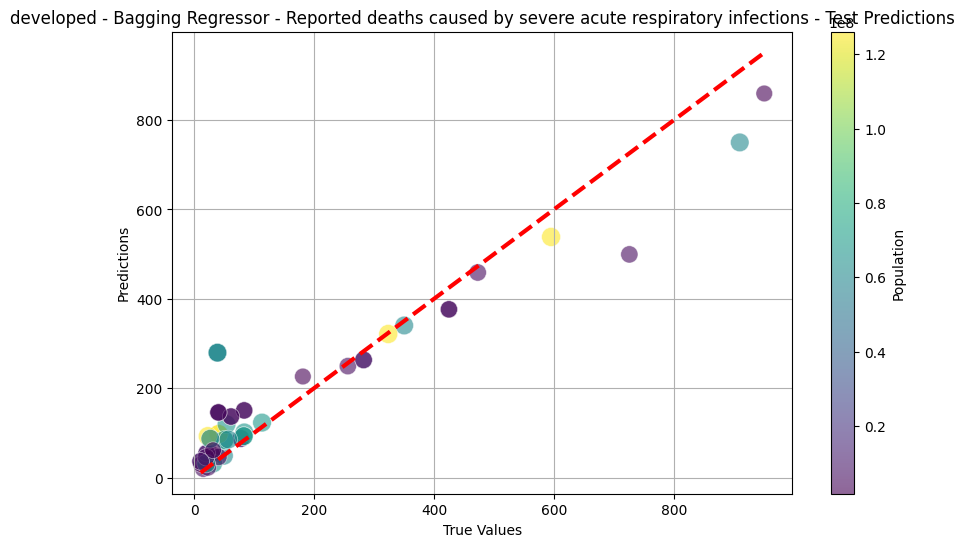

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developing - total_cases - Validation MSE: 937415260678.85, RMSE: 968202.08, MAE: 401314.96, R2: 0.9828
developing - total_cases - Test MSE: 1450086412211.05, RMSE: 1204195.34, MAE: 482877.52, R2: 0.9836


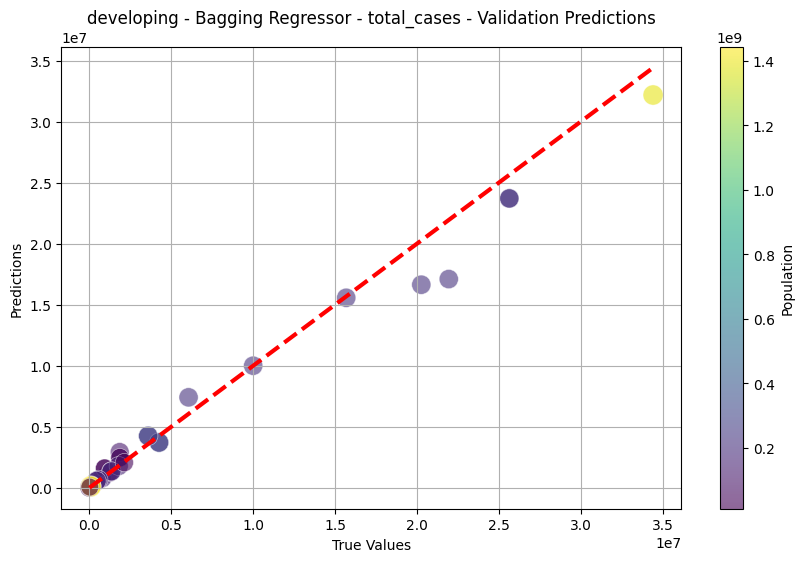

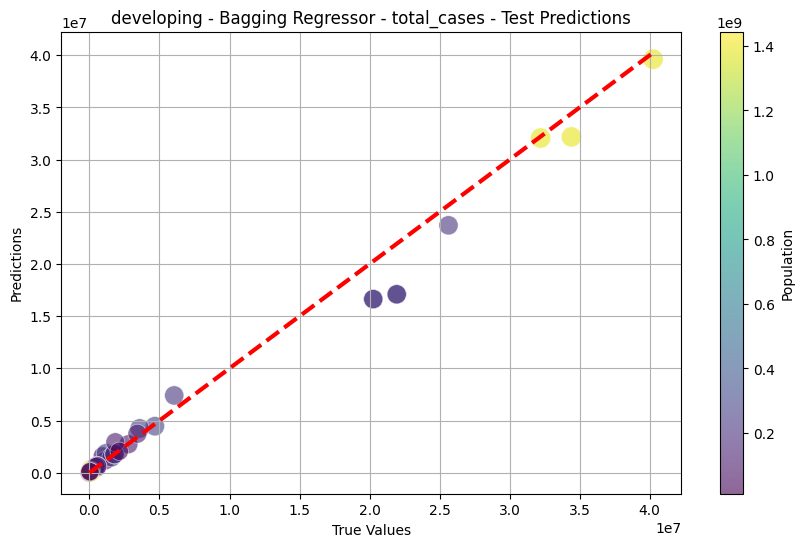

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developing - total_deaths - Validation MSE: 813307542.35, RMSE: 28518.55, MAE: 12084.96, R2: 0.9718
developing - total_deaths - Test MSE: 1125250197.28, RMSE: 33544.75, MAE: 13221.27, R2: 0.9671


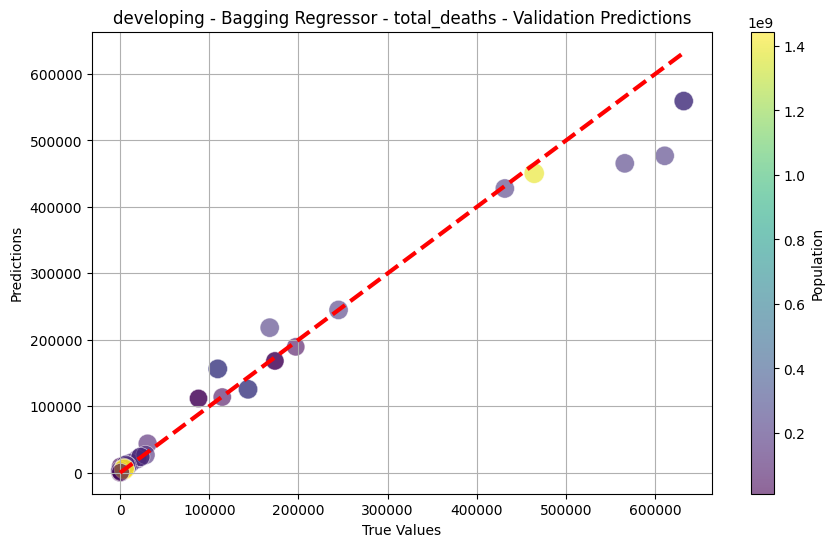

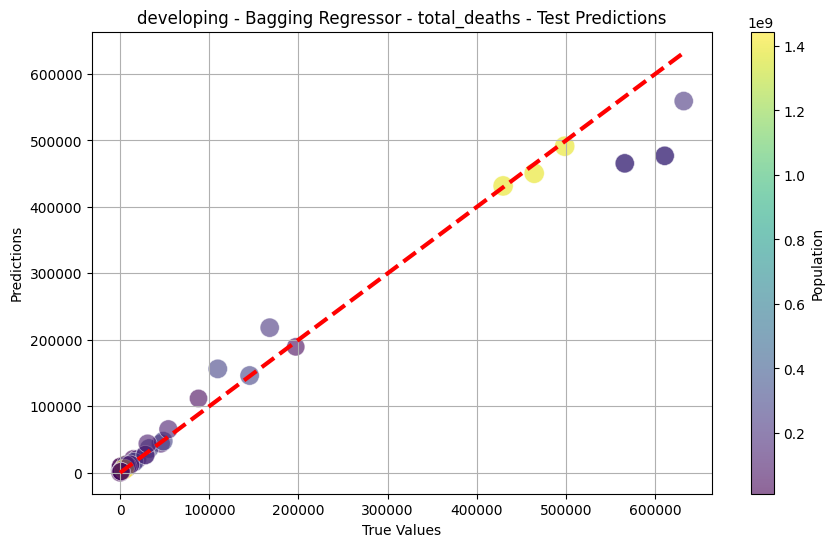

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developing - All strains - All types of surveillance - Validation MSE: 63412.45, RMSE: 251.82, MAE: 141.69, R2: 0.6940
developing - All strains - All types of surveillance - Test MSE: 24910.33, RMSE: 157.83, MAE: 95.48, R2: 0.8964


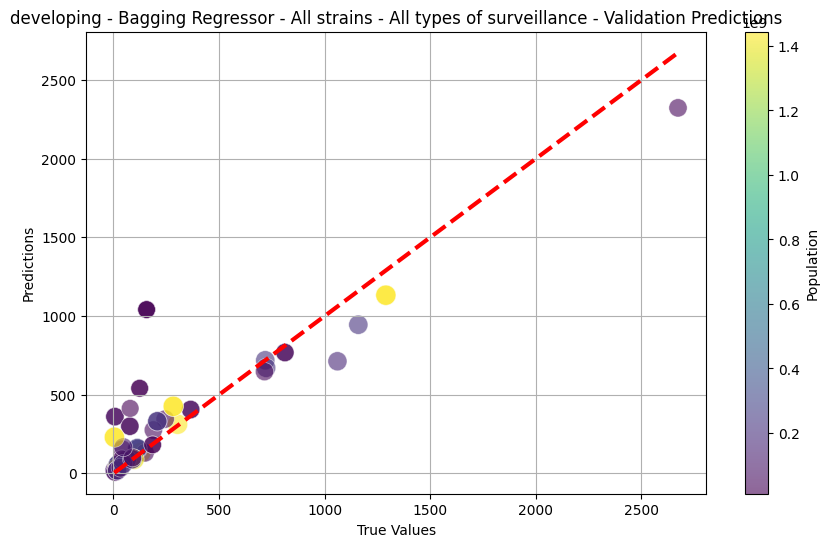

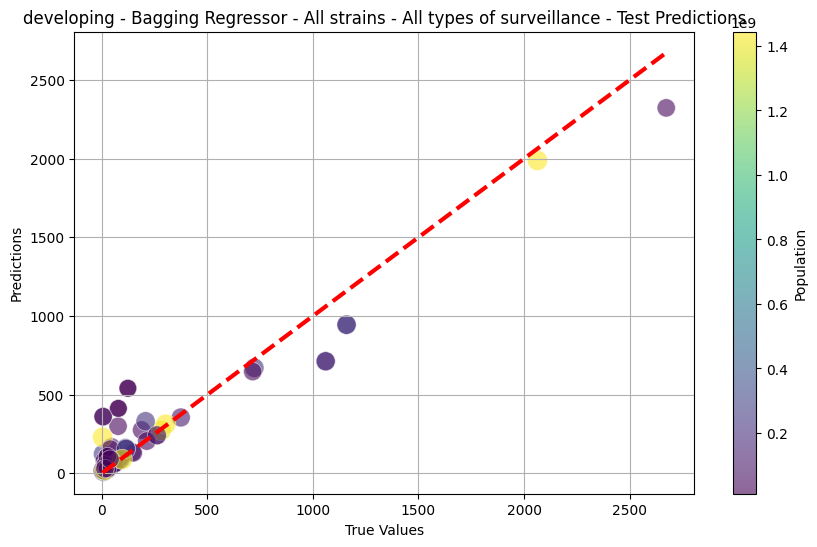

Fitting 5 folds for each of 12 candidates, totalling 60 fits
developing - Reported deaths caused by severe acute respiratory infections - Validation MSE: 145572.30, RMSE: 381.54, MAE: 96.03, R2: 0.1676
developing - Reported deaths caused by severe acute respiratory infections - Test MSE: 143366.75, RMSE: 378.64, MAE: 96.67, R2: 0.1213


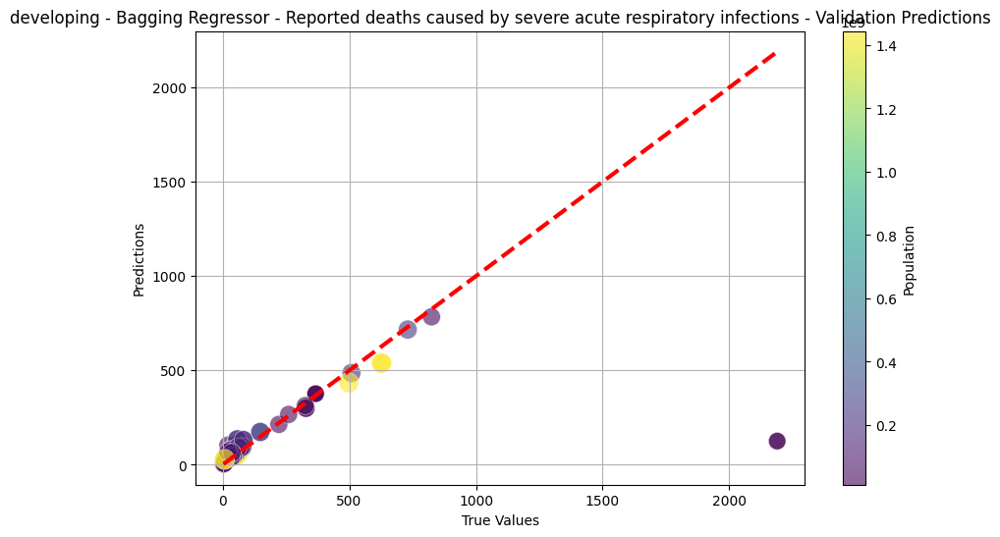

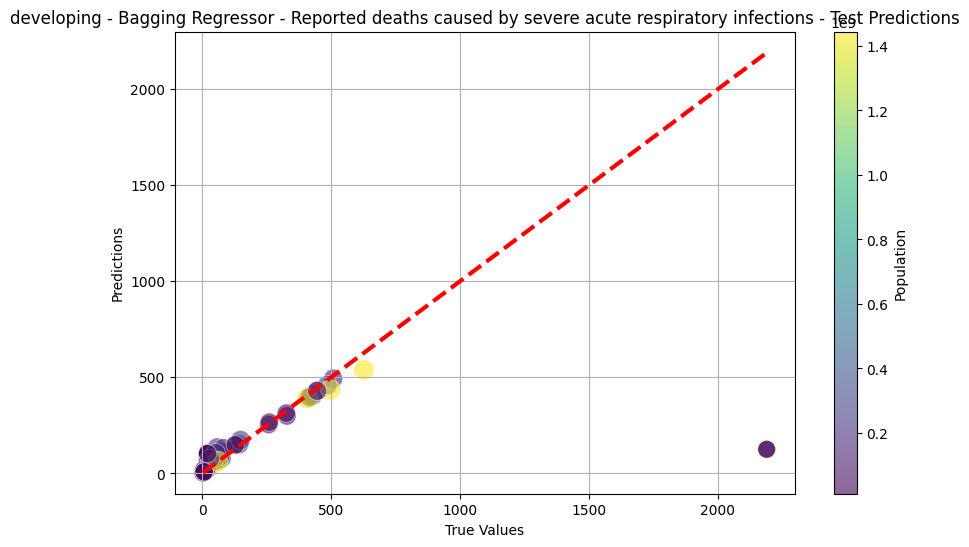

Fitting 5 folds for each of 12 candidates, totalling 60 fits
underdeveloped - total_cases - Validation MSE: 1158139587.91, RMSE: 34031.45, MAE: 14444.57, R2: 0.8523
underdeveloped - total_cases - Test MSE: 676096726.61, RMSE: 26001.86, MAE: 10816.92, R2: 0.9420


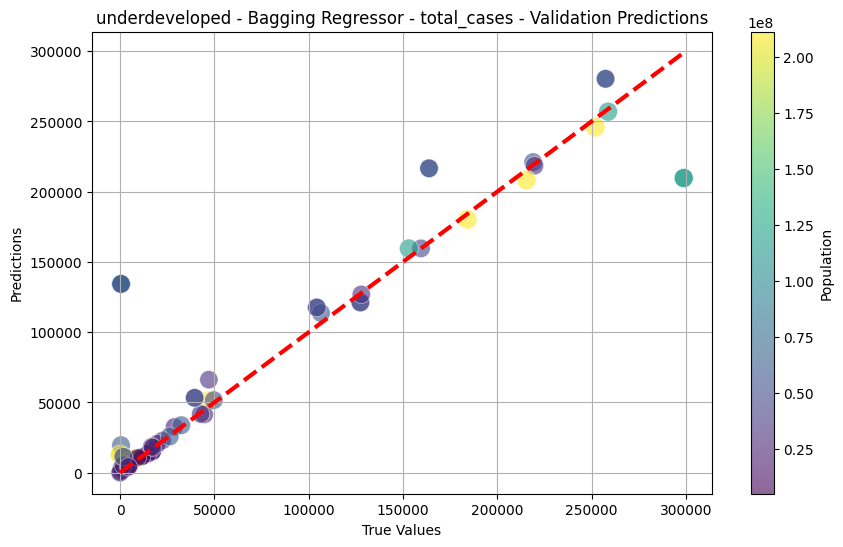

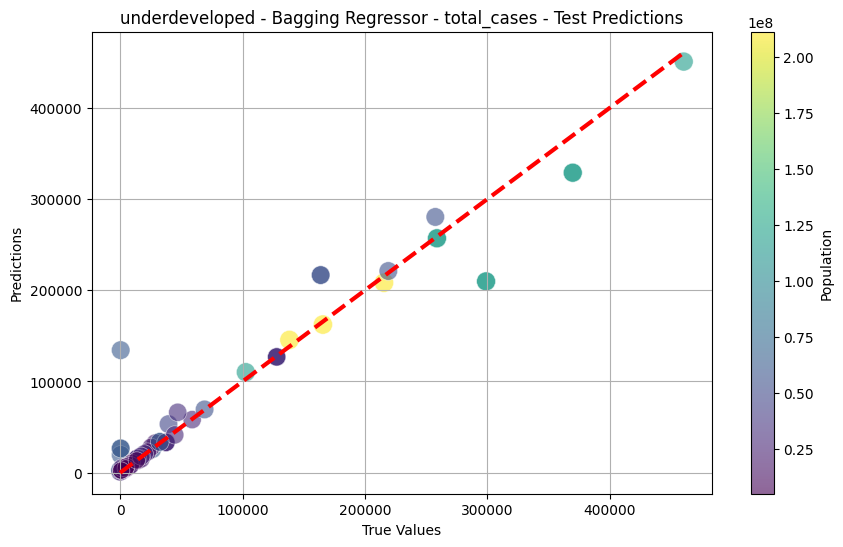

Fitting 5 folds for each of 12 candidates, totalling 60 fits
underdeveloped - total_deaths - Validation MSE: 126196.96, RMSE: 355.24, MAE: 210.47, R2: 0.9438
underdeveloped - total_deaths - Test MSE: 88860.78, RMSE: 298.10, MAE: 188.28, R2: 0.9751


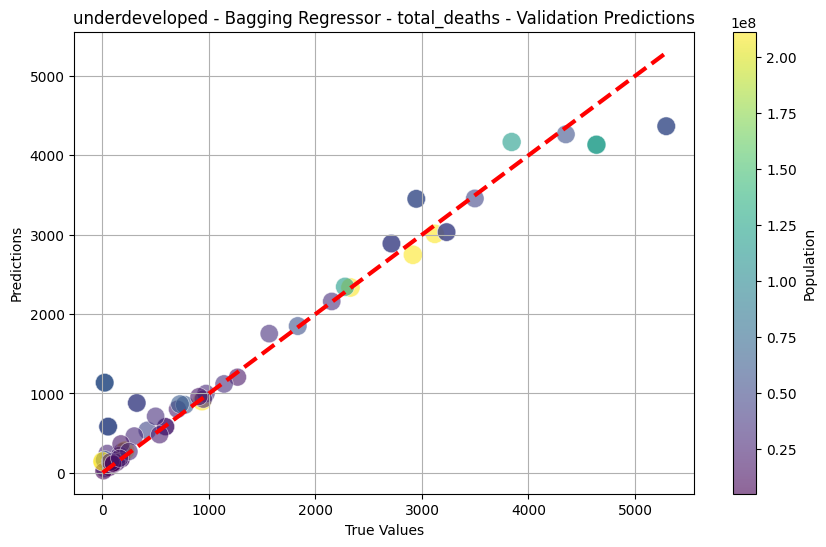

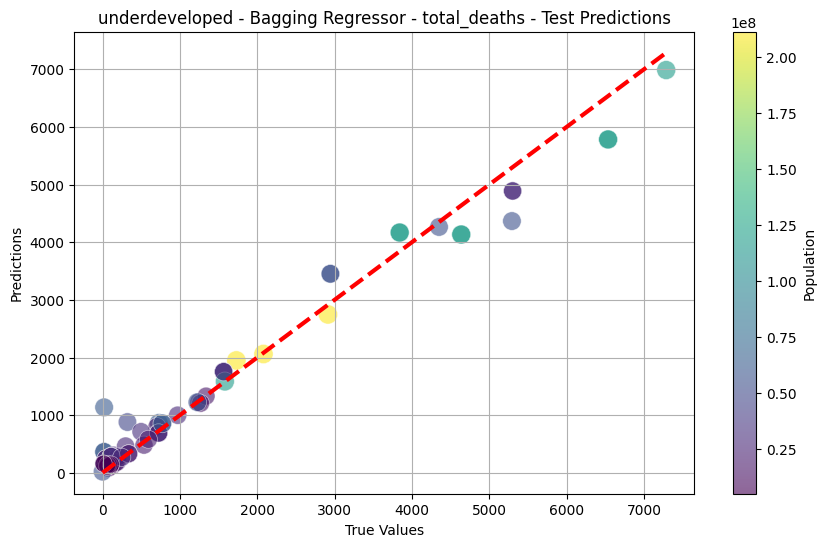

Fitting 5 folds for each of 12 candidates, totalling 60 fits
underdeveloped - All strains - All types of surveillance - Validation MSE: 17895.07, RMSE: 133.77, MAE: 70.62, R2: 0.9595
underdeveloped - All strains - All types of surveillance - Test MSE: 24504.12, RMSE: 156.54, MAE: 92.17, R2: 0.9740


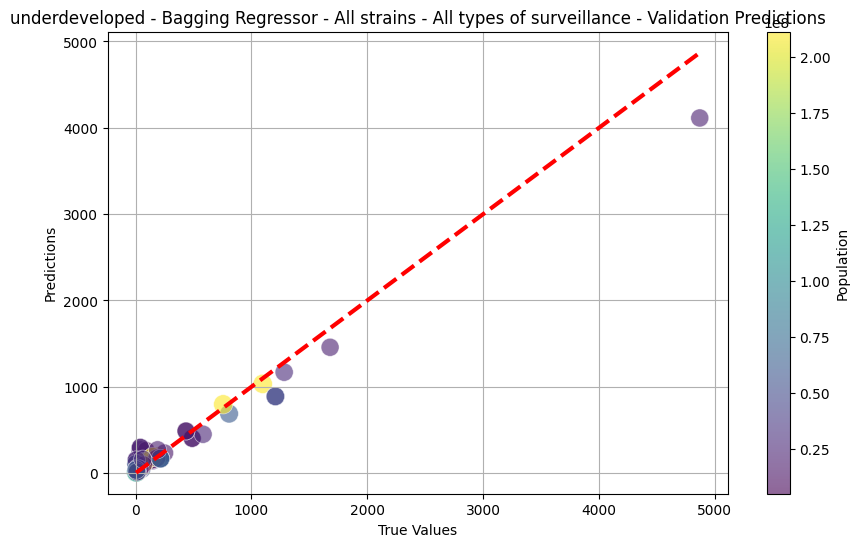

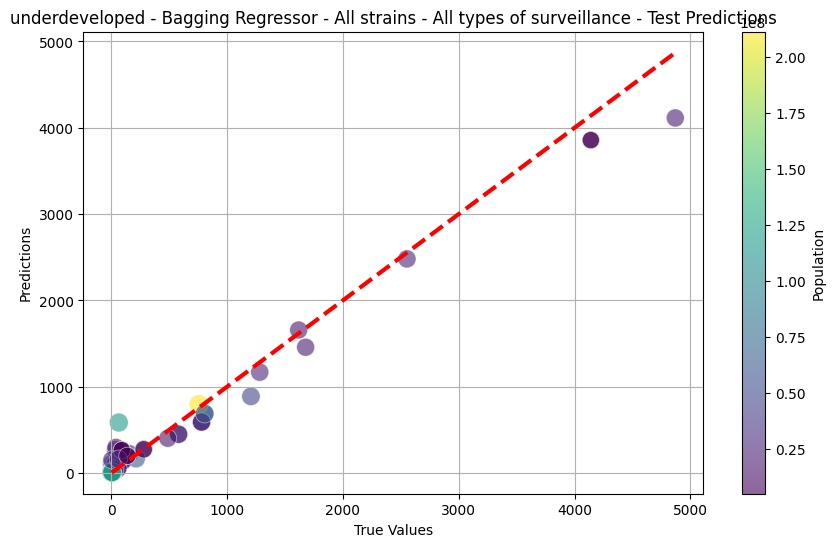

Fitting 5 folds for each of 12 candidates, totalling 60 fits
underdeveloped - Reported deaths caused by severe acute respiratory infections - Validation MSE: 15462.64, RMSE: 124.35, MAE: 59.66, R2: 0.7606
underdeveloped - Reported deaths caused by severe acute respiratory infections - Test MSE: 19153.07, RMSE: 138.39, MAE: 59.34, R2: 0.6288


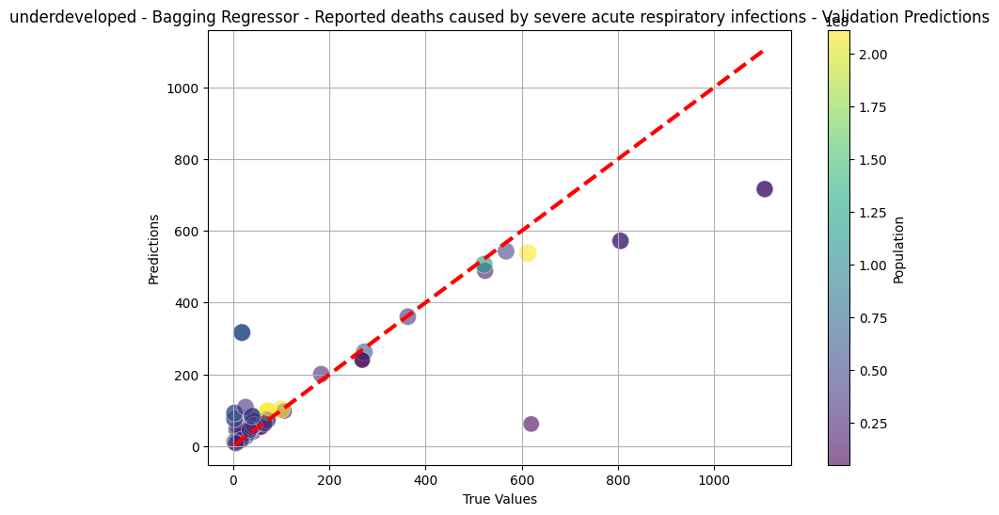

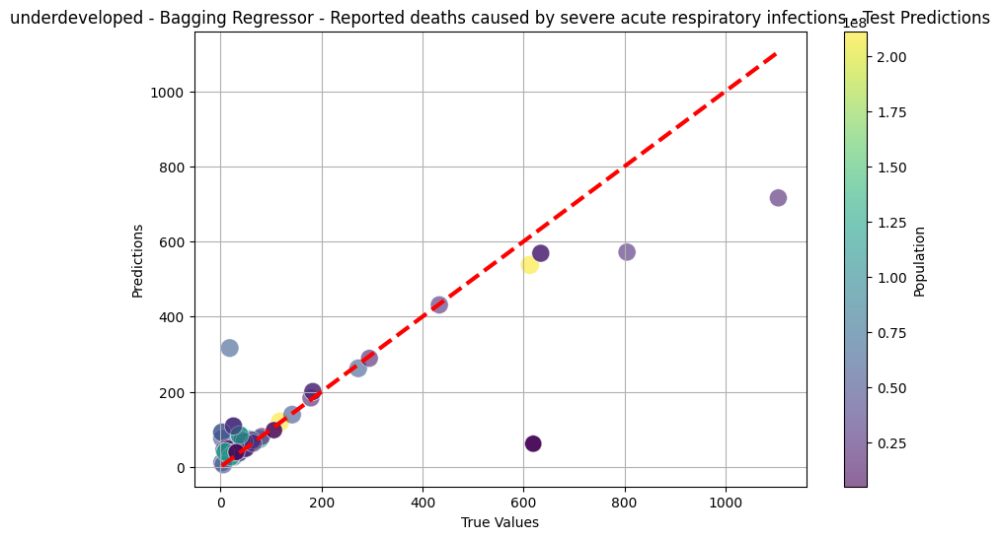

Fitting 5 folds for each of 12 candidates, totalling 60 fits
island - total_cases - Validation MSE: 18249386890.48, RMSE: 135090.29, MAE: 45579.23, R2: 0.9671
island - total_cases - Test MSE: 11790691052.63, RMSE: 108584.95, MAE: 27687.52, R2: 0.9786


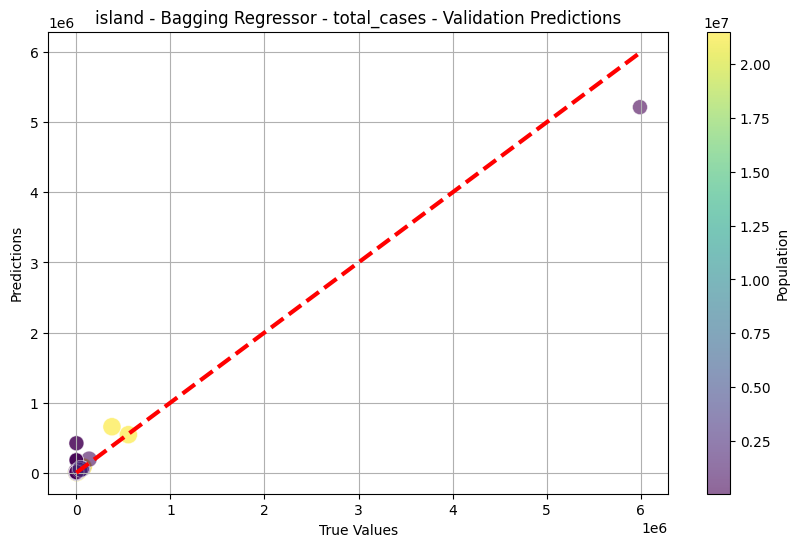

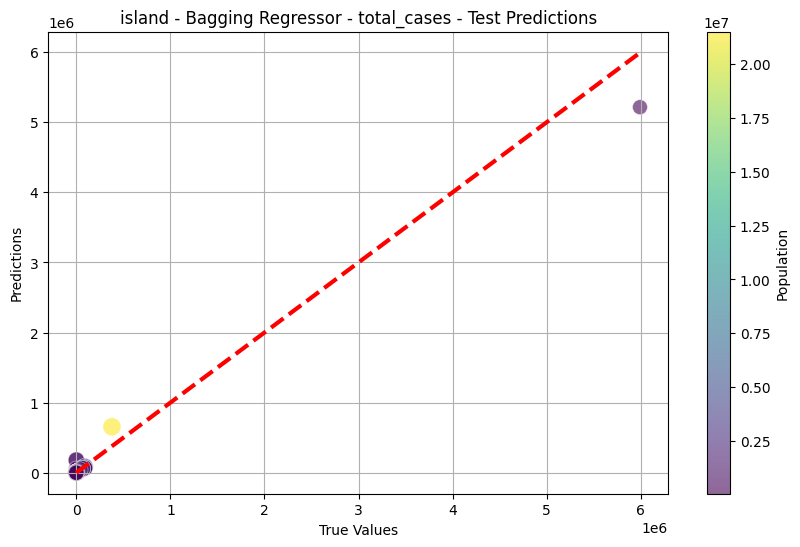

Fitting 5 folds for each of 12 candidates, totalling 60 fits
island - total_deaths - Validation MSE: 91322028.62, RMSE: 9556.26, MAE: 4677.67, R2: 0.8620
island - total_deaths - Test MSE: 138263713.07, RMSE: 11758.56, MAE: 5354.86, R2: 0.8851


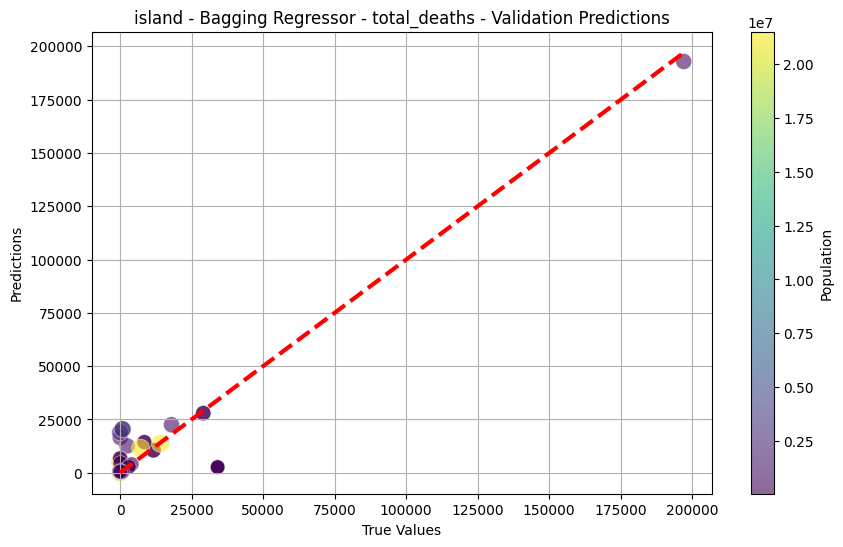

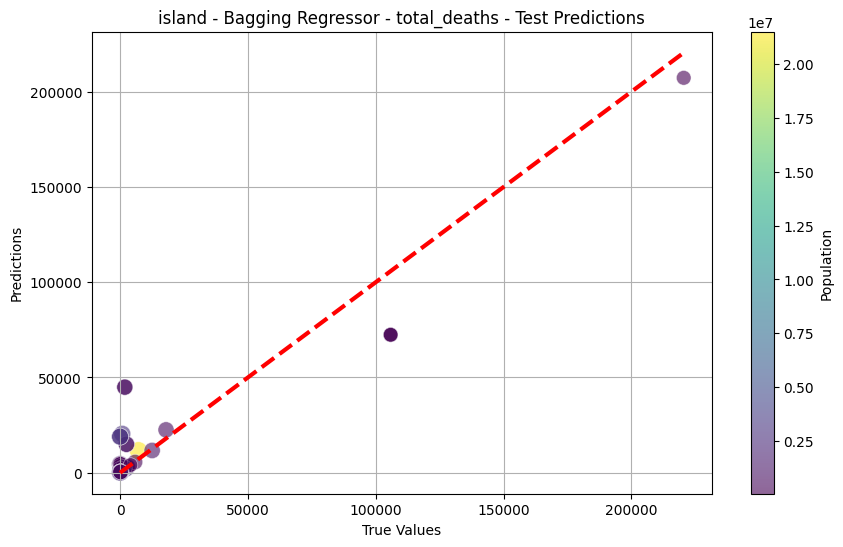

Fitting 5 folds for each of 12 candidates, totalling 60 fits
island - All strains - All types of surveillance - Validation MSE: 91360.17, RMSE: 302.26, MAE: 138.06, R2: 0.7081
island - All strains - All types of surveillance - Test MSE: 150432.11, RMSE: 387.86, MAE: 171.77, R2: 0.6856


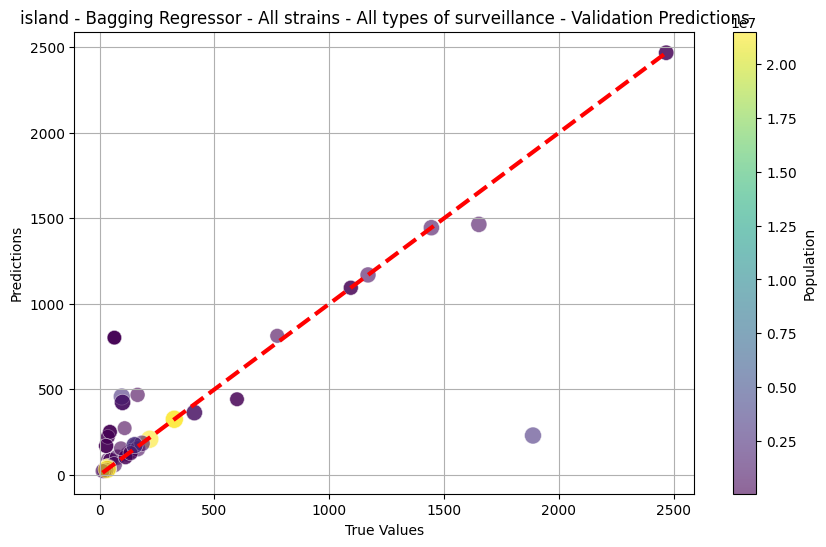

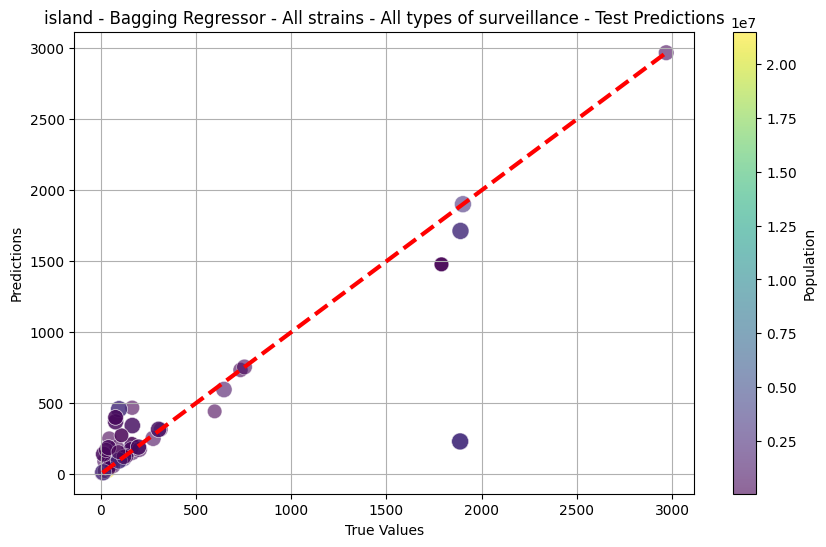

Fitting 5 folds for each of 12 candidates, totalling 60 fits
island - Reported deaths caused by severe acute respiratory infections - Validation MSE: 2706.13, RMSE: 52.02, MAE: 33.88, R2: 0.9152
island - Reported deaths caused by severe acute respiratory infections - Test MSE: 6382.54, RMSE: 79.89, MAE: 44.68, R2: 0.9024


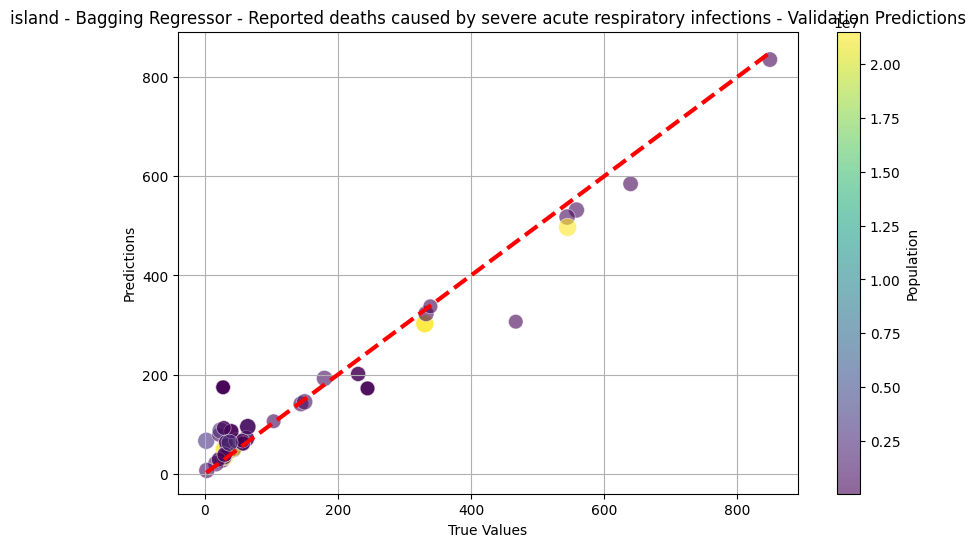

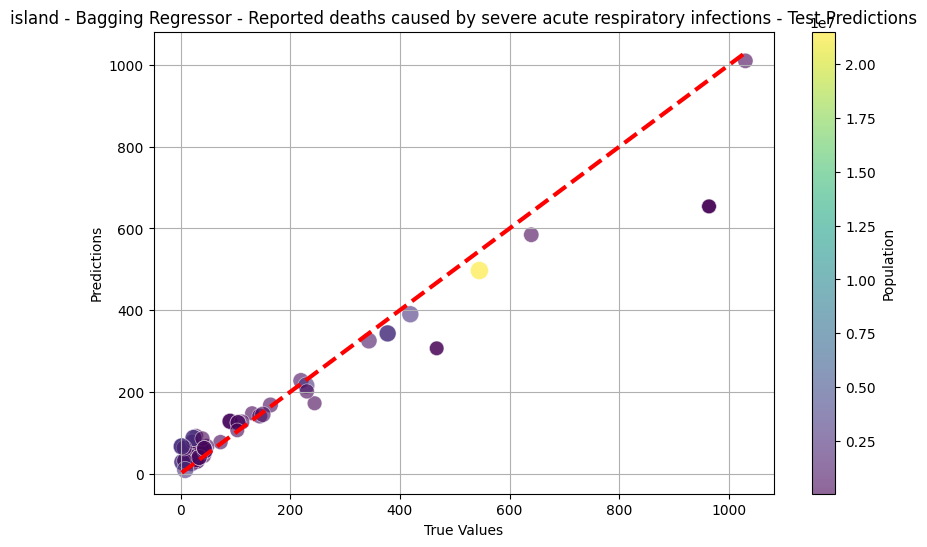

In [36]:
#BAGGING REGRESSION WITH GRIDSEARCHCV
# Load your merged data here
project_merged_data = pd.read_csv("/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv")

# Define target variables for both COVID-19 and Influenza
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Function to evaluate model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Function to plot predictions with color bar
def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')
    plt.show()

# Function to impute missing values using KNN
def impute_missing_values(X):
    imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
    X_imputed = imputer.fit_transform(X)
    X_imputed = pd.DataFrame(X_imputed, columns=X.columns)
    return X_imputed

# Function to preprocess data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    # Impute missing values using KNN
    data = impute_missing_values(data)
    return data

# Function to train and evaluate Bagging Regressor
def train_evaluate_bagging(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with 0.")
        y = y.fillna(0)

    # Split data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Subset the populations for validation and test sets
    populations_val = populations.loc[X_val.index]
    populations_test = populations.loc[X_test.index]

    # Initialize the Bagging Regressor
    base_model = DecisionTreeRegressor(random_state=42)
    model = BaggingRegressor(estimator=base_model, random_state=42)

    # Set up the parameter grid for hyperparameter tuning
    param_grid = {
        'n_estimators': [10, 50, 100],
        'max_samples': [0.5, 1.0],
        'max_features': [0.5, 1.0]
    }

    # Use GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)

    # Best model from GridSearchCV
    best_model = grid_search.best_estimator_

    # Validate the model
    y_val_pred = best_model.predict(X_val)
    val_mse, val_rmse, val_mae, val_r2 = evaluate_model(y_val, y_val_pred)
    print(f'{category} - {target} - Validation MSE: {val_mse:.2f}, RMSE: {val_rmse:.2f}, MAE: {val_mae:.2f}, R2: {val_r2:.4f}')

    # Test the model
    y_test_pred = best_model.predict(X_test)
    test_mse, test_rmse, test_mae, test_r2 = evaluate_model(y_test, y_test_pred)
    print(f'{category} - {target} - Test MSE: {test_mse:.2f}, RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R2: {test_r2:.4f}')

    # Plot predictions
    plot_predictions(y_val, y_val_pred, populations_val, f"{category} - Bagging Regressor - {target} - Validation Predictions")
    plot_predictions(y_test, y_test_pred, populations_test, f"{category} - Bagging Regressor - {target} - Test Predictions")

    return best_model

# Filter and preprocess data
def filter_and_preprocess_data(data, country_list):
    filtered_data = data[data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    return filtered_data

# Define country lists for each category
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Define features
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population']]

# Apply the Bagging model to each category and target
for category, country_list in country_categories.items():
    filtered_data = filter_and_preprocess_data(project_merged_data, country_list)
    for target in target_variables:
        model = train_evaluate_bagging(filtered_data, category, target)


VOTING REGRESSION

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developed - total_cases - Validation MSE: 42195151822.38, RMSE: 205414.59, MAE: 81903.95, R2: 0.9969
developed - total_cases - Test MSE: 101013699322.24, RMSE: 317826.52, MAE: 123227.51, R2: 0.9727


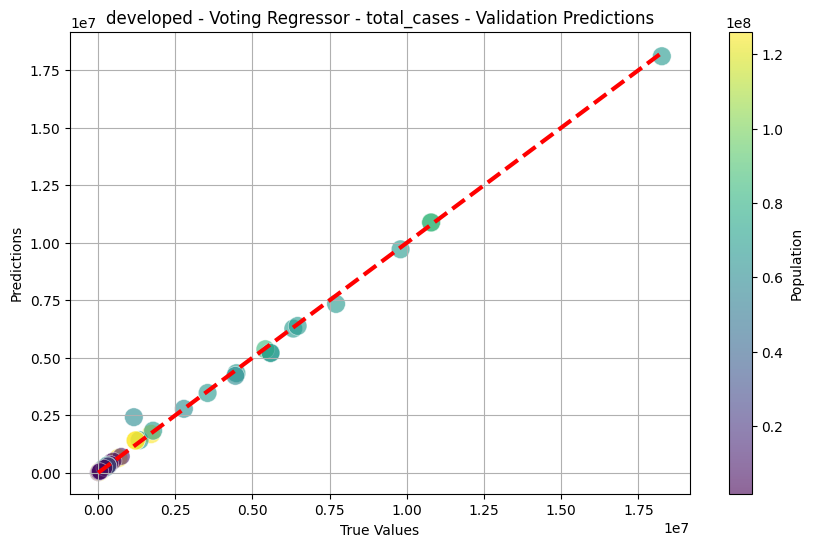

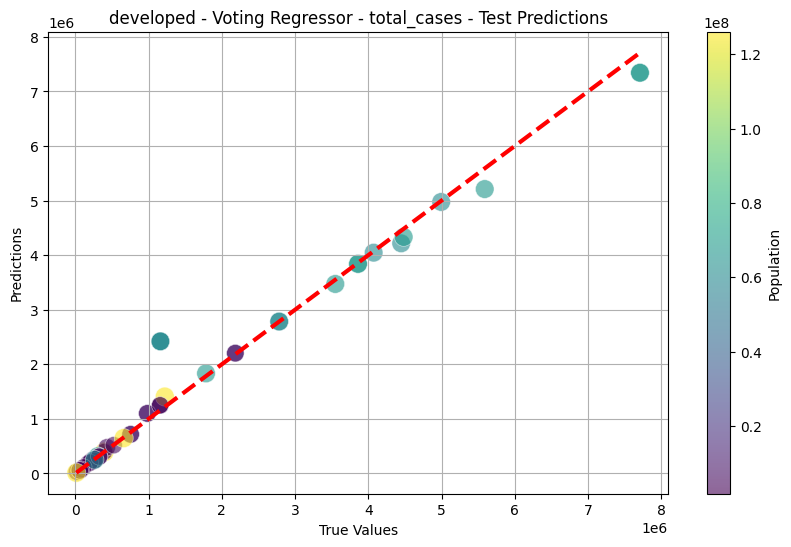

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developed - total_deaths - Validation MSE: 28789563.88, RMSE: 5365.59, MAE: 1518.32, R2: 0.9878
developed - total_deaths - Test MSE: 79612233.09, RMSE: 8922.57, MAE: 3342.64, R2: 0.9605


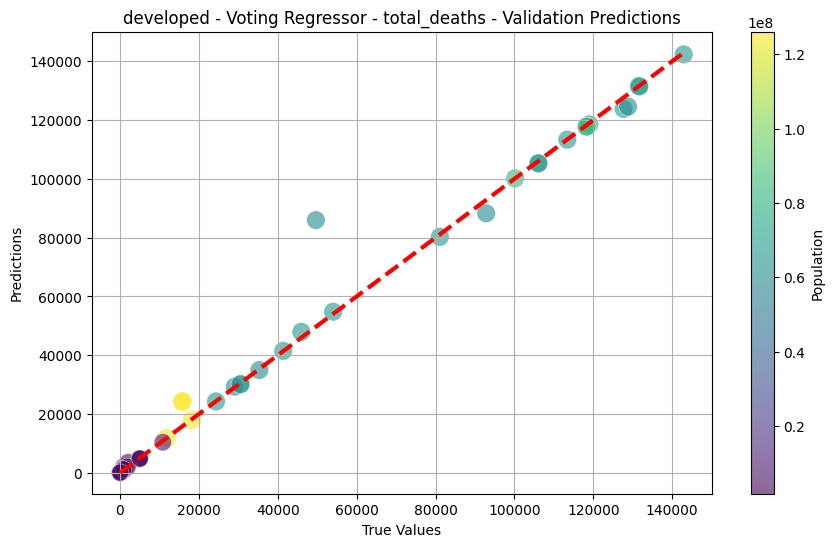

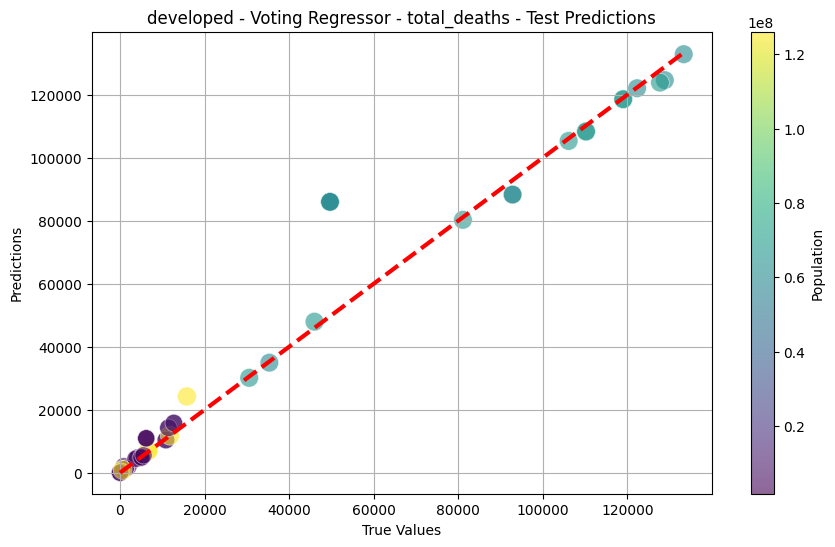

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developed - All strains - All types of surveillance - Validation MSE: 15891.51, RMSE: 126.06, MAE: 88.10, R2: 0.9323
developed - All strains - All types of surveillance - Test MSE: 26704.56, RMSE: 163.42, MAE: 99.85, R2: 0.9577


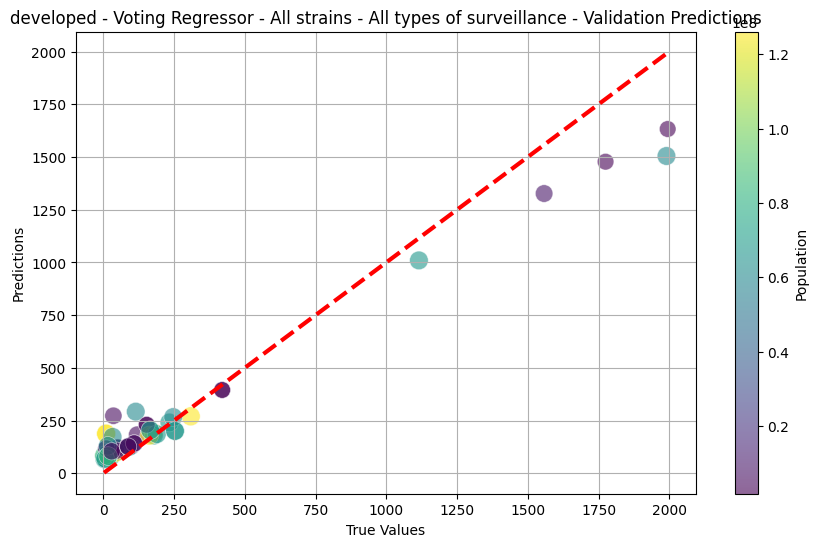

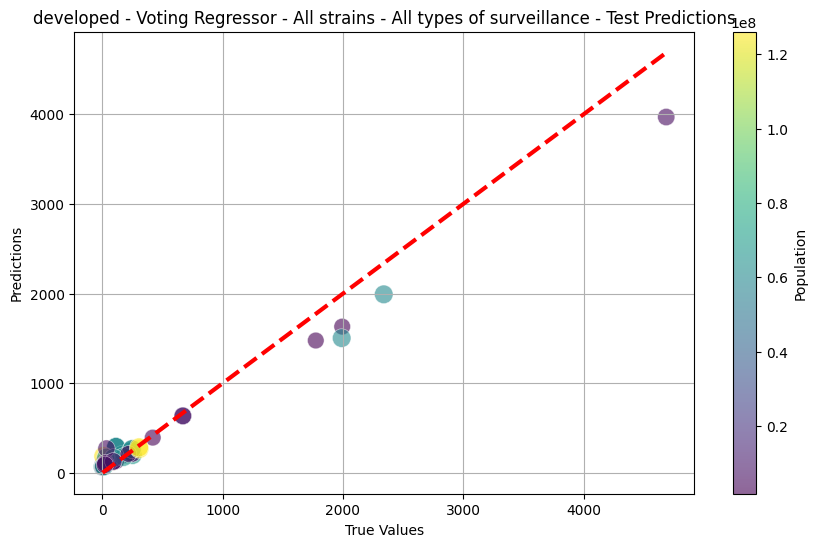

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developed - Reported deaths caused by severe acute respiratory infections - Validation MSE: 756.68, RMSE: 27.51, MAE: 14.25, R2: 0.9863
developed - Reported deaths caused by severe acute respiratory infections - Test MSE: 1460.15, RMSE: 38.21, MAE: 22.05, R2: 0.9701


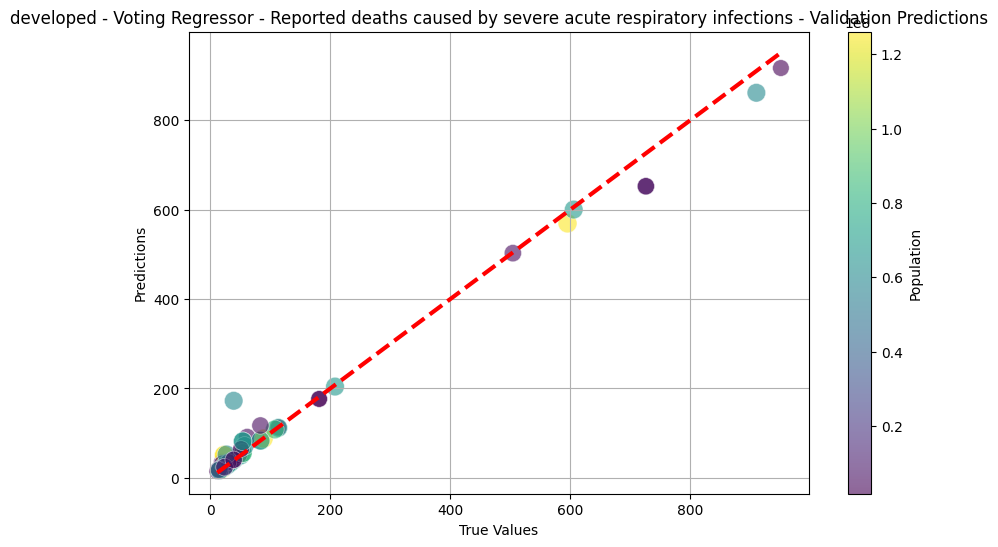

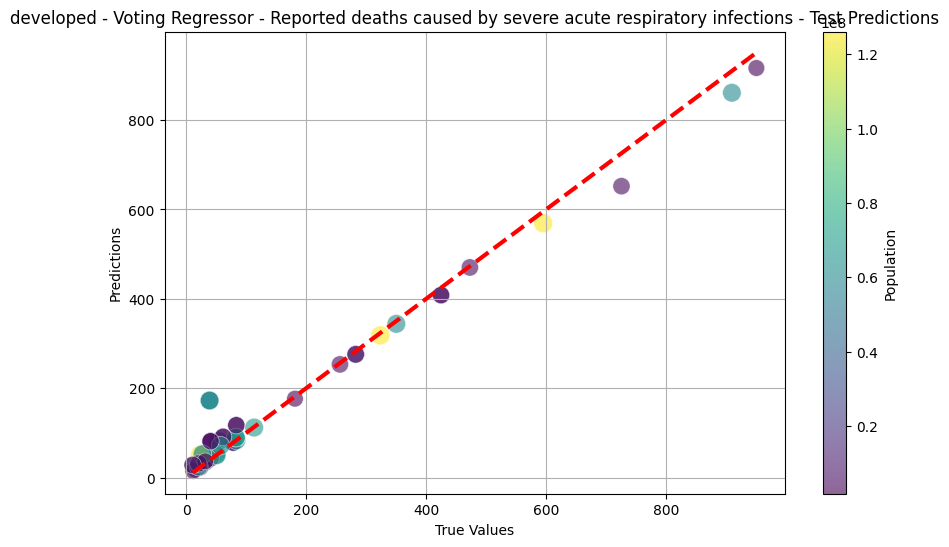

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developing - total_cases - Validation MSE: 181662807278.78, RMSE: 426219.20, MAE: 190689.34, R2: 0.9967
developing - total_cases - Test MSE: 236095767351.44, RMSE: 485896.87, MAE: 220959.97, R2: 0.9973


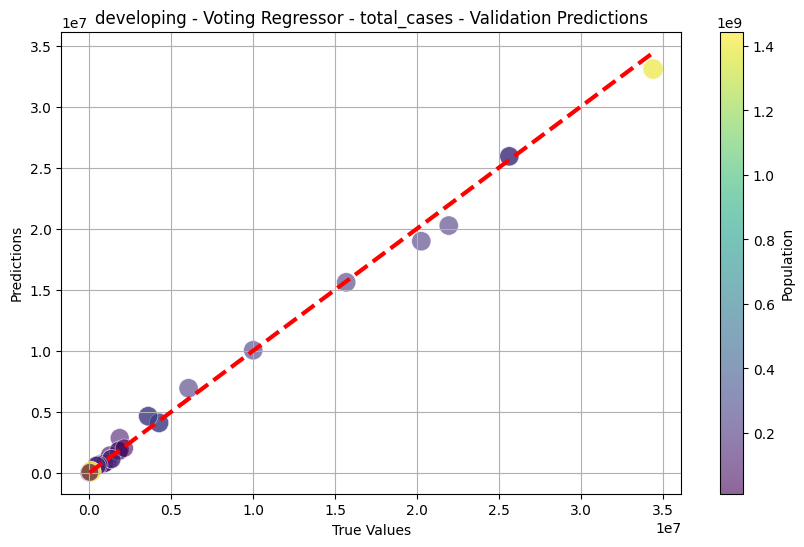

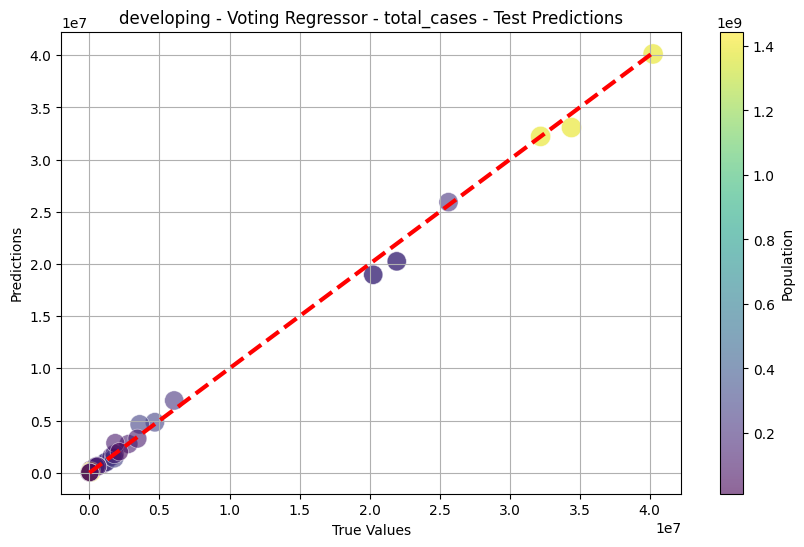

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developing - total_deaths - Validation MSE: 1397182354.23, RMSE: 37378.90, MAE: 20532.52, R2: 0.9515
developing - total_deaths - Test MSE: 1733063108.76, RMSE: 41630.07, MAE: 22199.33, R2: 0.9493


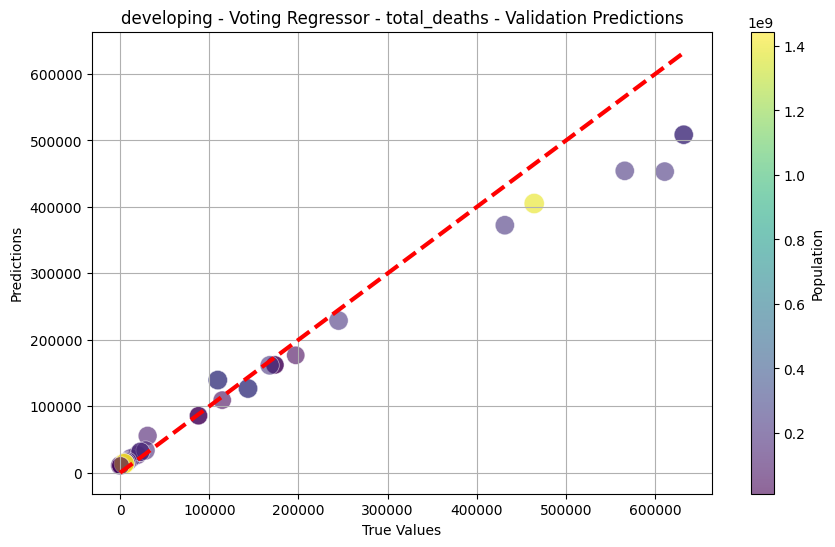

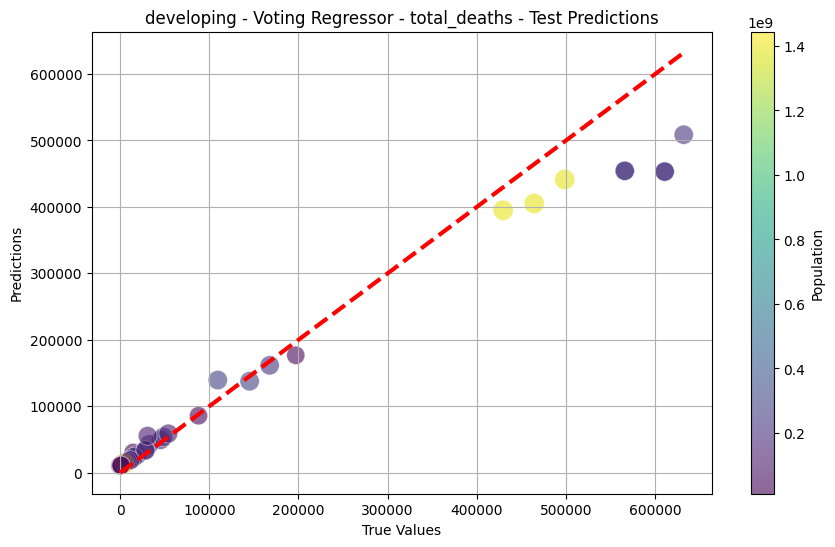

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developing - All strains - All types of surveillance - Validation MSE: 25814.80, RMSE: 160.67, MAE: 72.34, R2: 0.8754
developing - All strains - All types of surveillance - Test MSE: 17025.65, RMSE: 130.48, MAE: 54.04, R2: 0.9292


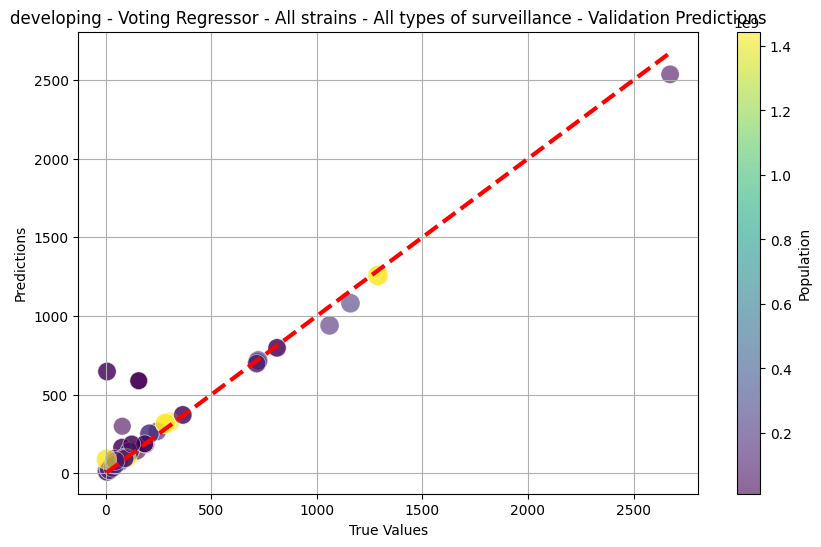

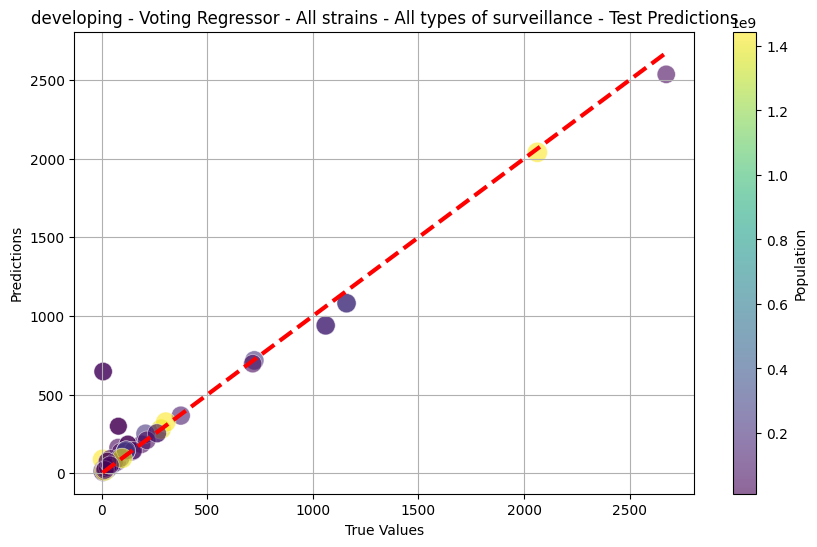

Fitting 5 folds for each of 27 candidates, totalling 135 fits
developing - Reported deaths caused by severe acute respiratory infections - Validation MSE: 157865.01, RMSE: 397.32, MAE: 87.07, R2: 0.0973
developing - Reported deaths caused by severe acute respiratory infections - Test MSE: 155177.88, RMSE: 393.93, MAE: 83.59, R2: 0.0489


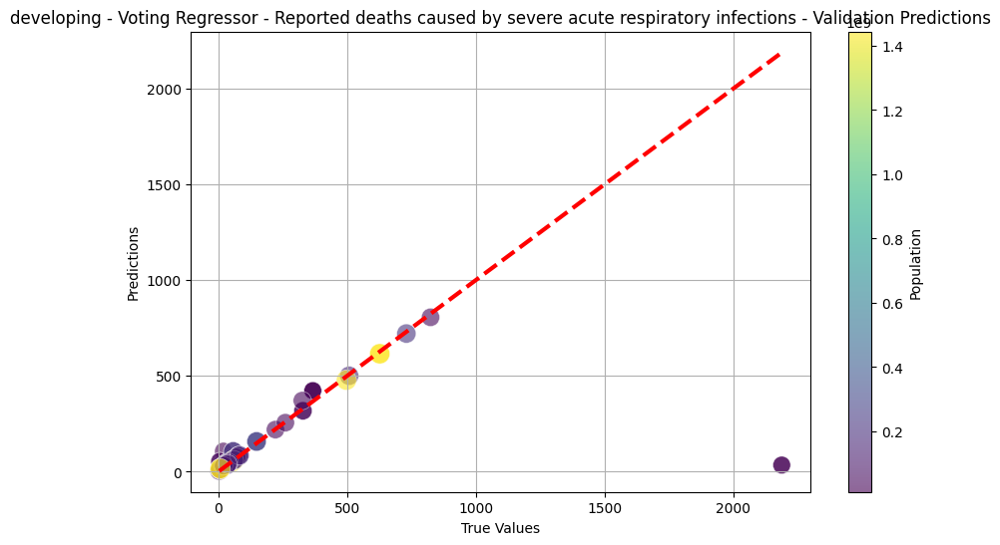

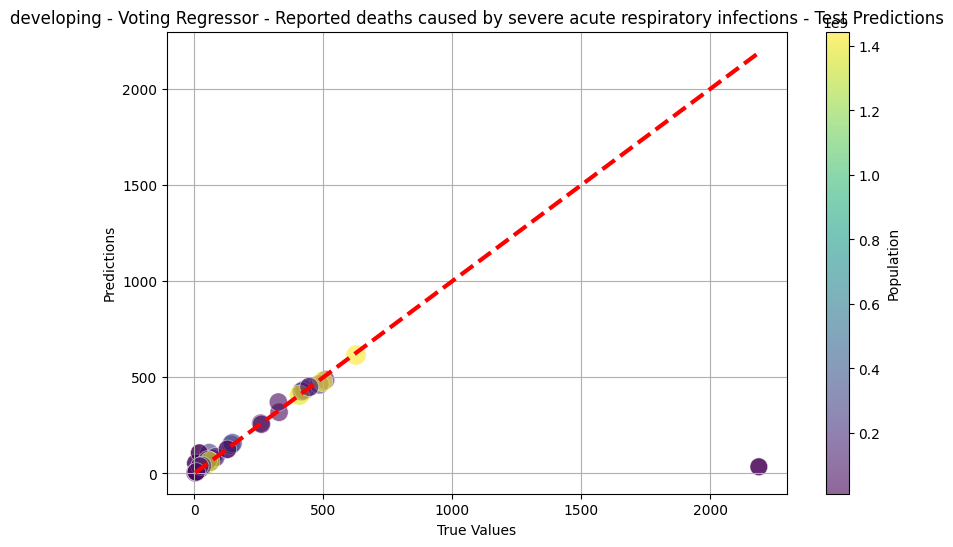

Fitting 5 folds for each of 27 candidates, totalling 135 fits
underdeveloped - total_cases - Validation MSE: 1822242907.14, RMSE: 42687.74, MAE: 13354.83, R2: 0.7676
underdeveloped - total_cases - Test MSE: 1518203271.41, RMSE: 38964.13, MAE: 10767.30, R2: 0.8697


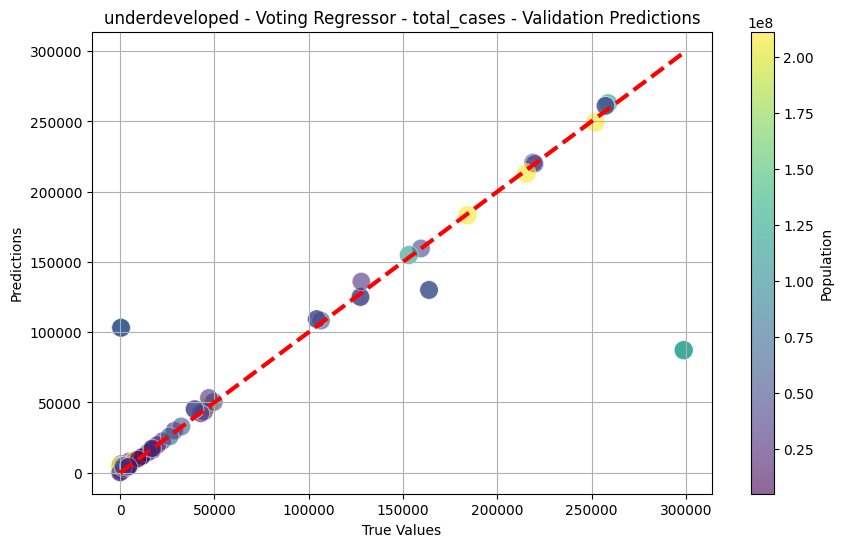

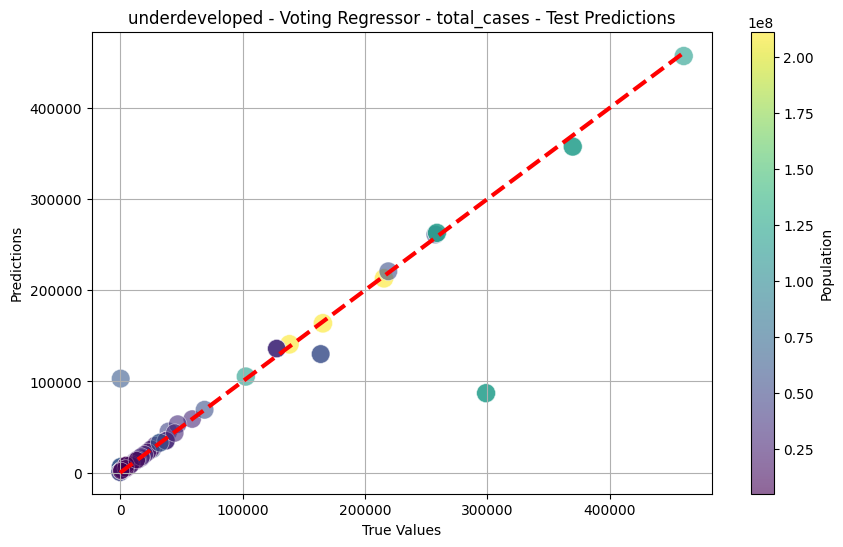

Fitting 5 folds for each of 27 candidates, totalling 135 fits
underdeveloped - total_deaths - Validation MSE: 212130.77, RMSE: 460.58, MAE: 172.75, R2: 0.9055
underdeveloped - total_deaths - Test MSE: 133325.72, RMSE: 365.14, MAE: 154.27, R2: 0.9626


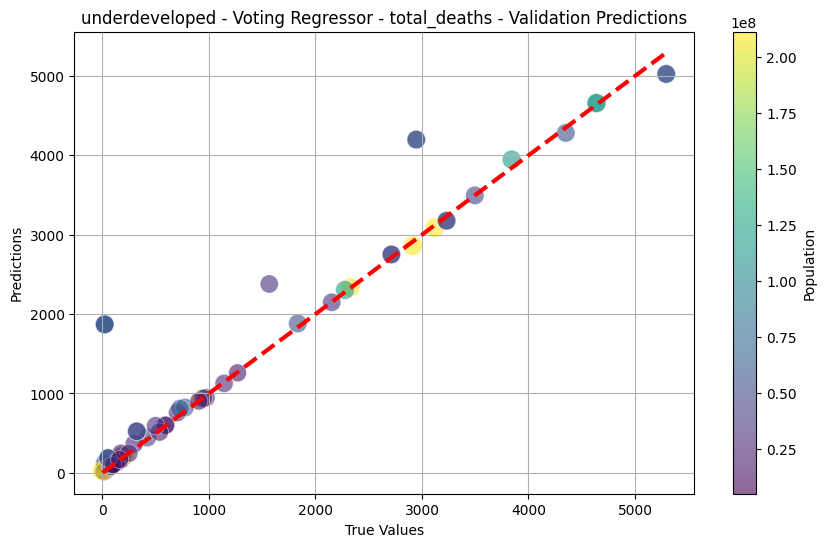

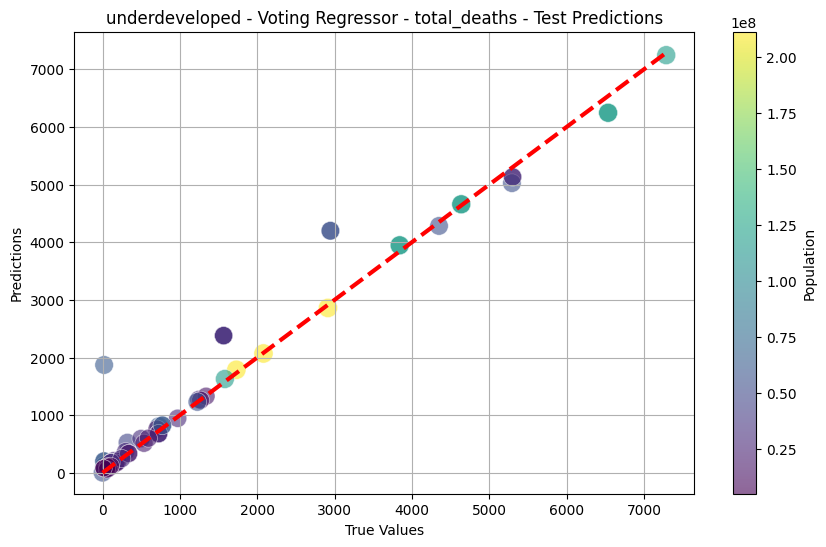

Fitting 5 folds for each of 27 candidates, totalling 135 fits
underdeveloped - All strains - All types of surveillance - Validation MSE: 2166.66, RMSE: 46.55, MAE: 25.87, R2: 0.9951
underdeveloped - All strains - All types of surveillance - Test MSE: 2719.29, RMSE: 52.15, MAE: 30.01, R2: 0.9971


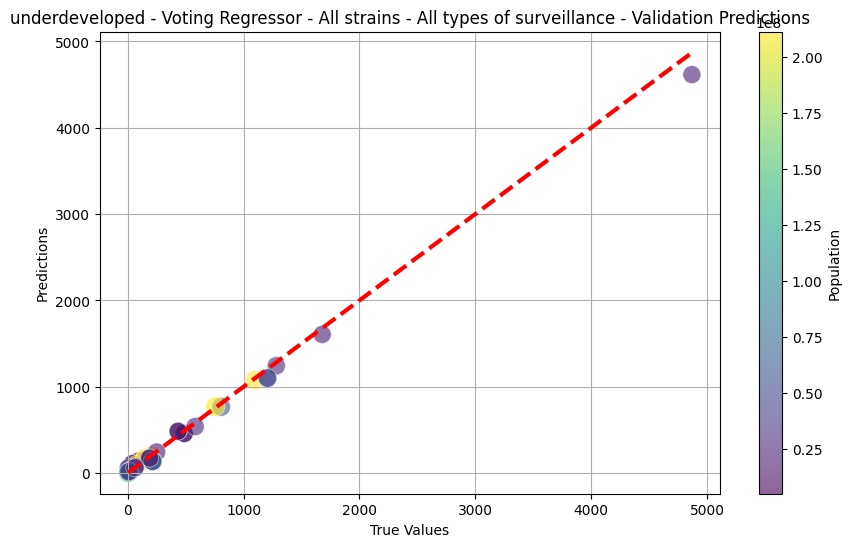

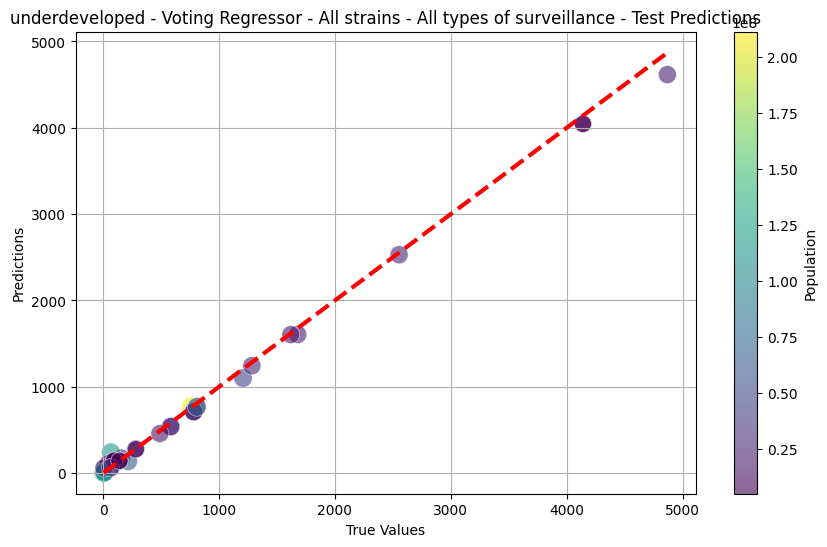

Fitting 5 folds for each of 27 candidates, totalling 135 fits
underdeveloped - Reported deaths caused by severe acute respiratory infections - Validation MSE: 10037.71, RMSE: 100.19, MAE: 35.80, R2: 0.8446
underdeveloped - Reported deaths caused by severe acute respiratory infections - Test MSE: 16462.75, RMSE: 128.31, MAE: 40.90, R2: 0.6809


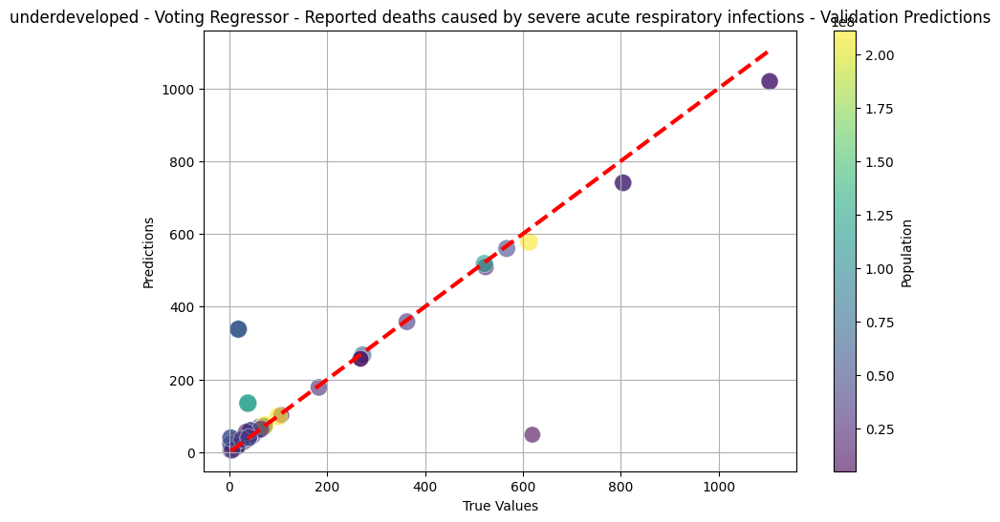

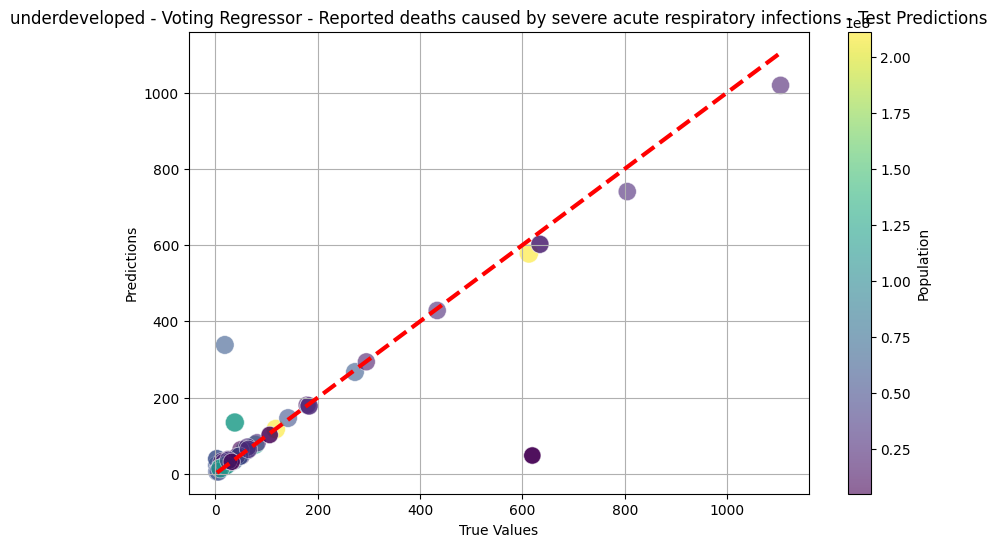

Fitting 5 folds for each of 27 candidates, totalling 135 fits
island - total_cases - Validation MSE: 30617798223.33, RMSE: 174979.42, MAE: 42448.55, R2: 0.9447
island - total_cases - Test MSE: 29438989308.50, RMSE: 171577.94, MAE: 36360.38, R2: 0.9466


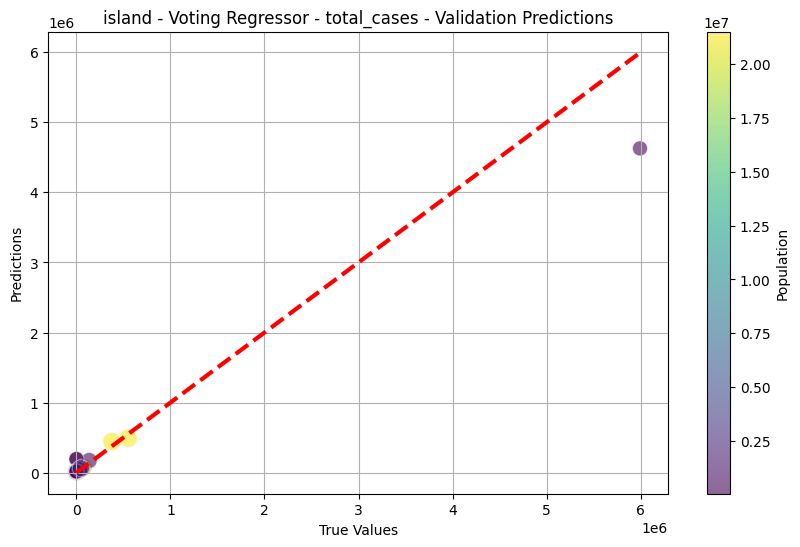

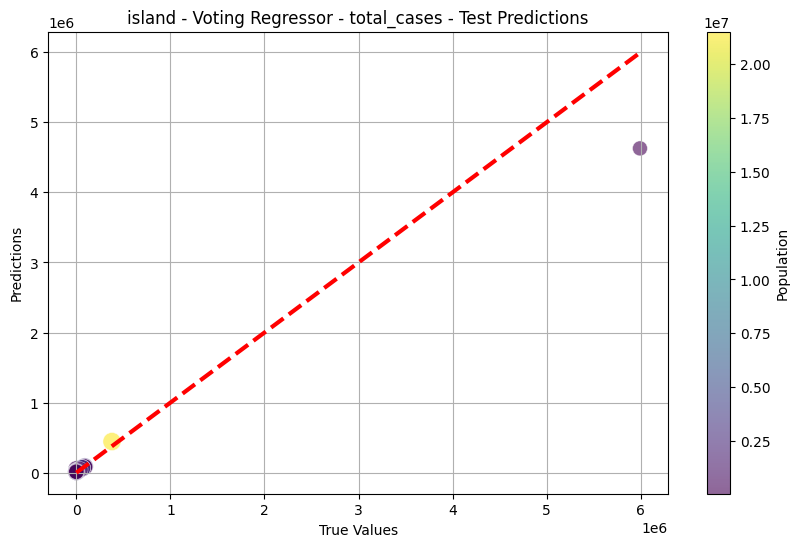

Fitting 5 folds for each of 27 candidates, totalling 135 fits
island - total_deaths - Validation MSE: 62139653.17, RMSE: 7882.87, MAE: 2353.00, R2: 0.9061
island - total_deaths - Test MSE: 11498972.23, RMSE: 3391.01, MAE: 1383.30, R2: 0.9904


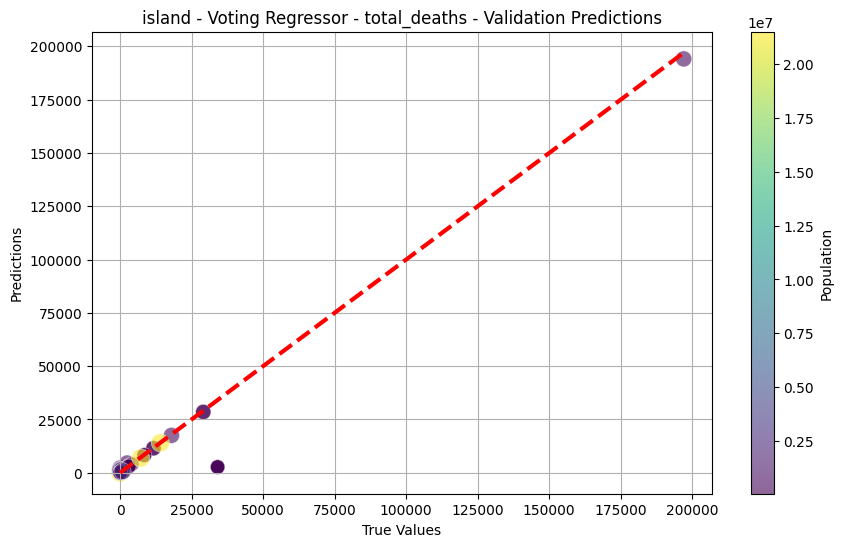

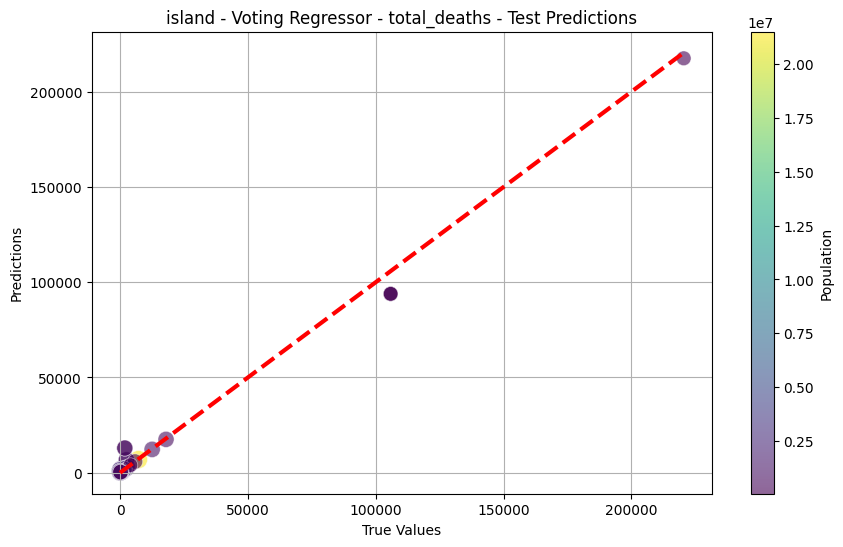

Fitting 5 folds for each of 27 candidates, totalling 135 fits
island - All strains - All types of surveillance - Validation MSE: 73441.80, RMSE: 271.00, MAE: 103.89, R2: 0.7653
island - All strains - All types of surveillance - Test MSE: 123233.63, RMSE: 351.05, MAE: 109.24, R2: 0.7424


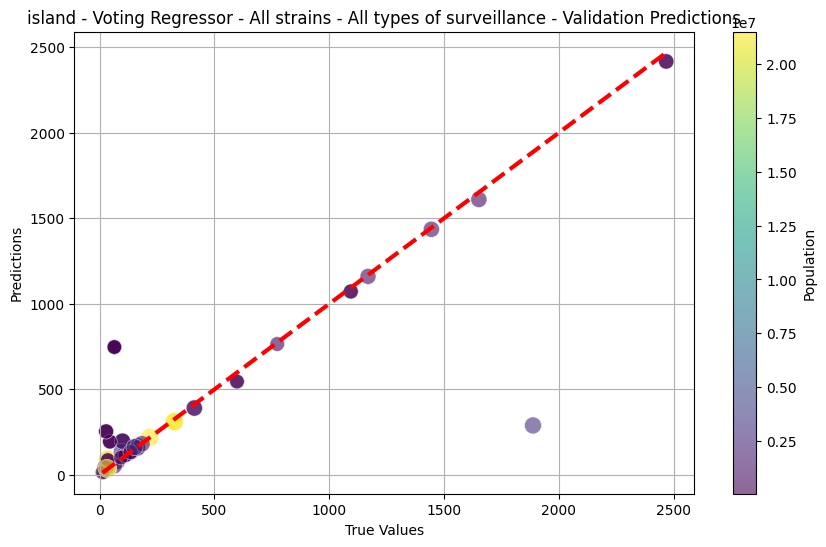

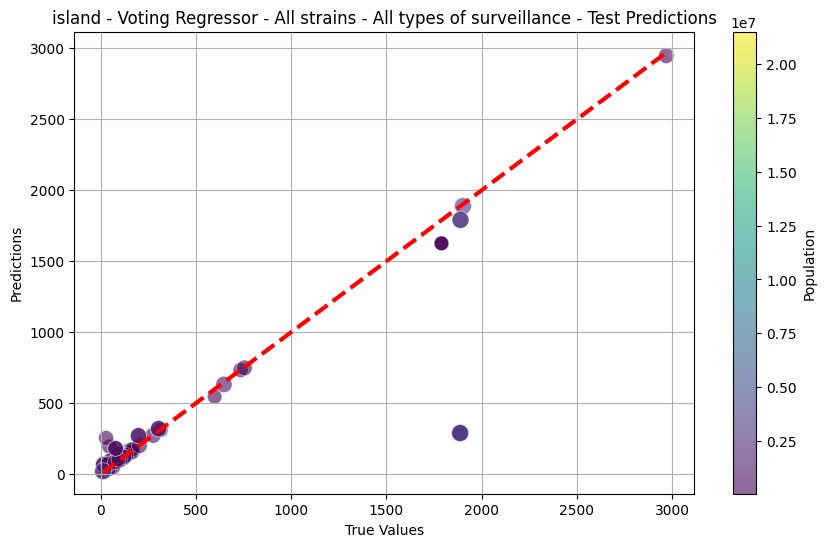

Fitting 5 folds for each of 27 candidates, totalling 135 fits
island - Reported deaths caused by severe acute respiratory infections - Validation MSE: 6103.55, RMSE: 78.13, MAE: 32.52, R2: 0.8086
island - Reported deaths caused by severe acute respiratory infections - Test MSE: 1109.87, RMSE: 33.31, MAE: 18.35, R2: 0.9830


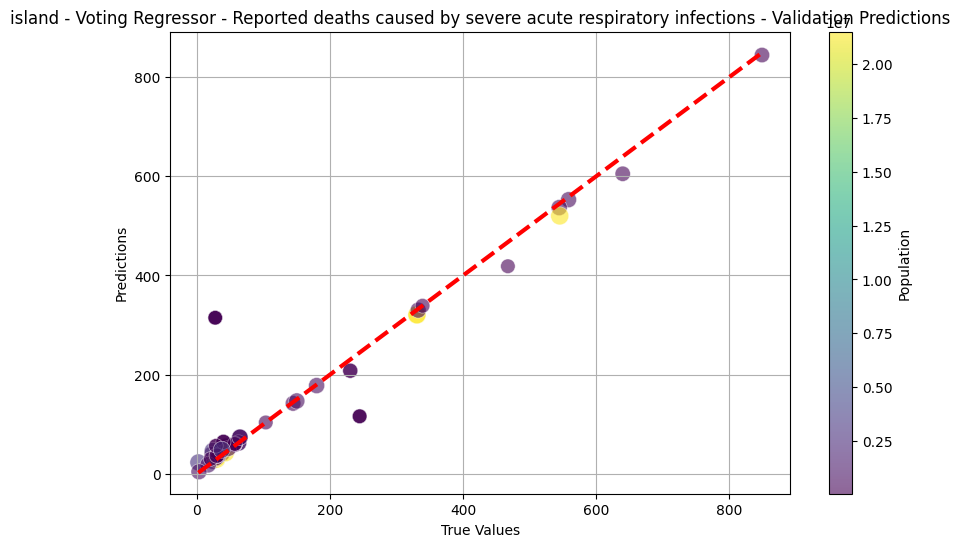

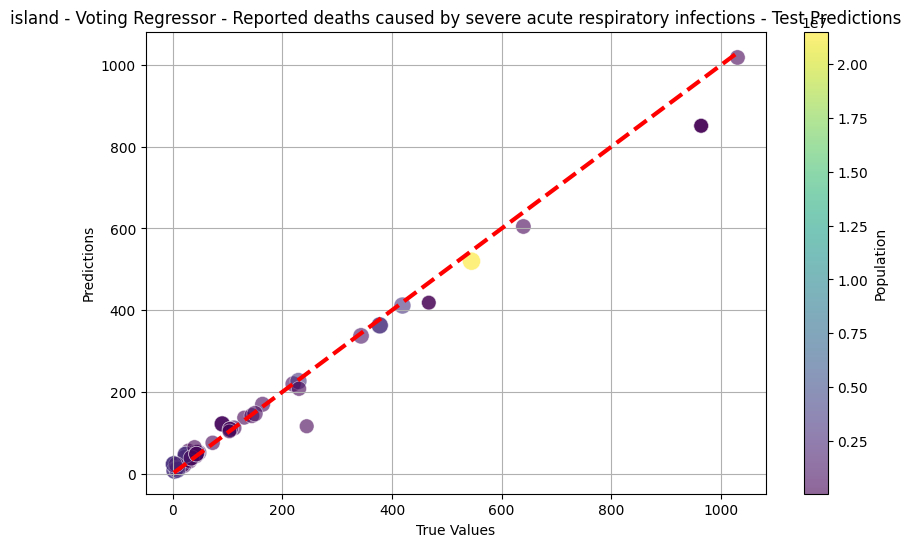

In [37]:
##VOTING REGRESSION WITH GRIDSEARCHCV
# Load your merged data here
project_merged_data = pd.read_csv("/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv")

# Function to impute missing values using KNN
def impute_missing_values(X):
    imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
    X_imputed = imputer.fit_transform(X)
    X_imputed = pd.DataFrame(X_imputed, columns=X.columns)
    return X_imputed

# Function to evaluate model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Function to plot predictions with color bar
def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')
    plt.show()

# Function to preprocess data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    # Impute missing values using KNN
    data = impute_missing_values(data)
    return data

# Function to train and evaluate Voting Regressor
def train_evaluate_voting(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with 0.")
        y = y.fillna(0)

    # Split data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Subset the populations for validation and test sets
    populations_val = populations.loc[X_val.index]
    populations_test = populations.loc[X_test.index]

    # Define the base models
    model1 = DecisionTreeRegressor(random_state=42)
    model2 = RandomForestRegressor(random_state=42)
    model3 = XGBRegressor(random_state=42, objective='reg:squarederror')

    # Create the Voting Regressor
    voting_model = VotingRegressor(estimators=[
        ('dt', model1),
        ('rf', model2),
        ('xgb', model3)
    ])

    # Set up the parameter grid for hyperparameter tuning
    param_grid = {
        'dt__max_depth': [5, 10, 15],
        'rf__n_estimators': [50, 100, 200],
        'xgb__learning_rate': [0.01, 0.1, 0.3]
    }

    # Use GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(estimator=voting_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)

    # Best model from GridSearchCV
    best_model = grid_search.best_estimator_

    # Validate the model
    y_val_pred = best_model.predict(X_val)
    val_mse, val_rmse, val_mae, val_r2 = evaluate_model(y_val, y_val_pred)
    print(f'{category} - {target} - Validation MSE: {val_mse:.2f}, RMSE: {val_rmse:.2f}, MAE: {val_mae:.2f}, R2: {val_r2:.4f}')

    # Test the model
    y_test_pred = best_model.predict(X_test)
    test_mse, test_rmse, test_mae, test_r2 = evaluate_model(y_test, y_test_pred)
    print(f'{category} - {target} - Test MSE: {test_mse:.2f}, RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R2: {test_r2:.4f}')

    # Plot predictions
    plot_predictions(y_val, y_val_pred, populations_val, f"{category} - Voting Regressor - {target} - Validation Predictions")
    plot_predictions(y_test, y_test_pred, populations_test, f"{category} - Voting Regressor - {target} - Test Predictions")

    return best_model

# Define the target variables
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define the feature variables (independent variables)
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population']]

# Define country lists for each category
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Filter and preprocess data
def filter_and_preprocess_data(data, country_list):
    filtered_data = data[data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    return filtered_data

# Apply the Voting Regressor model to each category and target
for category, country_list in country_categories.items():
    filtered_data = filter_and_preprocess_data(project_merged_data, country_list)
    for target in target_variables:
        model = train_evaluate_voting(filtered_data, category, target)


**MODEL COMPARISON**


Average Performance Metrics by Model:
     Model      Test MSE      Test RMSE      Test MAE   Test R²
0  Bagging  2.151737e+11  177464.633912  93794.217884  0.775954
1   Voting  2.564923e+10   62594.030305  23357.450919  0.871992
2  XGBoost  2.151737e+11  177464.633912  93794.217884  0.775954


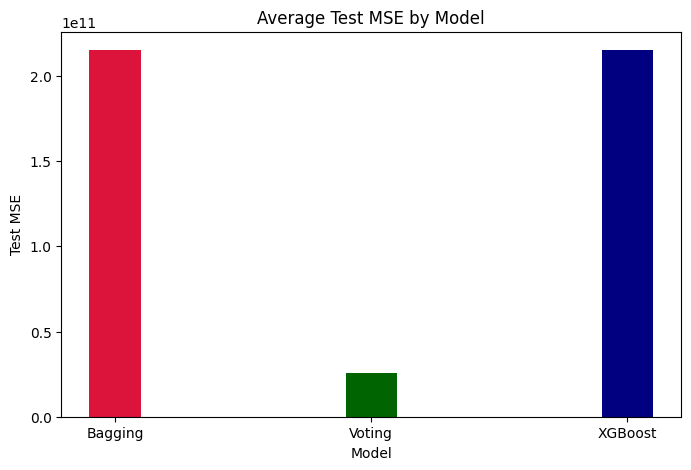

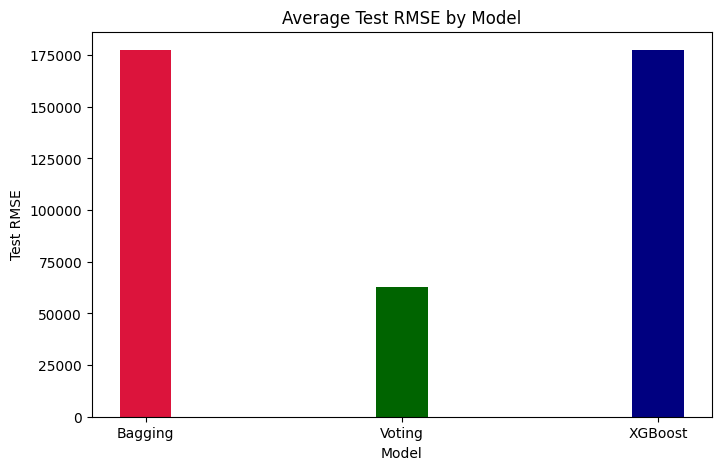

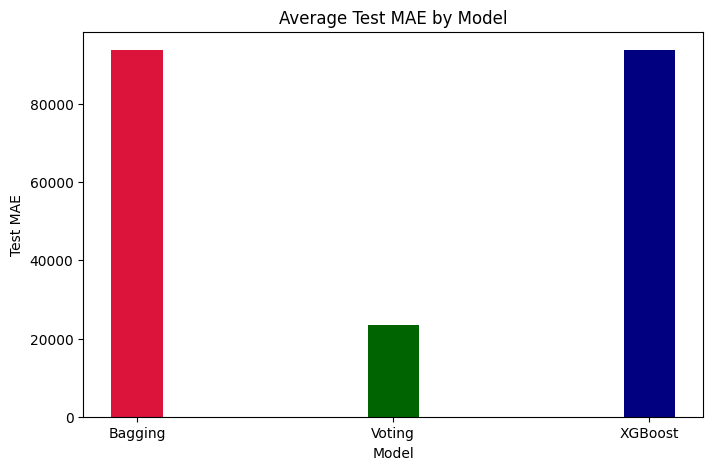

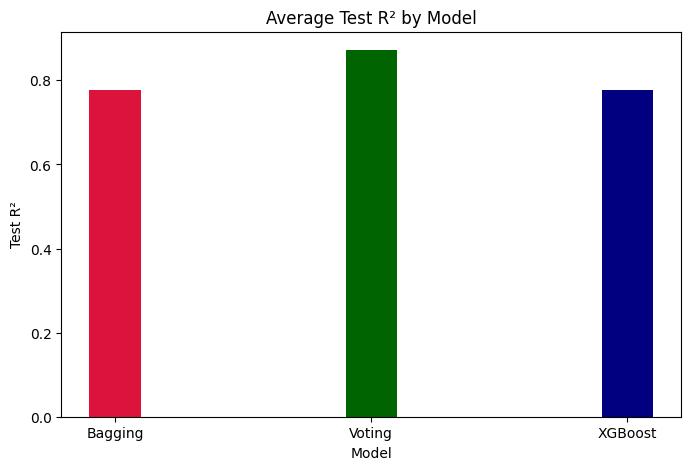

In [57]:
# DataFrames hold the performance metrics
df_xgboost = pd.DataFrame(performance_metrics)
df_bagging = pd.DataFrame(bagging_performance_metrics)
df_voting = pd.DataFrame(voting_performance_metrics)

# Adding a column to identify the model type
df_xgboost['Model'] = 'XGBoost'
df_bagging['Model'] = 'Bagging'
df_voting['Model'] = 'Voting'

# Combine all DataFrames into one
all_metrics = pd.concat([df_xgboost, df_bagging, df_voting], ignore_index=True)

# Compute average metrics
average_metrics = all_metrics.groupby('Model').agg({
    'Test MSE': 'mean',
    'Test RMSE': 'mean',
    'Test MAE': 'mean',
    'Test R²': 'mean'
}).reset_index()

print("\nAverage Performance Metrics by Model:")
print(average_metrics)

# Plot metrics
for metric in ['Test MSE', 'Test RMSE', 'Test MAE', 'Test R²']:
    plt.figure(figsize=(8, 5))
    plt.bar(average_metrics['Model'], average_metrics[metric],width=0.2,color=['crimson', 'darkgreen', 'navy'])
    plt.title(f'Average {metric} by Model')
    plt.xlabel('Model')
    plt.ylabel(metric)
    plt.show()
